In [1]:
import os
import astropy
import requests
import pandas as pd
import numpy as np
import lightkurve as lk
from scipy.interpolate import interp1d
from astropy.modeling import models, fitting
from astropy.time import Time
import astropy.units as u
import matplotlib.pyplot as plt
import emcee
import sys
import csv
from astropy.timeseries import LombScargle
from os.path import basename, exists

# change these paths to wherever you have the files
# sys.path.insert(1,'/Users/neisner/Documents/code/utils/')
import filters # Suzanne's functions
import norm

# change these paths to wherever you have the files
# sys.path.insert(1,'/Users/neisner/Documents/code/ETV')
import etv_functions # Nora's functions

from importlib import reload

%matplotlib inline

In [2]:
from IPython.display import display, HTML, Javascript, clear_output

display(HTML("<style>.container { width:99% !important; }</style>"))  # Jupyter 6
display(HTML("<style>.jp-Notebook { --jp-notebook-max-width: 98%; }</style>"))  # Jupyter 7

# define the paths where the data will be stores - NEED TO CHANGE THIS TO YOUR OWN PATH
outfile_base = './etv_out'  # for ETV
lk_download_dir = 'C:/dev/_juypter/PH_TESS_LightCurveViewer/data'

# A command from shell that can be run to notify users, e.g., fitting is finished. Use "echo" if you do not have one
NOTIFY_CMD = "win-notify.bat"

if hasattr(lk, "conf"):  # default download dir
    lk.conf.cache_dir = lk_download_dir
if hasattr(lk.search, "sr_cache"):   # PR for persistent query result cache
    lk.search.sr_cache.cache_dir = lk_download_dir  # None
    lk.search.sr_cache.expire_seconds = 86400

## Looking for ETVs in TIC 378275980

- target with clear eclipse depth variations, possibly due to a 3rd body.

In [3]:
# define the plotting parameters

figsize = (8,4)

In [4]:
# import the data

# choose a TIC ID to analyze
ticid = 378275980

# define the paths where the data will be stores - NEED TO CHANGE THIS TO YOUR OWN PATH
outfile_path = f"{outfile_base}/tic{ticid}_etv_primary.csv"
outfile_path_s = f"{outfile_base}/tic{ticid}_etv_secondary.csv"


# import data using Lightkurve
# sr = lk.search_lightcurve('TIC {}'.format(ticid), author = 'SPOC')
if not "../.." in sys.path:
    sys.path.append("../..")
import lightkurve_ext as lke  # at ../../


sr = lk.search_lightcurve('TIC {}'.format(ticid)) 
# use QLP data to increase the baseline
sr = lke.filter_by_priority(sr, author_priority=['QLP'], exptime_priority=['short', 'long', 'fast'])  # 'SPOC', 'TESS-SPOC', 'QLP'
# sr = sr[sr.exptime != 1800 *u.s]  # exclude 30min cadence data for now (TESS-SPOC, sectors 18, 19, 23 )
# sr = sr[np.isin(sr.author, ['SPOC', 'TESS-SPOC'])]  # exclude QLP to ensure for uniformity in the data
sr = lke._sort_chronologically(sr)  # workaround lightkurve v2.4.2+ change in sort order
with astropy.conf.set_temp("max_lines", -1):
    display(sr)
lcc_tess = sr.download_all()

def use_sap_flux(lc):
    """Helper over select_flux("sap_flux") to ensure flux_err is populated for QLP case"""
    if lc.meta.get("AUTHOR") == "QLP":
        # select_flux("sap_flux") on QLP data will lead to nan flux_err
        # because QLP lc only has err on kspsap_flux / det_flux
        return lc
    else:
        return lc.select_flux("sap_flux")

def use_flux(lc):
    # detrended QLP for cleaner data
    return lke.select_flux(lc, ["kspsap_flux", "det_flux"])

lc_tess = lcc_tess.stitch(
    corrector_func=lambda lc: use_flux(lc).normalize()
    # corrector_func=lambda lc: use_sap_flux(lc).normalize()
)
# lc_tess = lc_tess.truncate(None, 1450)  # use data from sectors 2 - 3 for now


search_result = lc_tess

time = search_result.time.value
flux = search_result.flux.value
fluxerr = search_result.flux_err.value
len(search_result)

#,mission,year,author,exptime,target_name,distance,proposal_id
,,,,s,,arcsec,
0,TESS Sector 14,2019,QLP,1800,378275980,0.0,N/A
1,TESS Sector 15,2019,QLP,1800,378275980,0.0,N/A
2,TESS Sector 41,2021,QLP,600,378275980,0.0,N/A
3,TESS Sector 54,2022,QLP,600,378275980,0.0,N/A
4,TESS Sector 55,2022,QLP,600,378275980,0.0,N/A
5,TESS Sector 75,2024,QLP,200,378275980,0.0,N/A
6,TESS Sector 81,2024,QLP,200,378275980,0.0,N/A
7,TESS Sector 82,2024,QLP,200,378275980,0.0,N/A


C:\pkg\_winNonPortables\miniforge3\envs\my_lk_plus\lib\site-packages\numpy\core\fromnumeric.py:771: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedColumn.
  a.partition(kth, axis=axis, kind=kind, order=order)


46700

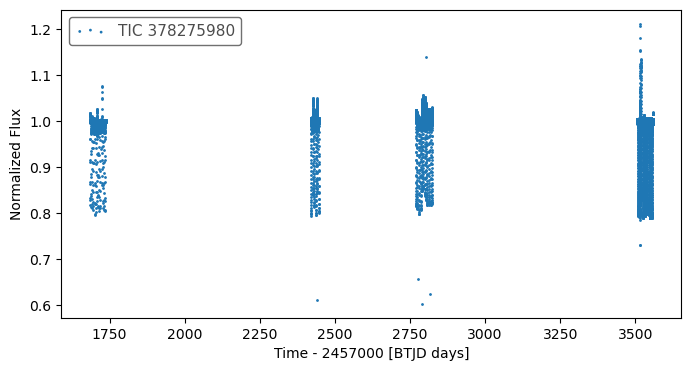

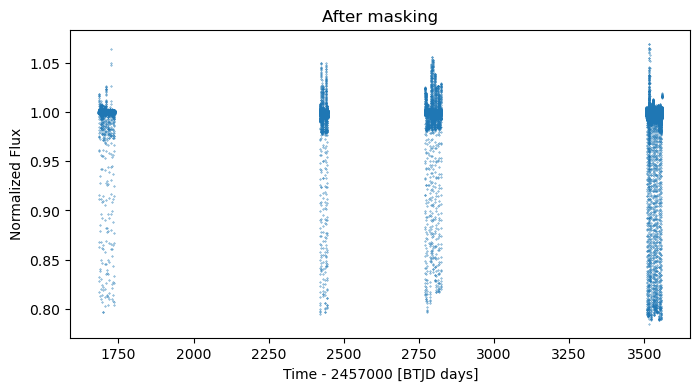

In [5]:
%matplotlib inline
# %matplotlib widget

time = search_result.time.value
flux = search_result.flux.value
fluxerr = search_result.flux_err.value
len(search_result)

# mask out data you don't like...

fig, ax = plt.subplots(figsize=figsize)
search_result.scatter(ax = ax)

mask = time < 0  #( time > 54950) & (time < 54963)  #  truncate weird spikes at the beginning of Kepler data
# mask = flux < 0.85    # remove occasional outliers
mask = (
    ( flux < 0.75 ) | # remove  outliers
    ( flux > 1.07 )  # remove  outliers
)

time = time[~mask]
flux = flux[~mask]
fluxerr = fluxerr[~mask]

# make sure that therte are no nans!

finite_mask = np.isfinite(time) * np.isfinite(flux) * np.isfinite(fluxerr)

# make a dictionary of the data

data = pd.DataFrame({'time': time[finite_mask], 'flux': flux[finite_mask], 'err': fluxerr[finite_mask]})

ax2 = plt.figure(figsize=figsize).gca()
ax2.scatter(data.time, data.flux, s=0.1);
ax2.set_ylabel(ax.get_ylabel())
ax2.set_xlabel(ax.get_xlabel())
ax2.set_title("After masking");

In [ ]:
do_bls = False

if do_bls:
    if not "../.." in sys.path:
        sys.path.append("../..")
    import lightkurve_ext_pg_runner as lke_pg_runner  # at ../../

    bls_result = lke_pg_runner.run_bls(
        search_result.remove_nans(),
        pg_kwargs=dict(
            minimum_period=1, maximum_period=20,
            frequency_factor=1,
            duration=[3.4957 / 24 * f for f in [0.975, 1, 1.025, 1.05, 1.1, 1.15,]],  # based on observed primary eclipse duration for better fit
        ),
    )
    !$NOTIFY_CMD  "BLS Done"

In [ ]:
do_ls = False

if do_ls:
    if not "../.." in sys.path:
        sys.path.append("../..")
    import lightkurve_ext_pg as lke_pg  # at ../../

    lc = lk.LightCurve(time=Time(time, format="btjd"), flux=flux, flux_err=fluxerr)
    lc.meta["LABEL"] = f"TIC {ticid}"
    pg = lc.to_periodogram(method="lombscargle",
                           # maximum_period=10,
                           # minimum_period=0.4,
                           # ls_method="fastchi2", nterms=2,
                           # oversample_factor=50,  # default: 5
                          )

    pg.show_properties();
    print(pg.period_at_max_power);

    ax = lke_pg.plot_pg_n_mark_max(pg, max_period_factor=10);

    ax = pg.plot(view="frequency");  # frequency view
    ax.set_xlim(pg.frequency_at_max_power.value / 100 , pg.frequency_at_max_power.value * 10);

    ax = pg.plot(view="frequency", unit=u.microhertz, scale="log");

    axs, lcs = lke_pg.plot_lc_with_model(
        lc,
        pg,
        plot_lc=False, plot_model=False, plot_folded_model=True,
        also_return_lcs=True);


In [ ]:
# Visaully compare different candidate period

# ax = search_result.normalize().fold(epoch_time=1471.4196, period=8.418132651611877).truncate(-0.1, 0.1).scatter(label="BLS period, frequency_factor=10");  # HWHM 0.001571020094789155
# ax = search_result.normalize().fold(epoch_time=1471.4196, period=8.418147).truncate(-0.1, 0.1).scatter(label="s0001-s0009:TCE1");

### Define epoch, period, duration

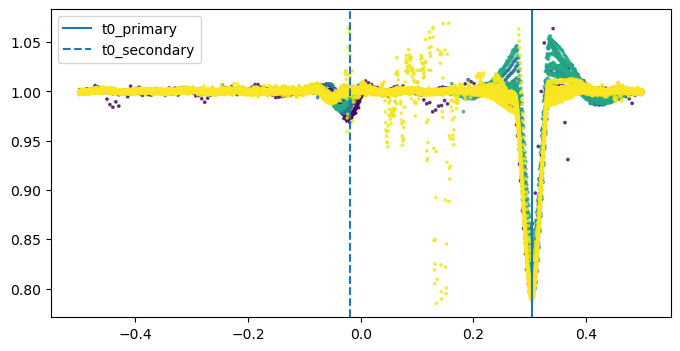

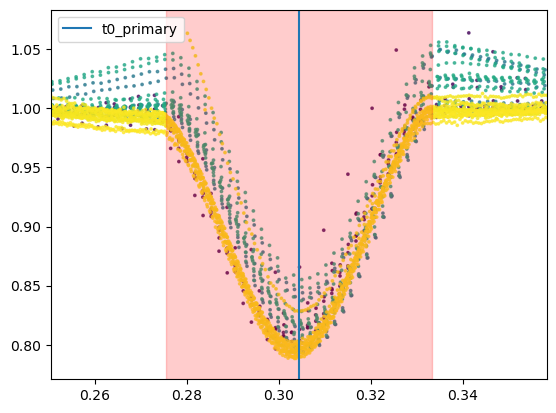

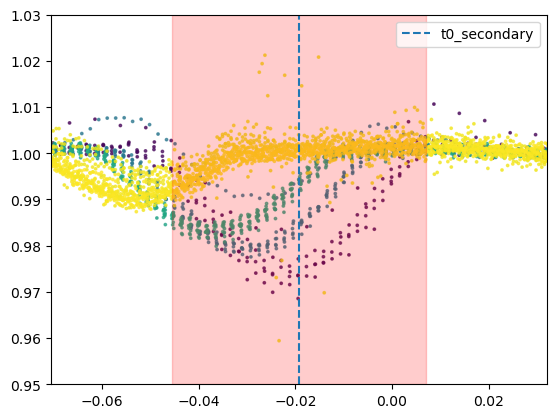

In [6]:
%matplotlib inline
# %matplotlib widget

# define the orbital period and the t0

# epoch=1683.93, duration_hr=5.5, period=3.96545, label="EB-deep",  # from visual
# epoch=1686.61, duration_hr=5.0, period=3.96518, label="EB-shallow",  # from visual, the period is noticably different from EB-deep
# MCMC on df_primary: p: 3.965437501849231, std_p: 1.2249174252168394e-07 ; t0: 1683.9382009592841, std_t0: 4.6764637991925974e-05
# MCMC on df_secondary: p: 3.965167408587452,  std_p_s: 1.416815738100968e-06 ; t0: 1686.6227910981534, std_t0_s: 0.0004692332238928859


# FILL-IN THE eclipse epoch / period,
# period = 3.96545  # visual
period = 3.96544  # MCMC 

# period_s = 3.96518  # viusal, the best fit period is noticably different from visual
period_s = 3.96517  # MCMC

# t0_primary = 1683.93  # visual
t0_primary = 1683.938  # MCMC

# t0_secondary = 1686.61  # visual
t0_secondary = 1686.62 # MCMC

duration_hr_primary = 5.5
duration_hr_secondary = 5.0

# convert epoch from BTJD to commonly mjd used here
# t0_primary = Time(t0_primary, format="btjd").to_value("mjd")
# t0_secondary = Time(t0_secondary, format="btjd").to_value("mjd")

# Move t0 to the first dip in the data (some of the subsequent codes, espically fit_each_eclipse(), assumes that)
t0_primary = t0_primary - int((t0_primary - data['time'][0]) / period) * period
# if t0_secondary is not None:  # the adjustment is counter productivfe due to custom period for secondary
#     t0_secondary = t0_secondary - int((t0_secondary - data['time'][0]) / period) * period

t0_for_plotting = 0  # keep 0 for plotting purposes
if t0_secondary is not None:
    t0_for_plotting = t0_primary - np.abs(t0_primary - t0_secondary) * 0.45  # use a custom one so that the eclipses are not near the edge (-0.5 or +0.5)

phase = etv_functions.phase_data(data['time'], t0_for_plotting, period)

fig, ax = plt.subplots(figsize = (8,4))

plt.scatter(phase,data['flux'], s = 3, alpha = 0.7, c = data['time'])

# add the phase to the dataframe
data['phase'] = phase

plt.axvline(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0], label="t0_primary")
if t0_secondary is not None:
    plt.axvline(etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0], linestyle="--", label="t0_secondary")
plt.legend()
# plt.ylim(0.9, 1.04);
# plt.xlim(-0.5, 0.1)
plt.show();

plt.scatter(phase,data['flux'], s = 3, alpha = 0.7, c = data['time'])
plt.axvline(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0], label="t0_primary")
t1_p, t4_p = etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0] - 0.5 * duration_hr_primary / 24/ period, etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0] + 0.5 * duration_hr_primary / 24/ period
plt.xlim(t1_p - 0.025, t4_p + 0.025);
plt.axvspan(t1_p, t4_p, color="red", alpha=0.2);plt.legend();
# plt.ylim(0.9, 1.04);
plt.show()

# seconary plot not helpful as the period is different
if t0_secondary is not None:
    plt.scatter(phase,data['flux'], s = 3, alpha = 0.7, c = data['time'])
    plt.axvline(etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0], linestyle="--", label="t0_secondary")
    t1_s, t4_s = etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0] - 0.5 * duration_hr_secondary / 24/ period, etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0] + 0.5 * duration_hr_secondary / 24/ period
    plt.xlim(t1_s - 0.025, t4_s + 0.025);
    plt.axvspan(t1_s, t4_s, color="red", alpha=0.2);plt.legend();
    plt.legend();
    plt.ylim(0.95, 1.03);
    plt.show()

### Difference in the best fit period of primary and the secondary eclipses

Primary:  3.96544
Secondary: 3.96517


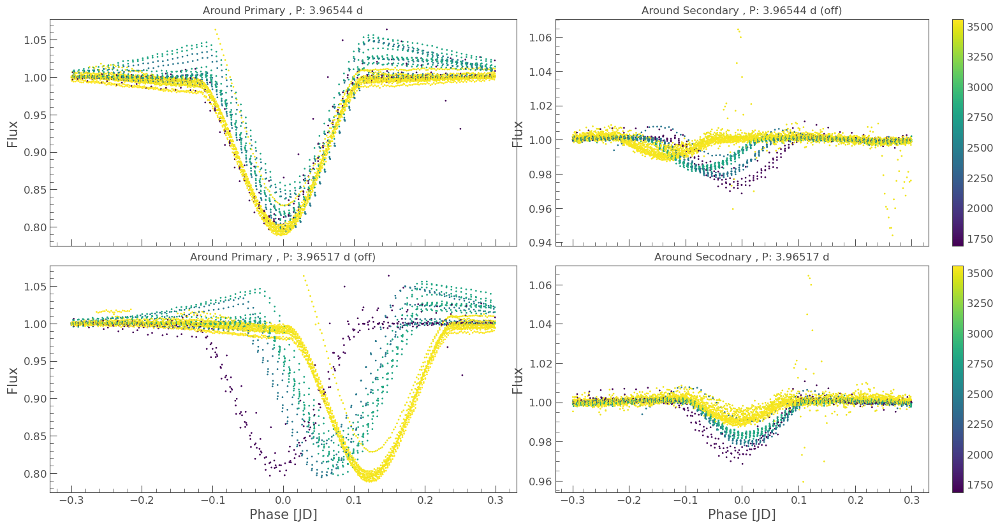

In [53]:
lc_data = lk.LightCurve(time=Time(data.time, format="btjd"), flux=data.flux, flux_err=data.err)

with plt.style.context(lk.MPLSTYLE):
    fig, axs = plt.subplots(2, 2, figsize=(16, 8), sharey=False, sharex=True);
    plt.tight_layout();

ax = axs[0][0]
lc_f = lc_data.fold(period=period, epoch_time=t0_primary).truncate(-0.3, 0.3);
lc_f.scatter(ax=ax, c=lc_f.time_original.value, show_colorbar=False)
ax.set_title(f"Around Primary , P: {lc_f.period}");
ax.set_xlabel(None)

ax = axs[1][0]
lc_f = lc_data.fold(period=period_s, epoch_time=t0_primary).truncate(-0.3, 0.3);
lc_f.scatter(ax=ax, c=lc_f.time_original.value, show_colorbar=False)
ax.set_title(f"Around Primary , P: {lc_f.period} (off)");

ax = axs[0][1]
lc_f = lc_data.fold(period=period, epoch_time=t0_secondary).truncate(-0.3, 0.3);
lc_f.scatter(ax=ax, c=lc_f.time_original.value, show_colorbar=True)
ax.set_title(f"Around Secondary , P: {lc_f.period} (off)");
ax.set_xlabel(None)

ax = axs[1][1]
lc_f = lc_data.fold(period=period_s, epoch_time=t0_secondary).truncate(-0.3, 0.3);
lc_f.scatter(ax=ax, c=lc_f.time_original.value, show_colorbar=True)
ax.set_title(f"Around Secodnary , P: {lc_f.period}");

print("Primary: ", period)
print("Secondary:", period_s)

### Compare folded plots across sectors

In [ ]:
with plt.style.context(lk.MPLSTYLE):
    fig, axs = plt.subplots(1, len(lcc_tess), figsize=(4 * len(lcc_tess), 3), sharey=True);
    if isinstance(axs, plt.Axes):
        axs = [axs]
    for i, lc in enumerate(lcc_tess):
        lc_f = lc.select_flux("flux").normalize(unit="percent").fold(period=period, epoch_time=t0_primary)
        lc_f = lc_f.truncate(-duration_hr_primary * 2 / 24, duration_hr_primary * 2 / 24)
        ax = lc_f.scatter(ax=axs[i], s=1, label=f"S.{lc_f.sector}");
        ax.legend(loc="lower right");
        if i > 0:
            ax.set_ylabel(None)
            ax.set_xlabel(None)
    fig.suptitle(f"{lc.label}, folded around primary eclipses");
plt.tight_layout();

# ---
with plt.style.context(lk.MPLSTYLE):
    fig, axs = plt.subplots(1, len(lcc_tess), figsize=(4 * len(lcc_tess), 3), sharey=True);
    if isinstance(axs, plt.Axes):
        axs = [axs]
    for i, lc in enumerate(lcc_tess):
        lc_f = lc.select_flux("flux").normalize(unit="percent").fold(period=period, epoch_time=t0_secondary)
        lc_f = lc_f.truncate(-duration_hr_secondary * 2 / 24, duration_hr_secondary * 2 / 24)
        ax = lc_f.scatter(ax=axs[i], s=1, label=f"S.{lc_f.sector}");
        ax.legend(loc="lower right");
        if i > 0:
            ax.set_ylabel(None)
            ax.set_xlabel(None)
    fig.suptitle(f"{lc.label}, folded around secondary eclipses");
plt.tight_layout();

### Detrend (optional)

- detrended flux is in `flux_detrended`, and won't be used in subsequent work by default

In [ ]:
data["flux_original"] = data.flux  # save the original flux 

In [ ]:
# show data to visualize what's changed in each step below
data

In [ ]:
# phase fold the data and create an appoximate binary model (top) and subtract it from the data (bottom)
#_, _ , flux_sub_binary, model, _, _ = etv_functions.trend_removal_interact(period, 0, data['time'], data['flux'], data['time'], data['flux'])

data = etv_functions.trend_removal_interact(period, t0_for_plotting, data)
data

In [ ]:
# if you want to detrend the data run this line!

data = etv_functions.detrend_suz(data, T_dur = 10, plot = True)
data

In [ ]:
# plot the phase folded data here so that you know at what phase you want to cut the data to model 
plt.scatter(phase,data['flux_detrended'], s = 3, alpha = 0.7, c = data['time'])

plt.axvline(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0], label="t0_primary")
if t0_secondary is not None:
    plt.axvline(etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0], linestyle="--", label="t0_secondary")
plt.legend()
# plt.ylim(0.535, 0.55)
# plt.xlim(-0.5, 0.1)
plt.show();

plt.scatter(phase,data['flux_detrended'], s = 3, alpha = 0.7, c = data['time'])
plt.axvline(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0], label="t0_primary")
t1_p, t4_p = etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0] - 0.5 * duration_hr_primary / 24/ period, etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0] + 0.5 * duration_hr_primary / 24/ period 
plt.xlim(t1_p - 0.025, t4_p + 0.025);
plt.axvspan(t1_p, t4_p, color="red", alpha=0.2);plt.legend();
# plt.ylim(0.75, 0.85);
plt.show()

if t0_secondary is not None:
    plt.scatter(phase,data['flux_detrended'], s = 3, alpha = 0.7, c = data['time'])
    plt.axvline(etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0], linestyle="--", label="t0_secondary")
    t1_s, t4_s = etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0] - 0.5 * duration_hr_secondary / 24/ period, etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0] + 0.5 * duration_hr_secondary / 24/ period 
    plt.xlim(t1_s - 0.025, t4_s + 0.025);
    plt.axvspan(t1_s, t4_s, color="red", alpha=0.2);plt.legend();
    plt.legend();
    # plt.ylim(0.975, 1.005);
    plt.show()

In [ ]:
# # Uncomment to use the detrended flux
# #
# print("Use deterended flux")
# data.flux = data.flux_detrended

### Now that the data is ready we can start 

- generally the clipped LC window is ***smaller*** than the eclipse duration, to avoid the complication of fitting ingress/egress.

In [10]:
# define the midpoints of the primary and secondary eclipses and the window width

# if these don't look central - change them!! the eclipses should be central
midpoint_p =  etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0]  # convet to time in phase
# midpoint_p -= 0.004  # the offset is added back to t0_primary (& secondary above
print('Primary:  ', t0_primary, midpoint_p)

# change depending on the width of the eclipses, default to be slightly larger than the primary eclipse
window_width_p = 0.8 * duration_hr_primary / 24 / period   # avoid ingress/egress, especially as the OOT data shows clear rise (probably tidal related)
# use a shoter duration to avoid fitting the out-of-eclipse LC, which has its own variability that the model is not equipped to hanlde
# window_width_p = 0.095
print("window_width_p (phase):", window_width_p)

data_primary = data[(data['phase'] > midpoint_p - window_width_p / 2) & (data['phase'] < midpoint_p + window_width_p / 2) ]
ph_binned,flux_binned,err_binned = etv_functions.run_binning_phased(data_primary.phase, data_primary.flux, yerr=data_primary.err,nbins=1000)


# if t0_secondary is not None:
#     midpoint_s =  etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0]
#     print('Secondary:', t0_secondary, midpoint_s)

#     # the coshgauss model seems problematic, try to use a larger width to give it more shape to fit
#     window_width_s = 0.8 * duration_hr_secondary / 24 / period
#     # window_width_s = 0.22
#     print("window_width_s (phase):", window_width_s)

#     data_secondary = data[(data['phase'] > midpoint_s - window_width_s / 2) & (data['phase'] < midpoint_s + window_width_s / 2) ]
#     ph_binned_s,flux_binned_s,err_binned_s = etv_functions.run_binning_phased(data_secondary.phase, data_secondary.flux, yerr=data_secondary.err,nbins=1000)


### # you need initial guesses!! The order is :
# alpha0, alpha1, t0, d, Tau - CHANGE THESE TO YOUR OWN INITIAL GUESSES
# median flux, -eclipse depth, t0, related to duration, related to shape (U or V)
# t0 in normalixed phase

start_vals = [1.0256, -0.2178, midpoint_p, 0.0152, 0.951]
# start_vals_s = None

# -- -- -- -- -- -- -- -- --
# etv_functions.plot_initial_guess(data_primary, ph_binned, flux_binned, err_binned, *start_vals)
etv_functions.plot_initial_guess_interactive(data_primary, ph_binned, flux_binned, err_binned, "midpoint_p", *start_vals)
# if t0_secondary is not None:
#     # etv_functions.plot_initial_guess(data_secondary, ph_binned_s, flux_binned_s, err_binned_s, *start_vals_s)
#     etv_functions.plot_initial_guess_interactive(data_secondary, ph_binned_s, flux_binned_s, err_binned_s, "midpoint_s", *start_vals_s)

print("Start params for  fitting period with MCMC on df_primary:")
print(f"[{start_vals[0]}, {start_vals[1]}, {t0_primary}, {start_vals[3]}, {start_vals[4]}, {period}],");

Primary:   1683.938 0.3043546239509122
window_width_p (phase): 0.04623278459221003


Output(layout=Layout(padding='1em 0px'))

Output(layout=Layout(padding='1em'))

Start params for  fitting period with MCMC on df_primary:
[1.0256, -0.2178, 1683.938, 0.0152, 0.951, 3.96544],


In [9]:
midpoint_s = 0  # fixed at 0
print('Secondary:', t0_secondary, midpoint_s)

# the coshgauss model seems problematic, try to use a larger width to give it more shape to fit
window_width_s = 0.8 * duration_hr_secondary / 24 / period_s  # avoid ingress/egress
# window_width_s = 0.22
print("window_width_s (phase):", window_width_s)


_lc = lk.LightCurve(time=Time(data.time, format="btjd"), flux=data.flux, flux_err=data.err)
_lc_f = _lc.fold(period=period_s, epoch_time=t0_secondary, normalize_phase=True)
_lc_f = _lc_f.truncate(midpoint_s - window_width_s / 2, midpoint_s + window_width_s / 2)
_lc_f = _lc_f.truncate(0.96, 1.015, column="flux")  # custom further truncate outliers

from types import SimpleNamespace
data_secondary = SimpleNamespace(time=_lc_f.time_original.value, phase=_lc_f.time.value, flux=np.array(_lc_f.flux.value), err=np.array(_lc_f.flux_err.value))
ph_binned_s,flux_binned_s,err_binned_s = etv_functions.run_binning_phased(data_secondary.phase, data_secondary.flux, yerr=data_secondary.err,nbins=1000)


start_vals_s = [1.001, -0.0139, midpoint_s, 0.0117, 1.35]

etv_functions.plot_initial_guess_interactive(data_secondary, ph_binned_s, flux_binned_s, err_binned_s, "midpoint_s", *start_vals_s)

print("Start params for  fitting period with MCMC on df_secondary:")
print(f"[{start_vals_s[0]}, {start_vals_s[1]}, {t0_secondary}, {start_vals_s[3]}, {start_vals_s[4]}, {period_s}],");

Secondary: 1686.62 0
window_width_s (phase): 0.04203266610679155


Output(layout=Layout(padding='1em 0px'))

Output(layout=Layout(padding='1em'))

Start params for  fitting period with MCMC on df_secondary:
[1.001, -0.0139, 1686.62, 0.0117, 1.35, 3.96517],


In [ ]:
if False:
    # Export the data around primary eclipses, for period analysis outside of notebook
    data_primary[["time", "flux", "err"]].to_csv(f"tmp/data_primary_{ticid}.csv", index=False)

emcee parallel enabled, use 4 CPUs.


100%|██████████████████████████████████████████████████████████| 4000/4000 [03:56<00:00, 16.88it/s]
The chain is shorter than 20 times the integrated autocorrelation time for 1 parameter(s). Use this estimate with caution and run a longer chain!
N/20 = 200;
tau: [ 91.93647265  78.92494297  73.3033435   50.78625161 201.36194603
  68.93707626]


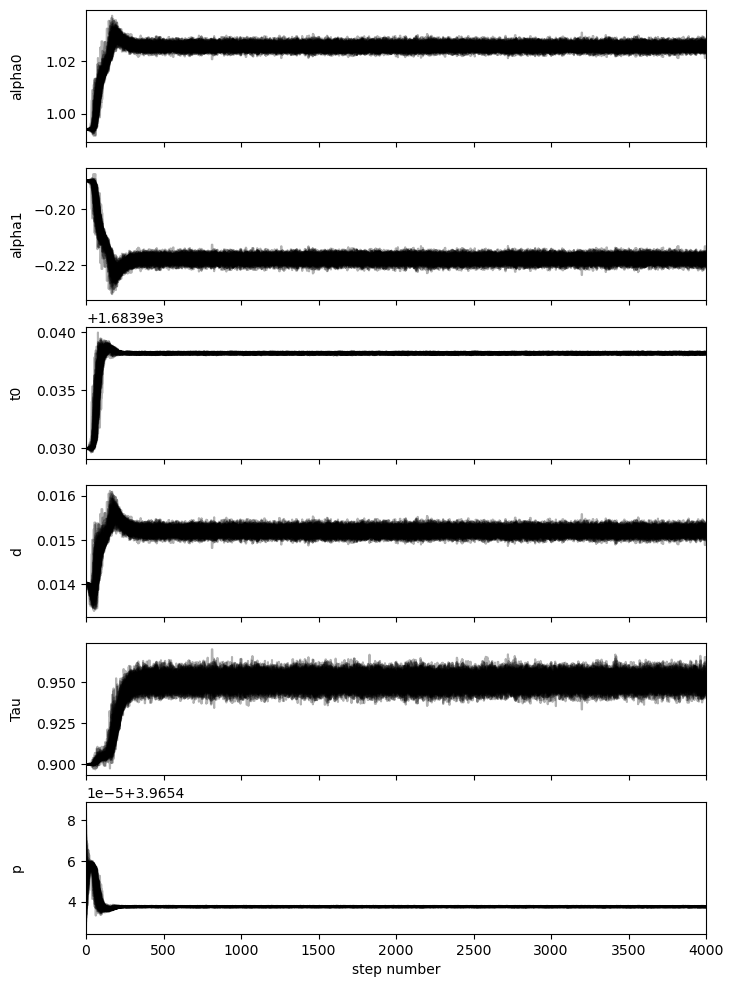

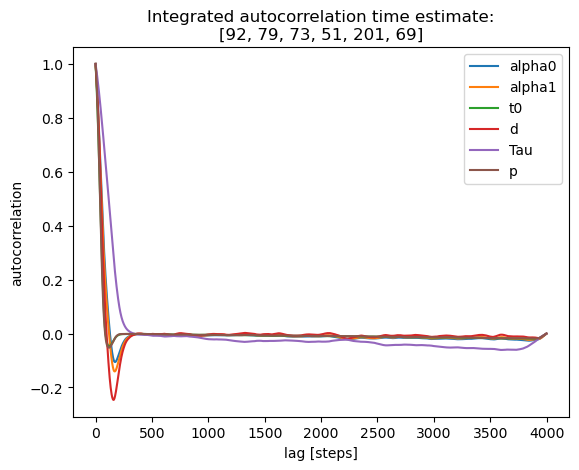

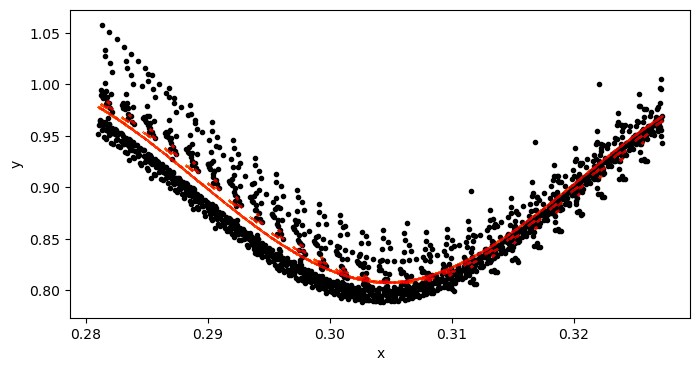

mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p = 1.0255771090688226, -0.21777111146605782, 1683.9382009592841, 0.015190966283136669, 0.9506918645298925, 3.965437501849231
std_p: 1.2249174252168394e-07 ; std_t0: 4.6764637991925974e-05


In [24]:
# use MCMC to refine the period

use_mcmc_to_fit_period = True


if use_mcmc_to_fit_period:
    import etv_functions_with_period as etvp

    etv_functions.enable_info_log_for_jupyter()

    # MCMC result
    mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p, fit_params_p_stats = etvp.run_mcmc_initial_fit_p(
        data_primary[:],
        [0.994, -0.19, 1683.93, 0.014, 0.9, 3.96545],
        # nruns=20, discard=1, # for a sanity test,  to ensure the initial guess is not way off.
        nruns=4000, discard=600,
        autocorr_time_kwargs=dict(tol=20),  # the emcee defaults tol=50 seems to be too strict for our use case, tol of ~10 - 20 seems to be sufficient
        pool=-2,
        plot_chains=True,
        plot_autocorrelation=True,
        plot=True,
        also_return_stats=True,
    )
    print("mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p = " + ", ".join([str(v) for v in [mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p]]))
    print("std_p:", fit_params_p_stats["std_p"], "; std_t0:", fit_params_p_stats['std_t0'])
    !$NOTIFY_CMD "Fitting period done."

emcee parallel enabled, use 4 CPUs.


100%|██████████████████████████████████████████████████████████| 4000/4000 [06:13<00:00, 10.71it/s]


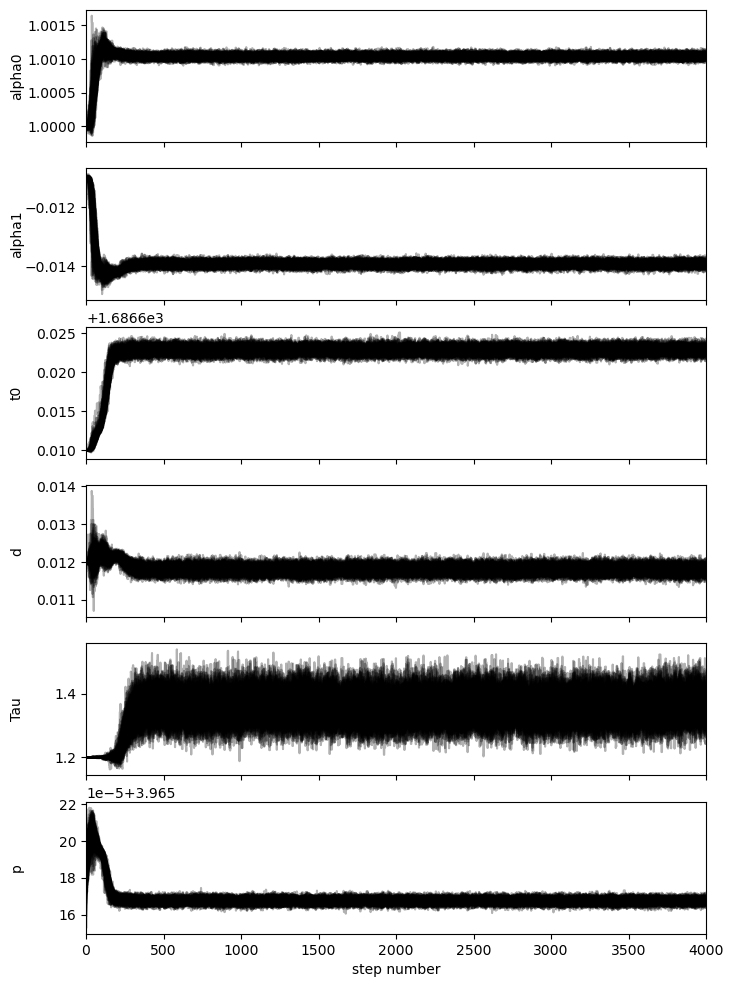

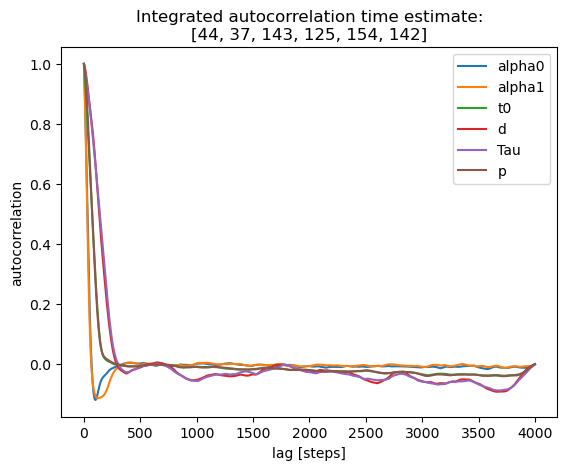

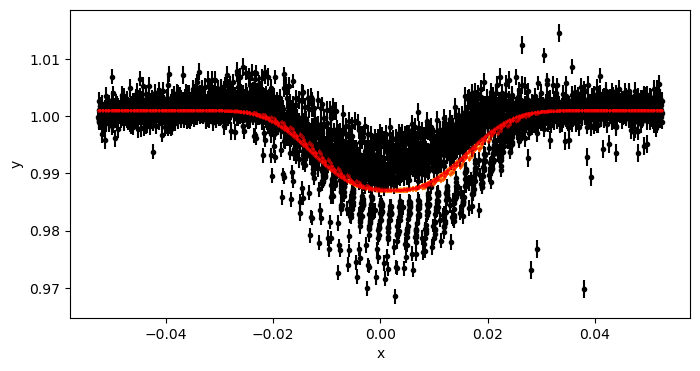

mean_alpha0_s, mean_alpha1_s, mean_t0_time_s, mean_d_s, mean_Tau_s, mean_p = 1.0010372588197582, -0.013931476309081696, 1686.6227910981534, 0.01179241622954123, 1.358517879133771, 3.965167408587452
std_p_s: 1.416815738100968e-06 ; std_t0_s: 0.0004692332238928859


In [43]:
if use_mcmc_to_fit_period:
    import etv_functions_with_period as etvp

    etv_functions.enable_info_log_for_jupyter()

    # MCMC result
    mean_alpha0_s, mean_alpha1_s, mean_t0_time_s, mean_d_s, mean_Tau_s, mean_p, fit_params_s_stats = etvp.run_mcmc_initial_fit_p(
        data_secondary,
        [1.0, -0.011, 1686.61, 0.012, 1.2, 3.96518],
        # nruns=20, discard=1, # for a sanity test,  to ensure the initial guess is not way off.
        nruns=4000, discard=600,
        autocorr_time_kwargs=dict(tol=20),  # the emcee defaults tol=50 seems to be too strict for our use case, tol of ~10 - 20 seems to be sufficient
        pool=-2,
        plot_chains=True,
        plot_autocorrelation=True,
        plot=True,
        also_return_stats=True,
    )
    print("mean_alpha0_s, mean_alpha1_s, mean_t0_time_s, mean_d_s, mean_Tau_s, mean_p = " + ", ".join([str(v) for v in [mean_alpha0_s, mean_alpha1_s, mean_t0_time_s, mean_d_s, mean_Tau_s, mean_p]]))
    print("std_p_s:", fit_params_s_stats["std_p"], "; std_t0_s:", fit_params_s_stats['std_t0'])
    !$NOTIFY_CMD "Fitting period (secondary) done."

emcee parallel enabled, use 4 CPUs.


100%|██████████████████████████████████████████████████████████| 4000/4000 [04:19<00:00, 15.41it/s]


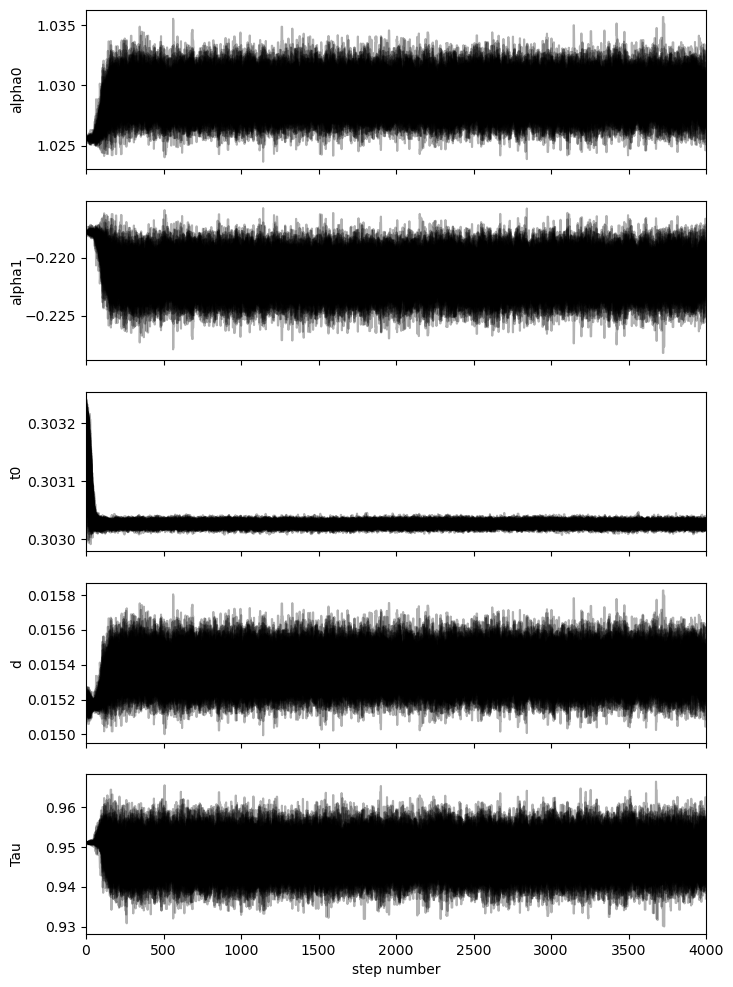

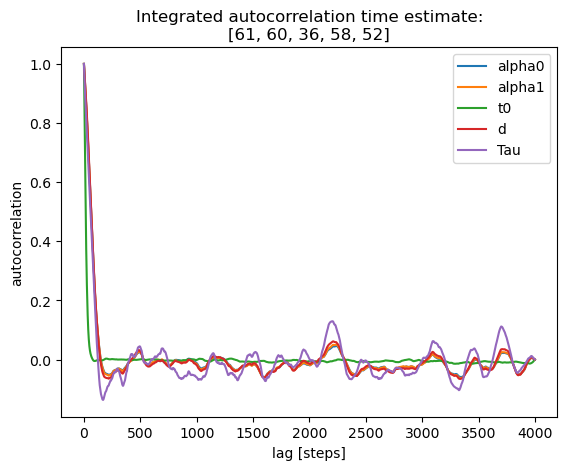

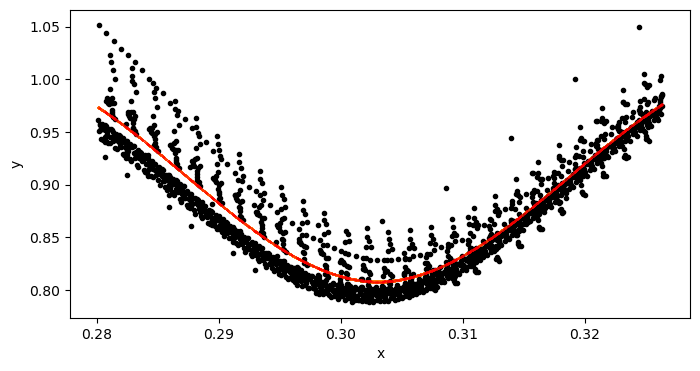

In [28]:
# run the initial model fit using MCMC for the primary and secondary eclipses
run_init_fit = True

if run_init_fit:
    etv_functions.enable_info_log_for_jupyter()
    
    mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau, fit_params_stats = etv_functions.run_mcmc_initial_fit(data_primary, start_vals, nruns=4000, discard=600, autocorr_time_kwargs=dict(tol=20), pool=-2, plot_chains=True,  plot_autocorrelation=True, plot=True, also_return_stats=True)
    !$NOTIFY_CMD "Initial fit done"

emcee parallel enabled, use 4 CPUs.


100%|██████████████████████████████████████████████████████████| 4000/4000 [00:56<00:00, 71.39it/s]


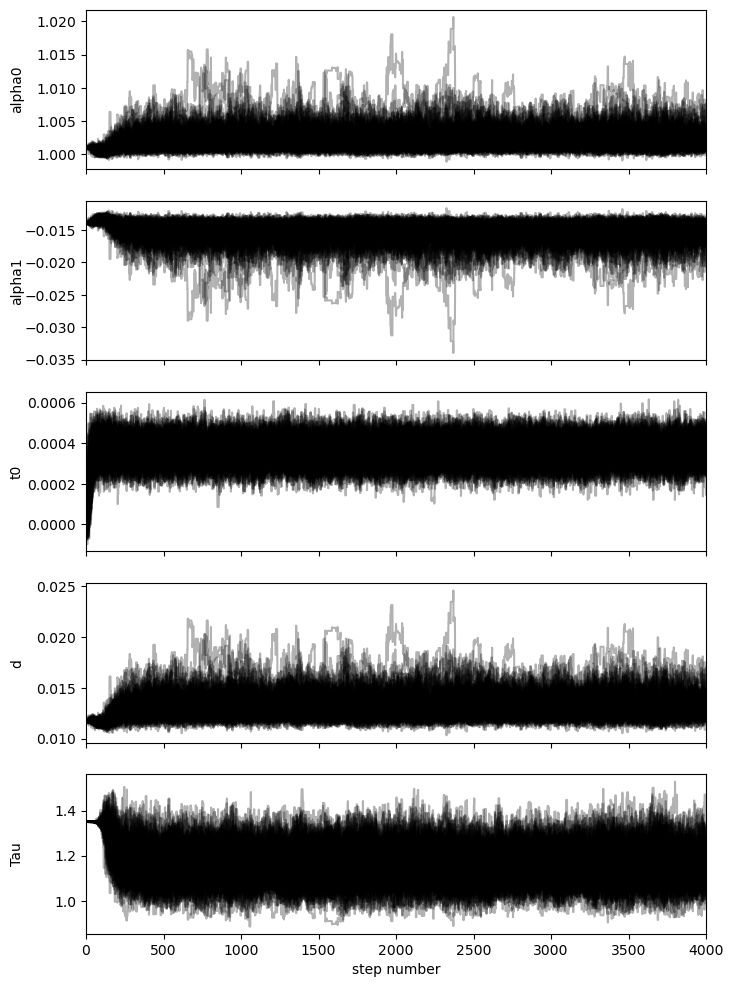

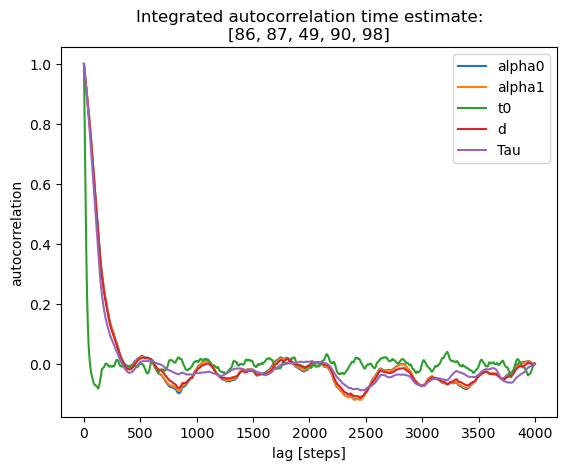

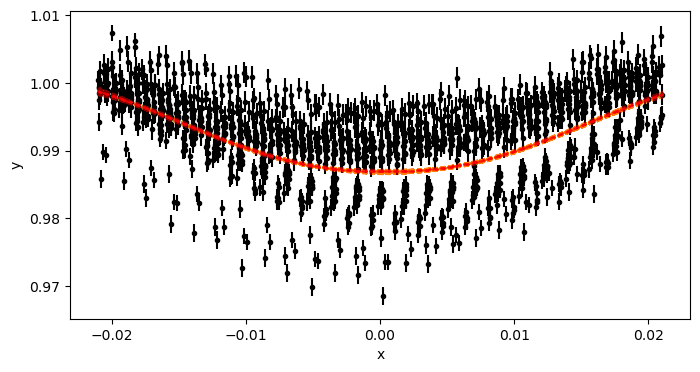

In [50]:
if run_init_fit and t0_secondary is not None:
    mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s, fit_params_s_stats = etv_functions.run_mcmc_initial_fit(data_secondary, start_vals_s, nruns=4000, discard=600, autocorr_time_kwargs=dict(tol=20), pool=-2, plot_chains=True,  plot_autocorrelation=True, plot=True, also_return_stats=True)
    !$NOTIFY_CMD "Initial fit (seconary) done"


Use pre-defined inital model params:


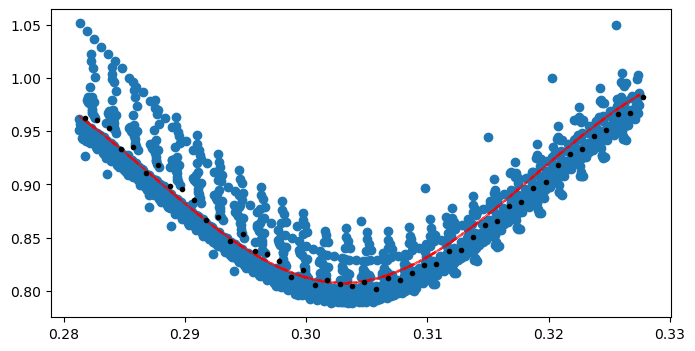

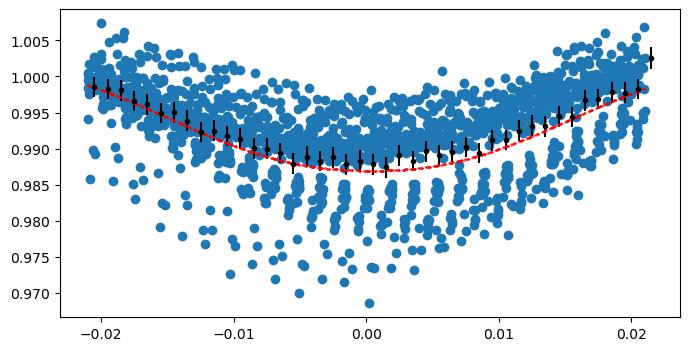

In [11]:
# if not run_init_fit:  # case init fit has been previously saved and to be reussed
if True: 
    print("Use pre-defined inital model params:")
    # initial fit params from TESS data
    mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = 1.0291728375890945, -0.22137396309094426, 0.30302626527394994, 0.015374141992856164, 0.9480693937055169

    # warning: period for secondary is different
    mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = 1.0020821125166746, -0.015132262443550981, 0.0003626774364172433, 0.0130974222512278, 1.1583989095099447


    etv_functions.plot_initial_guess(data_primary, ph_binned, flux_binned, err_binned, *[mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau])
    etv_functions.plot_initial_guess(data_secondary, ph_binned_s, flux_binned_s, err_binned_s, *[mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s])

In [29]:
print("Initial model params:")  # For information, and they can be copied to the cell above for future reuse

print("mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = " + ", ".join([str(v) for v in [mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau]]))

Initial model params:
mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = 1.0291728375890945, -0.22137396309094426, 0.30302626527394994, 0.015374141992856164, 0.9480693937055169


In [51]:
if t0_secondary is not None:
    print("mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = " + ", ".join([str(v) for v in [mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s]]))

mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = 1.0020821125166746, -0.015132262443550981, 0.0003626774364172433, 0.0130974222512278, 1.1583989095099447


### Run custom indiviual fit (per-sector)

- the eclipse depth varies greatly over time. The standard codes `fit_each_eclipse()` would not work well, as they assume consistent eclipse shape (`d` and `Tau`), but the varying depth means the shape varies over time too.

#### per-sector fit for `data_primary`

100%|██████████████████████████████████████████████████████████| 5000/5000 [00:56<00:00, 88.03it/s]


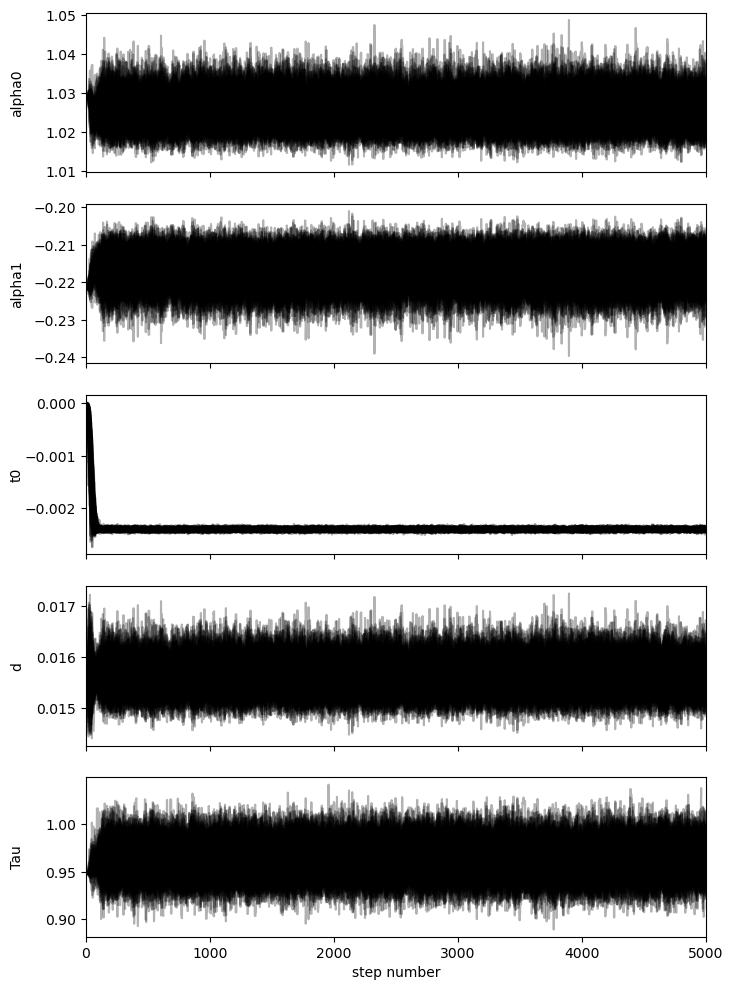

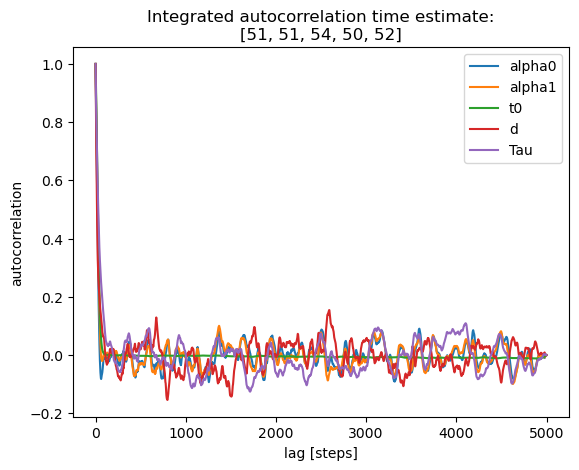

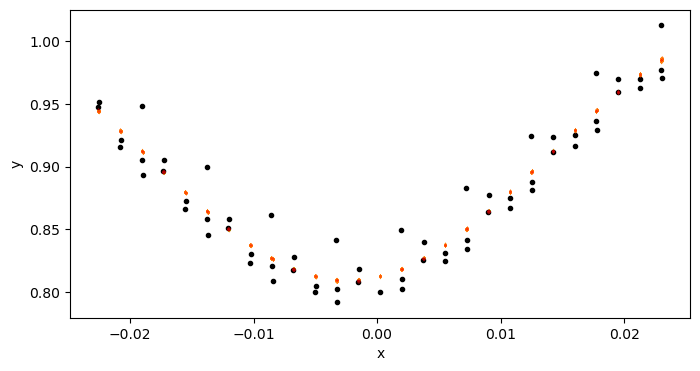

14 1695.9642162858286


100%|██████████████████████████████████████████████████████████| 5000/5000 [00:52<00:00, 95.07it/s]


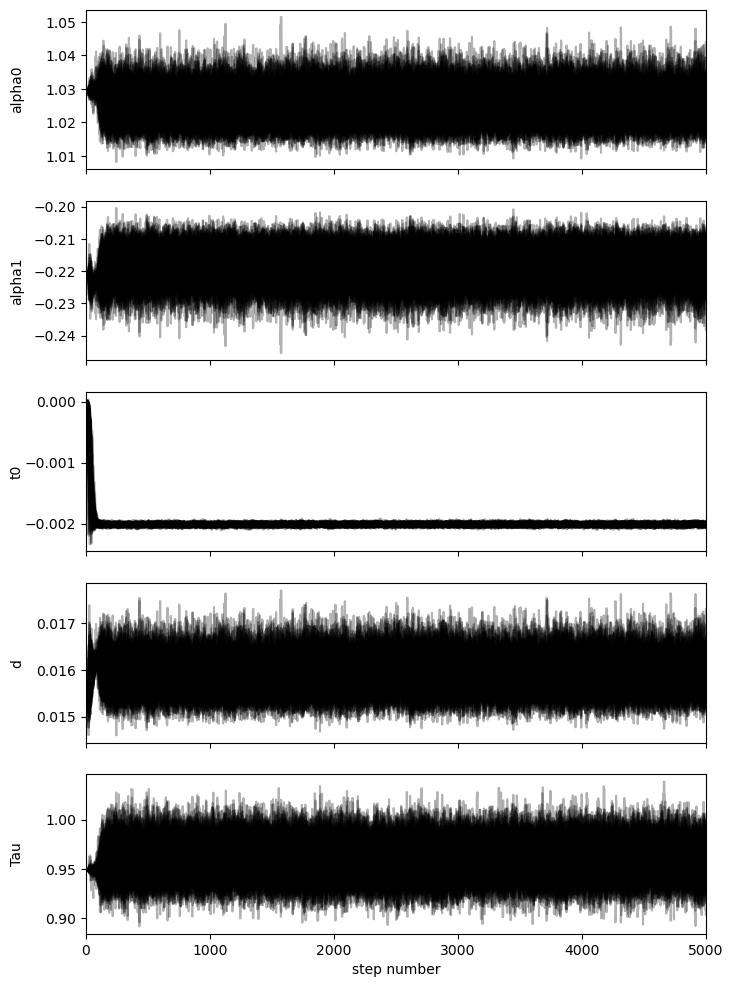

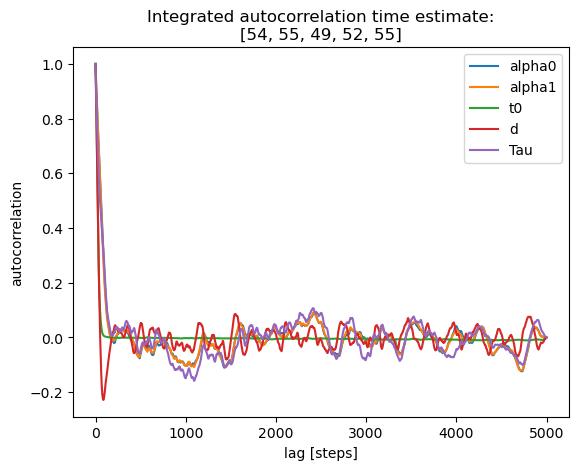

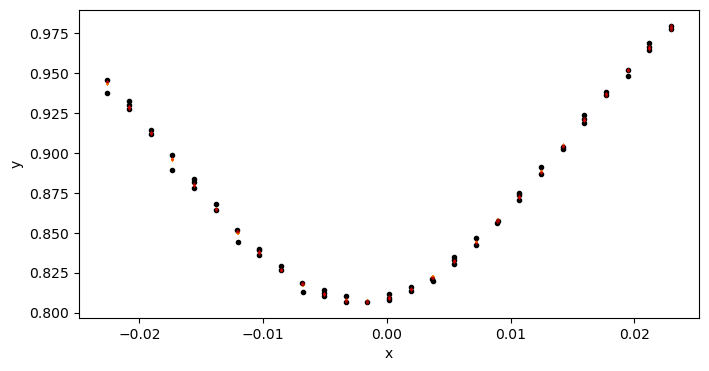

15 1723.7211645866616


100%|██████████████████████████████████████████████████████████| 5000/5000 [00:56<00:00, 88.58it/s]


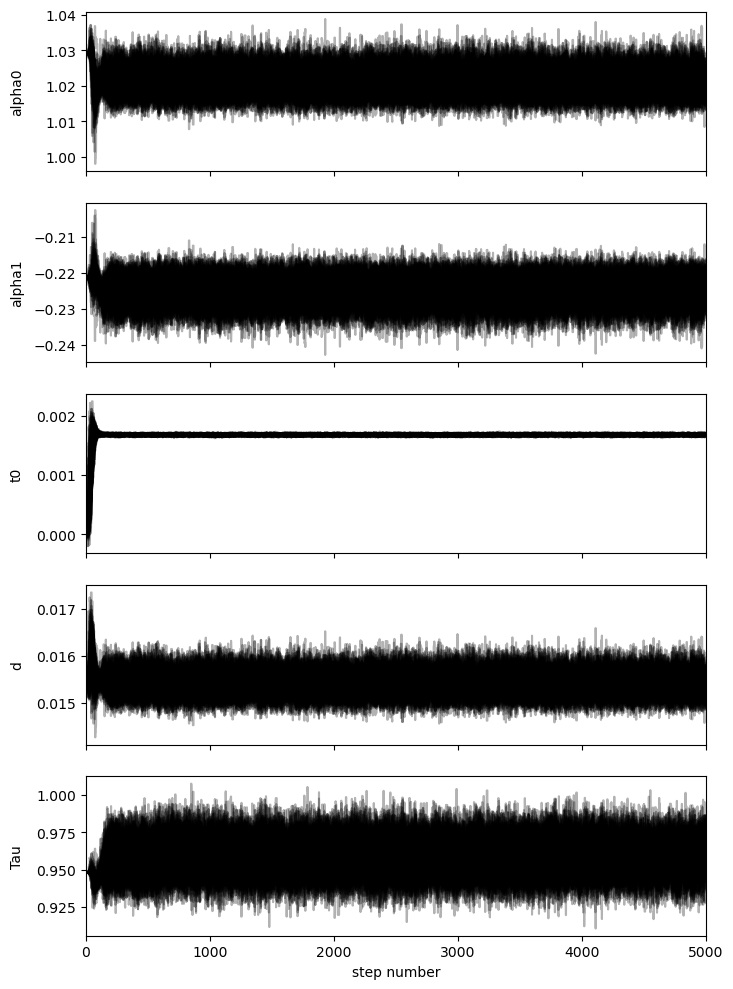

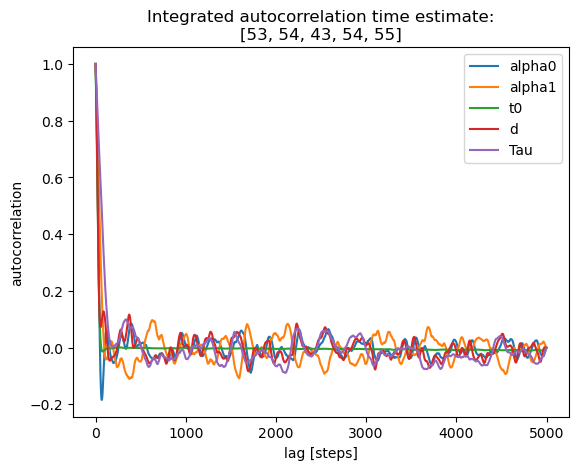

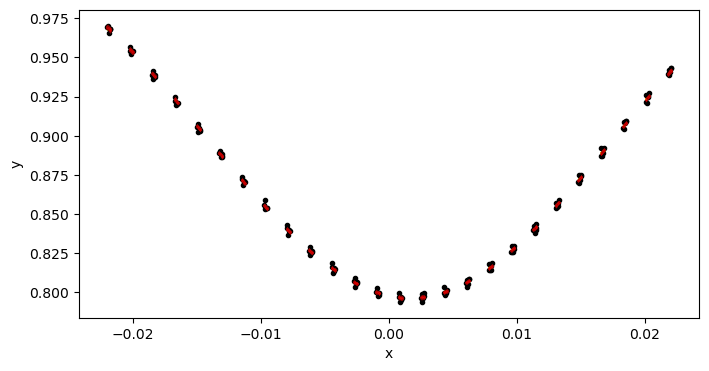

41 2433.4062900690574


100%|██████████████████████████████████████████████████████████| 5000/5000 [00:53<00:00, 93.30it/s]


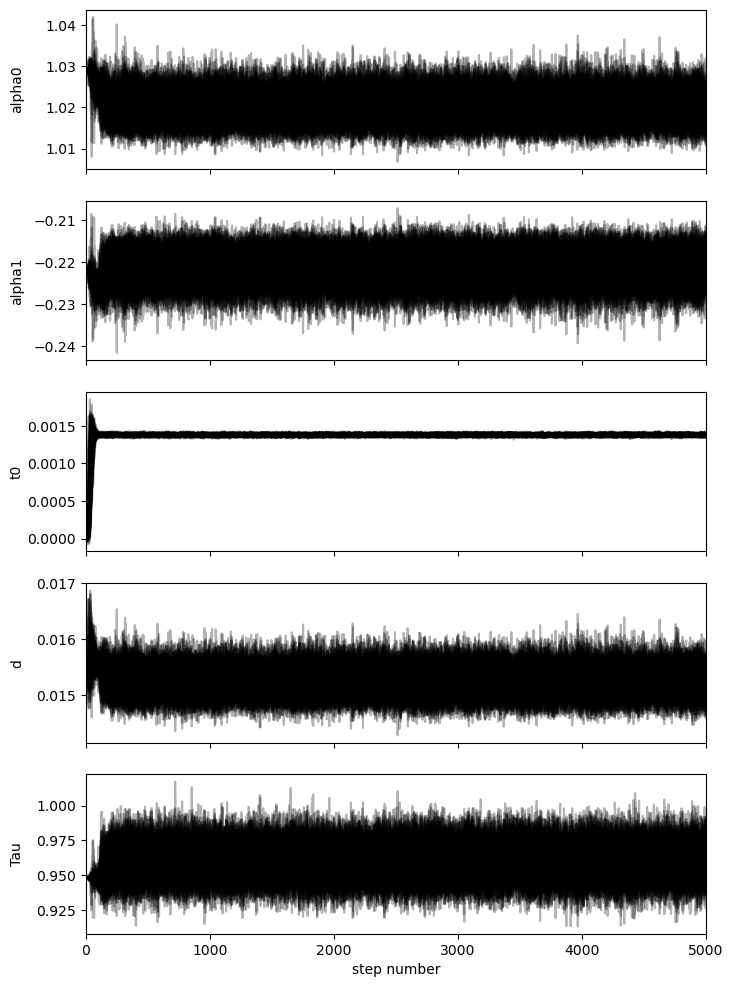

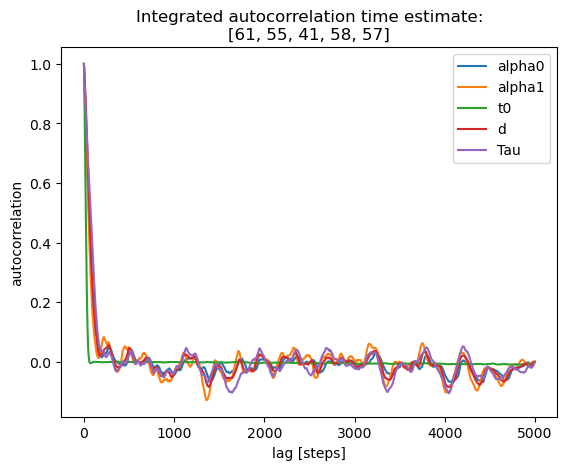

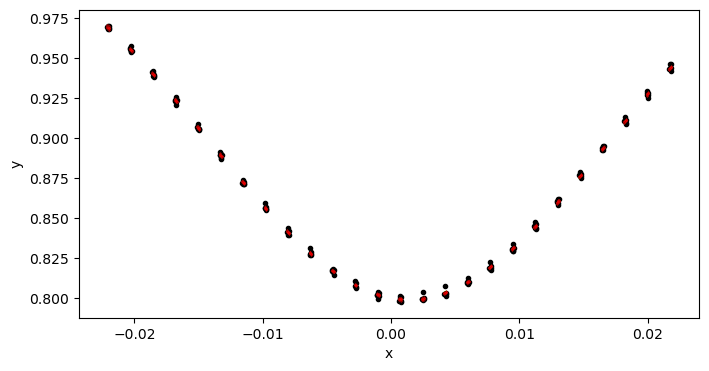

54 2782.2643405178424


100%|██████████████████████████████████████████████████████████| 5000/5000 [00:57<00:00, 87.57it/s]


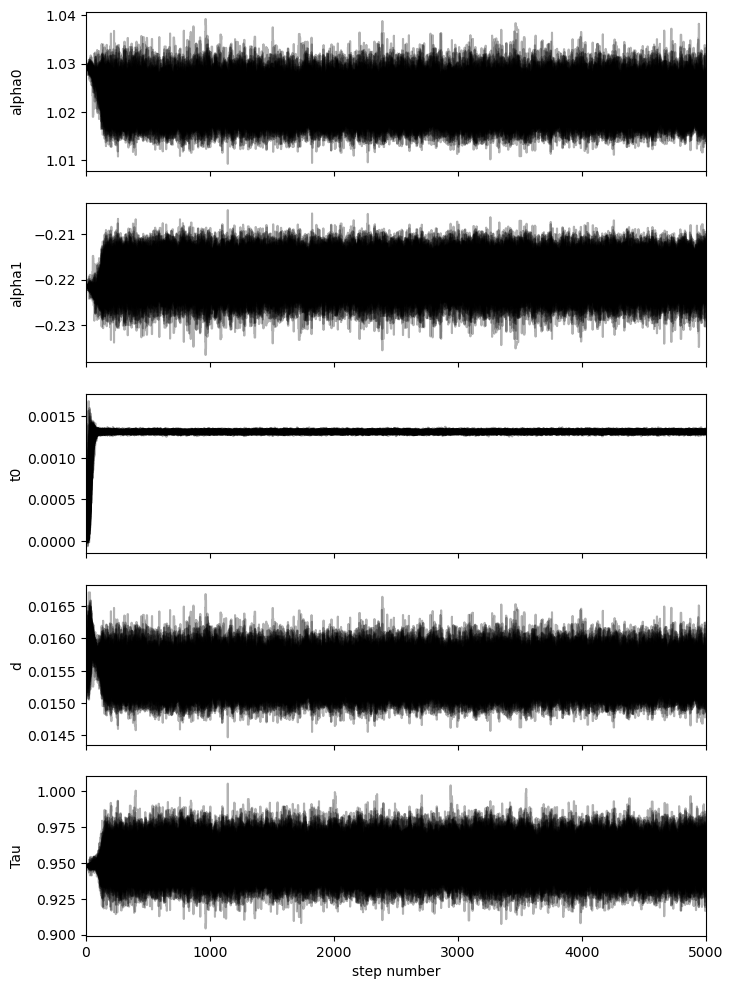

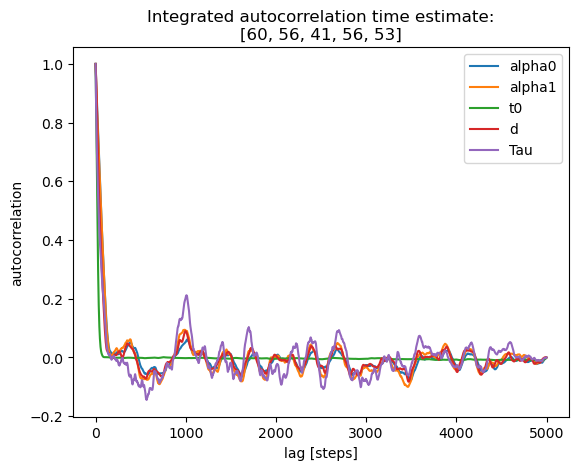

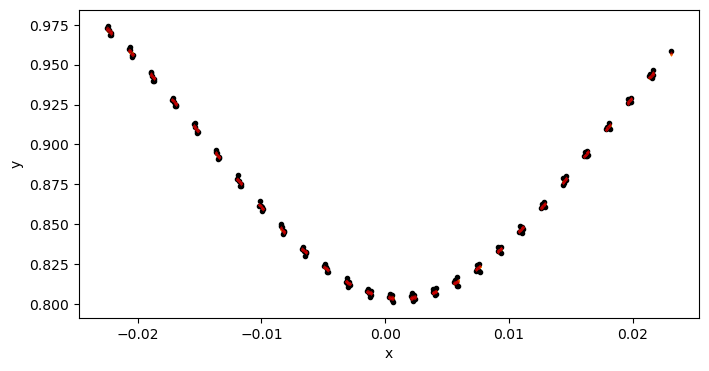

55 2810.197751899215


100%|██████████████████████████████████████████████████████████| 5000/5000 [01:06<00:00, 75.00it/s]


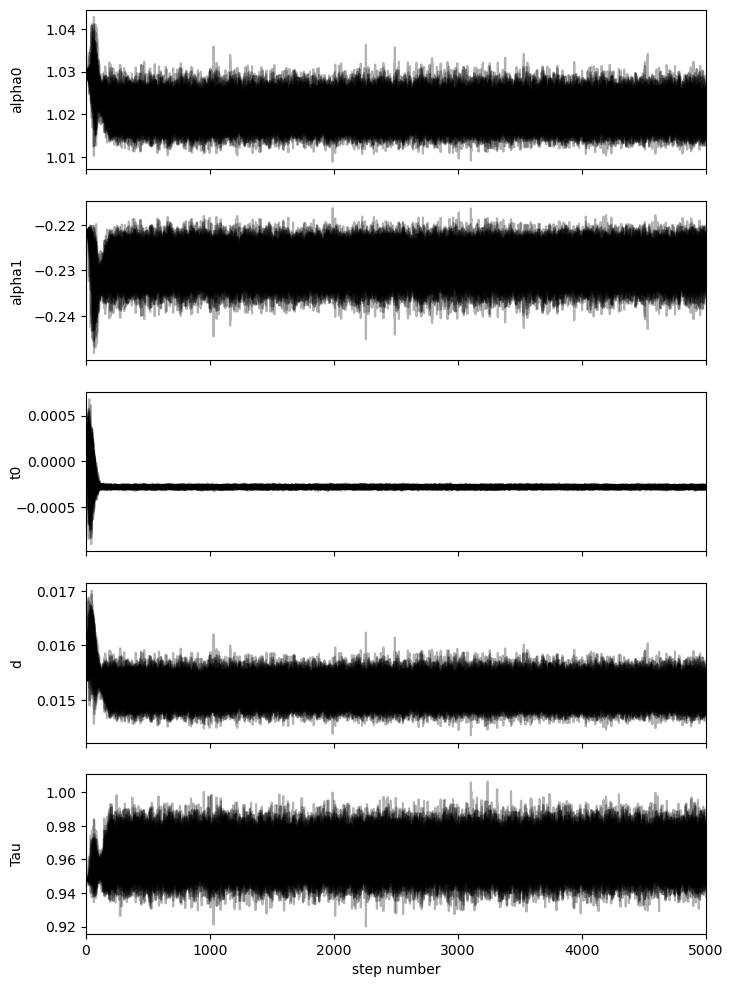

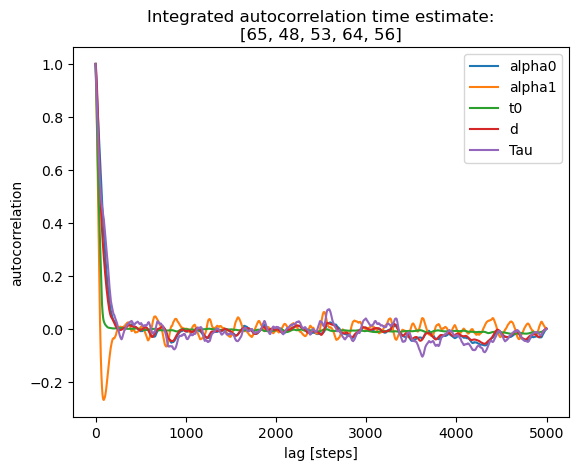

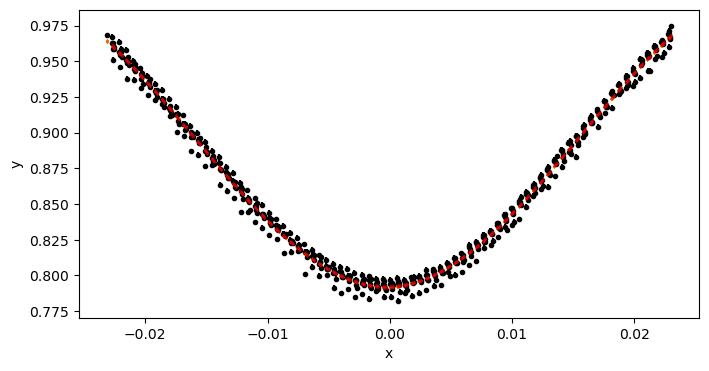

75 3353.367096317601


100%|██████████████████████████████████████████████████████████| 5000/5000 [01:06<00:00, 75.75it/s]


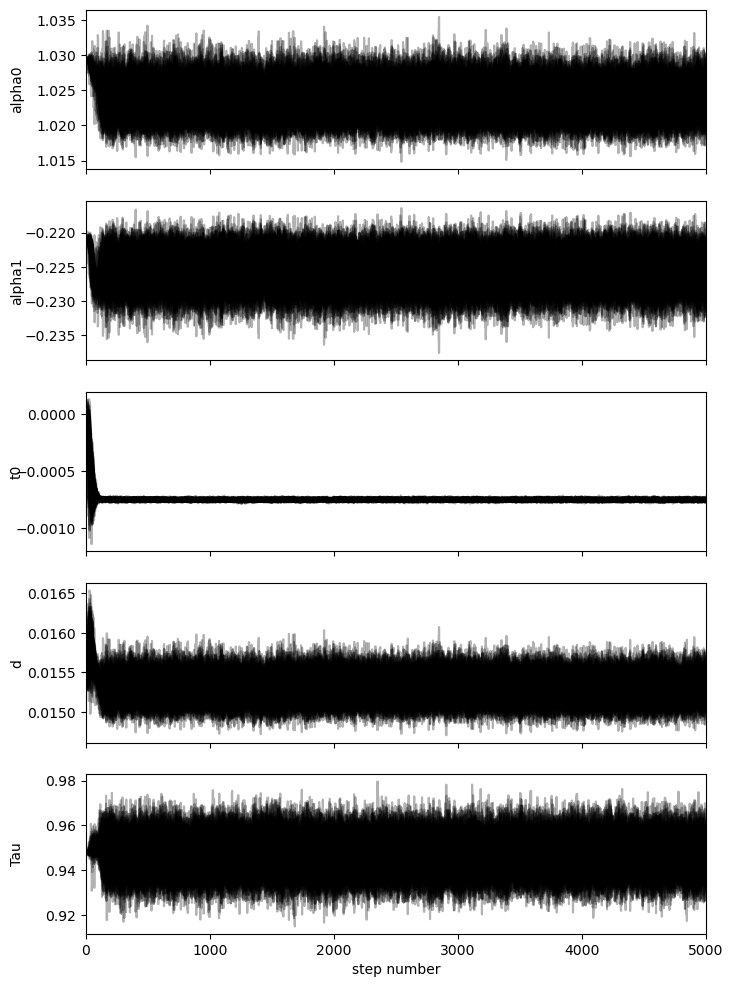

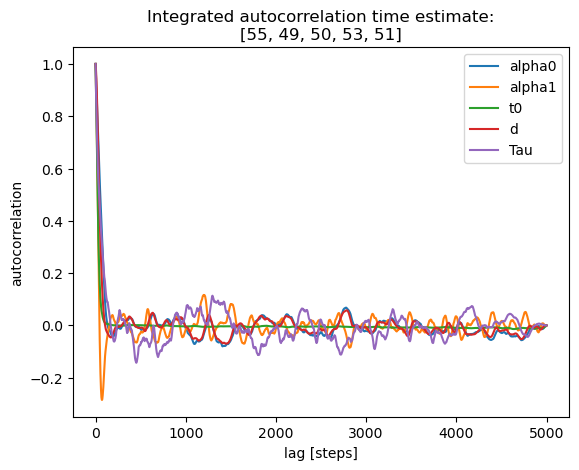

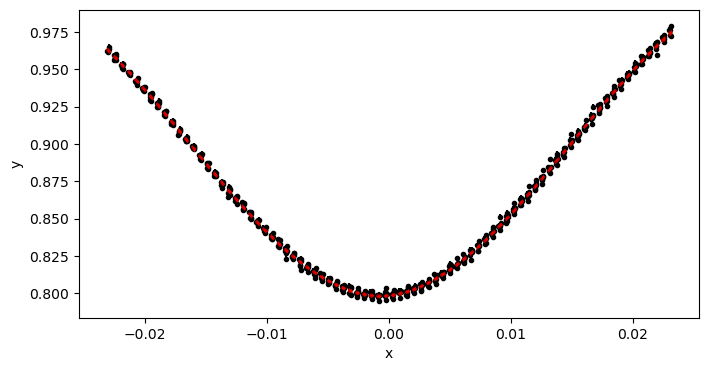

81 3519.950881277999


100%|██████████████████████████████████████████████████████████| 5000/5000 [00:59<00:00, 83.87it/s]


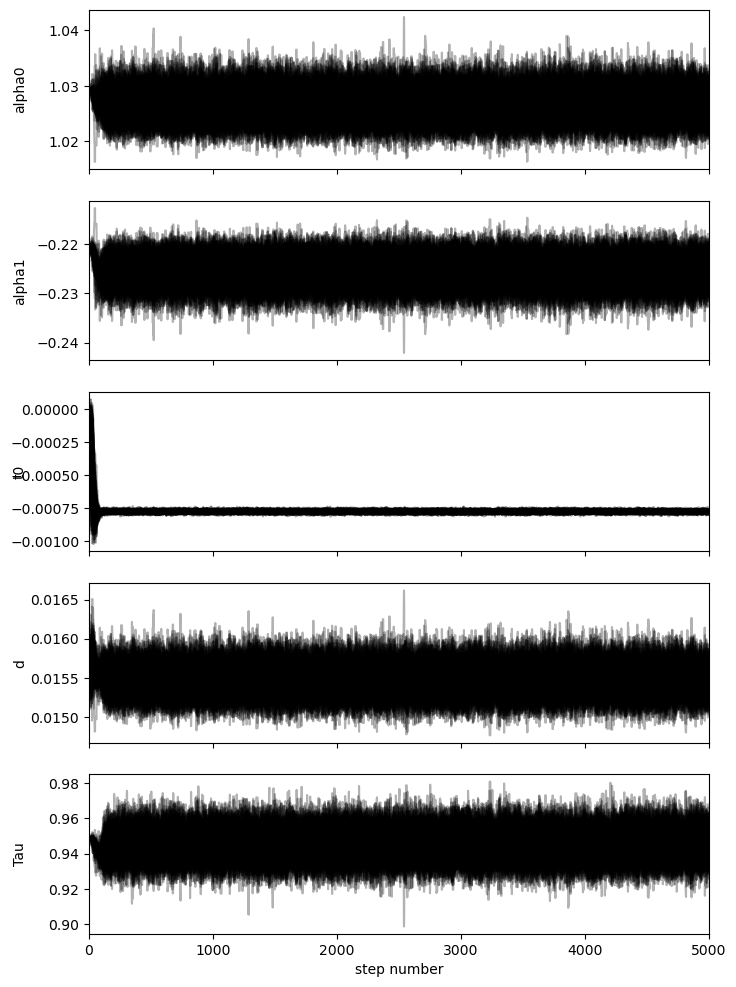

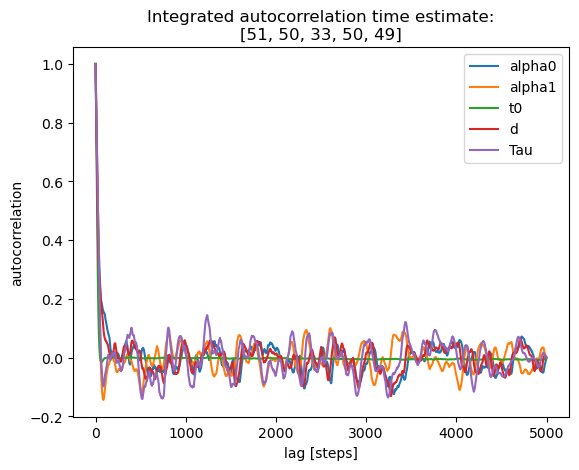

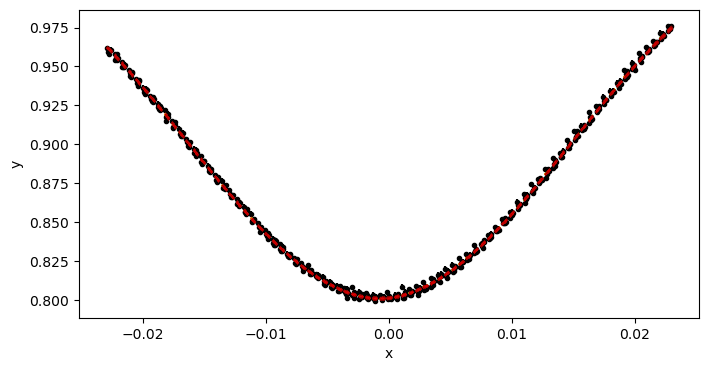

82 3545.7122385259336
number,epoch,mean_alpha0,mean_alpha1,t0,stdv_t0,mean_d,mean_Tau
14,1695.9642162858286,1.0255854636259616,-0.21644426788558072,-0.0024008505740388754,2.4064291975290342e-05,0.01561571586640588,0.9634184345621482
15,1723.7211645866616,1.0249567185600195,-0.21802765716203706,-0.0020156727280138953,2.130923542208041e-05,0.01589617042283358,0.9599721733342846
41,2433.4062900690574,1.0211743119347325,-0.224835585116559,0.001676215822963366,1.3229475302095662e-05,0.015410598571403509,0.9590437428432734
54,2782.2643405178424,1.0200287198328328,-0.22116616768019554,0.0013800566988877718,1.300100983025872e-05,0.015233803006336328,0.9602694392889783
55,2810.197751899215,1.022283187065812,-0.21870193349335765,0.0013120313170804625,1.2997310135495301e-05,0.015451148485645497,0.9526016844760491
75,3353.367096317601,1.0205460738112884,-0.2285169479711899,-0.0002827957736571234,9.939889214197791e-06,0.015161979944050379,0.9627959829679646
81,3519.950881277999,1.0236283626800922,-

In [15]:
from types import SimpleNamespace

etv_out_str = "number,epoch,mean_alpha0,mean_alpha1,t0,stdv_t0,mean_d,mean_Tau\n"

for lc in lcc_tess[:]: 
    lc_f = lc.fold(epoch_time=t0_primary, period=period, normalize_phase=True)
    lc_f = lc_f.truncate(-window_width_p / 2, window_width_p / 2)
    lc_f = lc_f.truncate(0.75, 1.07, column="flux")  # crude remove outliers
    # ax = lc_f.scatter(label=f"S. {lc.sector}");  # for diagnostics
    
    # convert lc to the form needed by fit etv_functions
    lc_f_data = SimpleNamespace(time=lc_f.time_original.value, phase=lc_f.time.value, flux=np.array(lc_f.flux.value), err=np.array(lc_f.flux_err.value))
    
    start_vals = [mean_alpha0, mean_alpha1, 0, mean_d, mean_Tau]  # mean_t0 is not helpful at all
    _alpha0, _alpha1, _t0, _d, _Tau, _fit_params_stats = etv_functions.run_mcmc_initial_fit(
        lc_f_data, start_vals, 
        # nruns=40, discard=6, 
        nruns=5000, discard=1000,  # 3000  is probably sufficient
        autocorr_time_kwargs=dict(tol=20), pool=-2, plot_chains=True,  plot_autocorrelation=True, plot=True, also_return_stats=True)
    
    _stdv_t0 = _fit_params_stats["std_t0"]
    _t = np.mean(lc_f.time_original.value)  # approximate transit time 
    print(lc.sector, _t)
    
    etv_out_str += ",".join([str(s) for s in [lc.sector, _t, _alpha0, _alpha1, _t0, _stdv_t0, _d, _Tau]])
    etv_out_str += "\n"

print(etv_out_str)

In [ ]:
# # Keep the result in a cell for safekeeping
# etv_out_str = """\
# number,epoch,mean_alpha0,mean_alpha1,t0,stdv_t0,mean_d,mean_Tau
# 14,1695.9642162858286,1.0255854636259616,-0.21644426788558072,-0.0024008505740388754,2.4064291975290342e-05,0.01561571586640588,0.9634184345621482
# 15,1723.7211645866616,1.0249567185600195,-0.21802765716203706,-0.0020156727280138953,2.130923542208041e-05,0.01589617042283358,0.9599721733342846
# 41,2433.4062900690574,1.0211743119347325,-0.224835585116559,0.001676215822963366,1.3229475302095662e-05,0.015410598571403509,0.9590437428432734
# 54,2782.2643405178424,1.0200287198328328,-0.22116616768019554,0.0013800566988877718,1.300100983025872e-05,0.015233803006336328,0.9602694392889783
# 55,2810.197751899215,1.022283187065812,-0.21870193349335765,0.0013120313170804625,1.2997310135495301e-05,0.015451148485645497,0.9526016844760491
# 75,3353.367096317601,1.0205460738112884,-0.2285169479711899,-0.0002827957736571234,9.939889214197791e-06,0.015161979944050379,0.9627959829679646
# 81,3519.950881277999,1.0236283626800922,-0.22535387218663228,-0.0007503676884400836,8.496581397869978e-06,0.015295660899385641,0.9469549048852569
# 82,3545.7122385259336,1.0265363627801491,-0.2253490393672804,-0.000774649780242683,9.136687384057492e-06,0.015465383048108503,0.9454191487904116
# """


#### per-sector fit for `data_secondary`

- use custom `log_prior()`

100%|█████████████████████████████████████████████████████████| 5000/5000 [00:23<00:00, 209.83it/s]


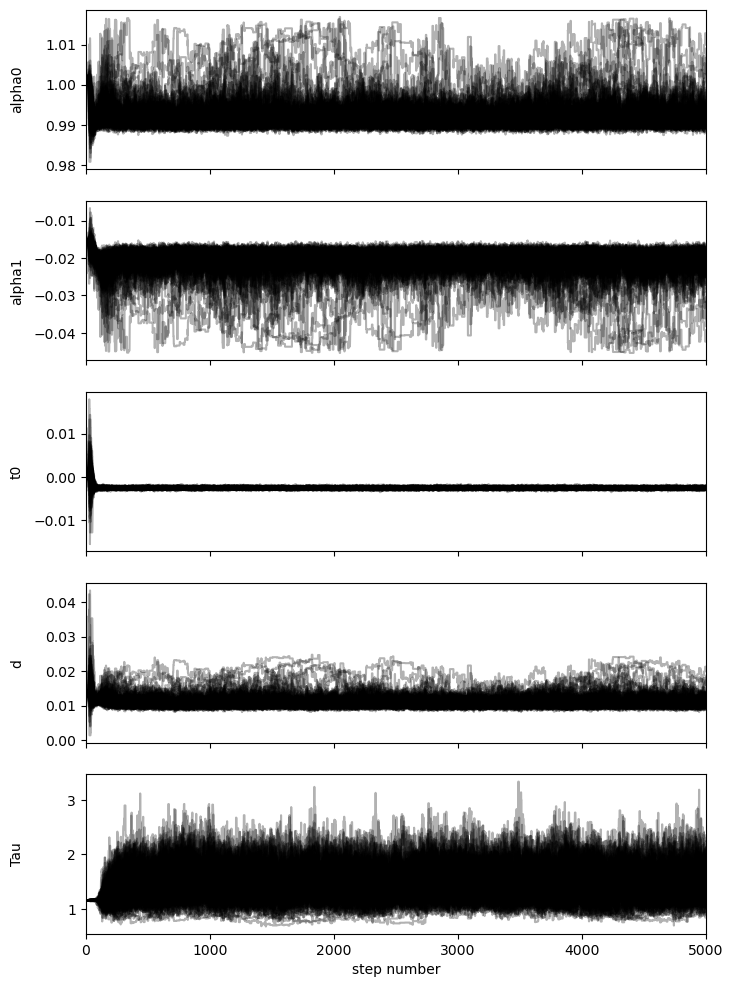

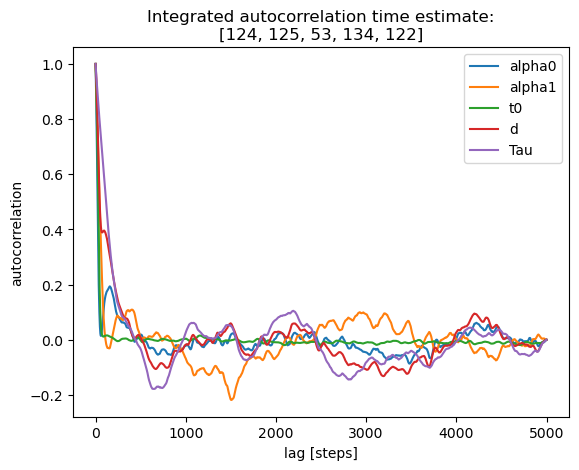

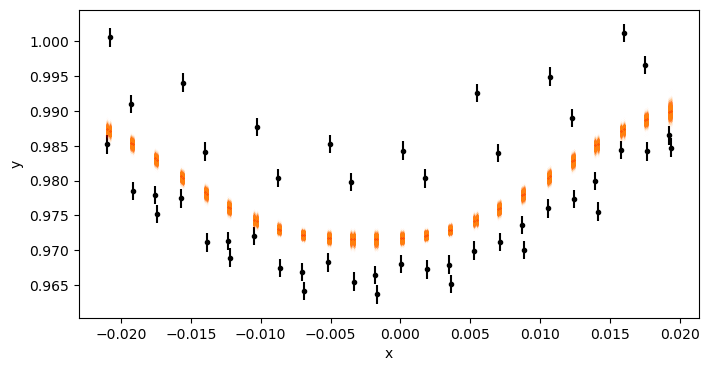

14 1696.5297514442548


100%|█████████████████████████████████████████████████████████| 5000/5000 [00:23<00:00, 213.91it/s]


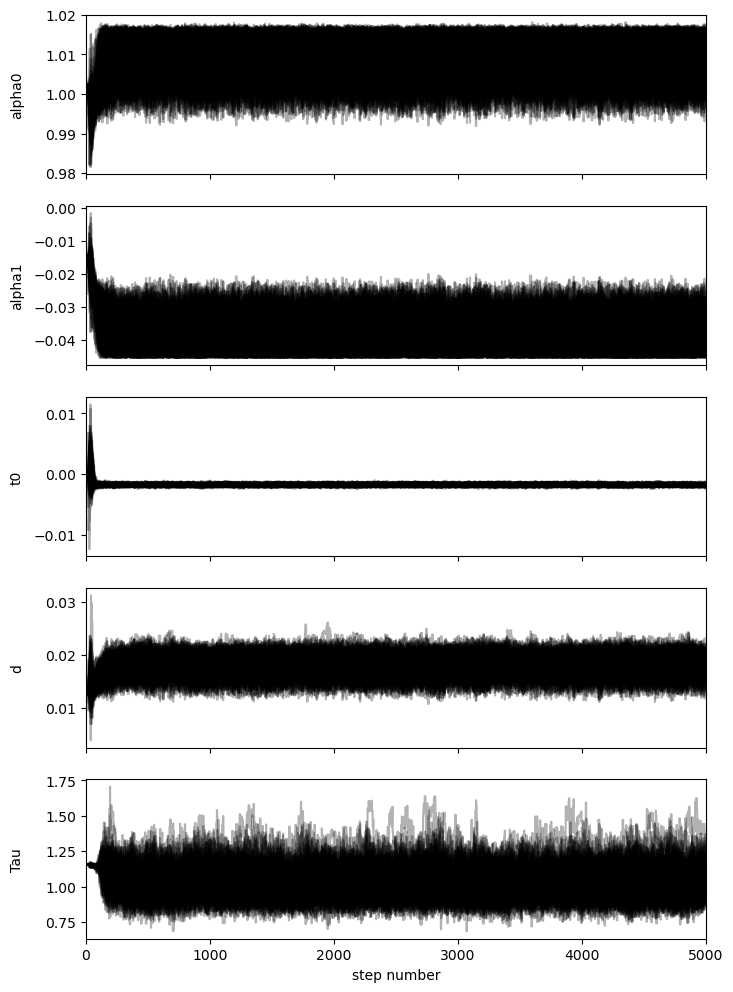

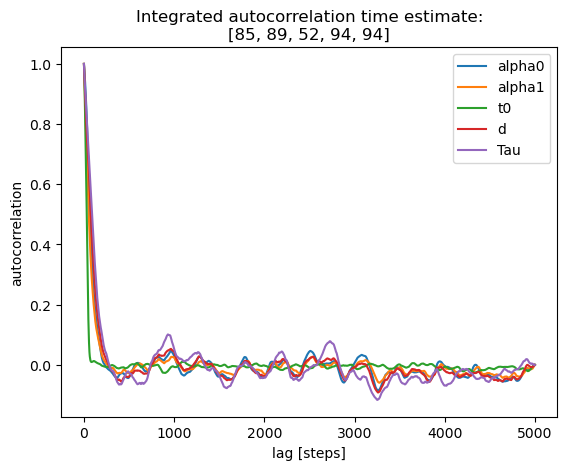

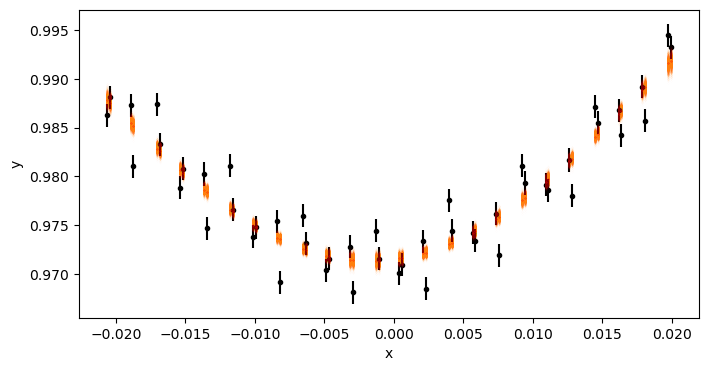

15 1724.2876052205654


100%|█████████████████████████████████████████████████████████| 5000/5000 [00:28<00:00, 175.94it/s]


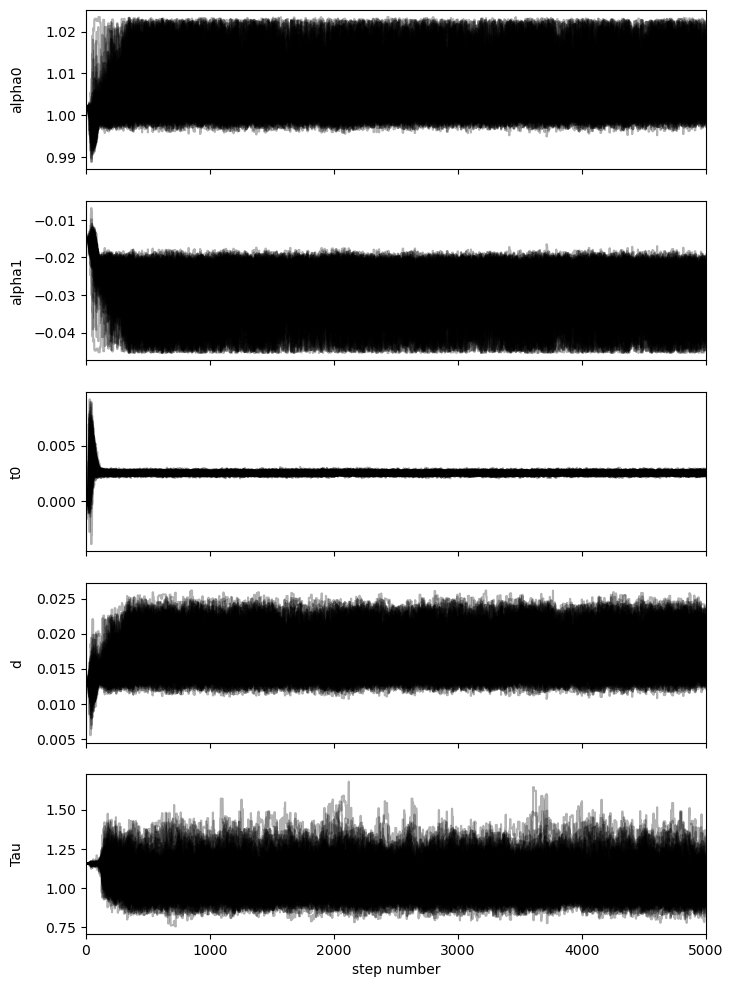

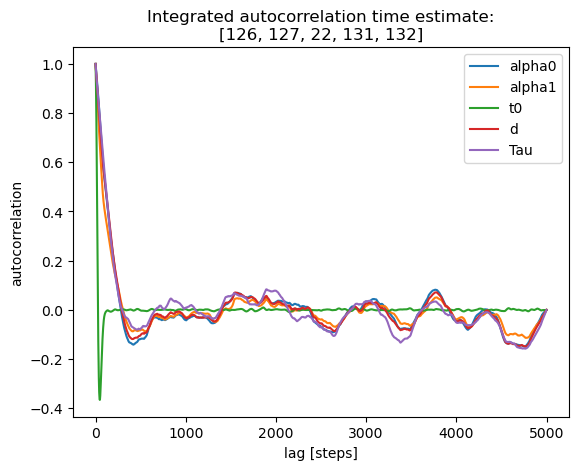

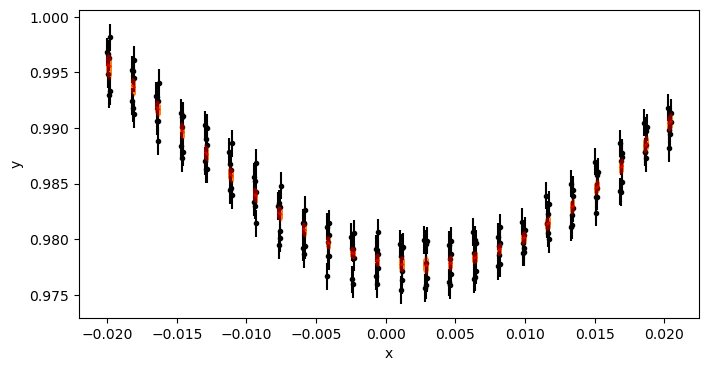

41 2432.072959742361


100%|█████████████████████████████████████████████████████████| 5000/5000 [00:26<00:00, 187.96it/s]


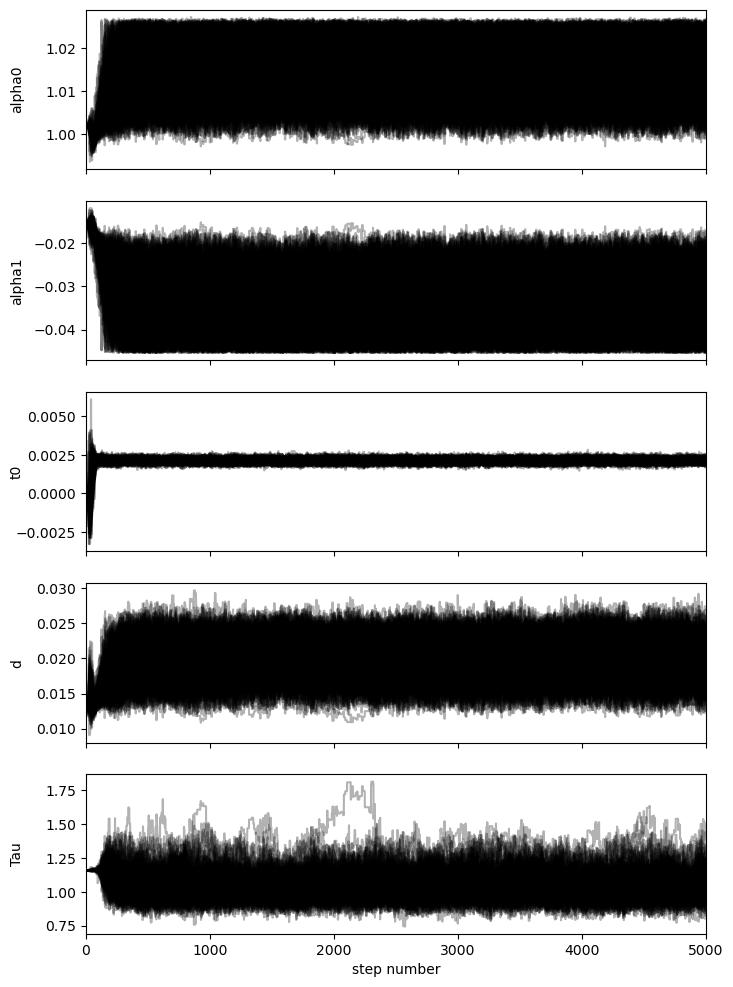

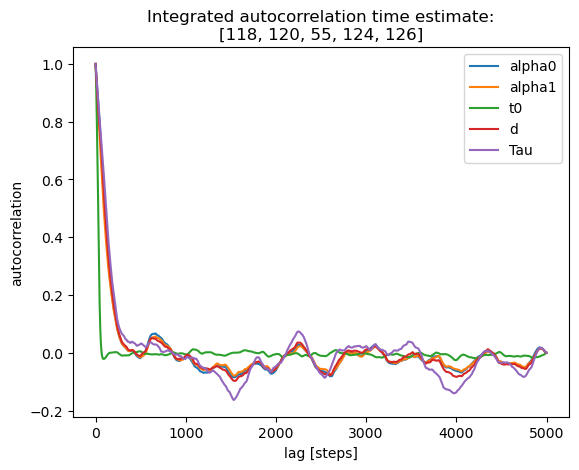

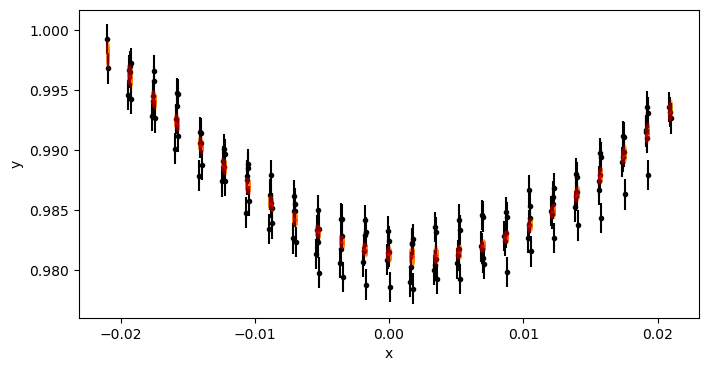

54 2783.003780807773


100%|█████████████████████████████████████████████████████████| 5000/5000 [00:27<00:00, 182.57it/s]


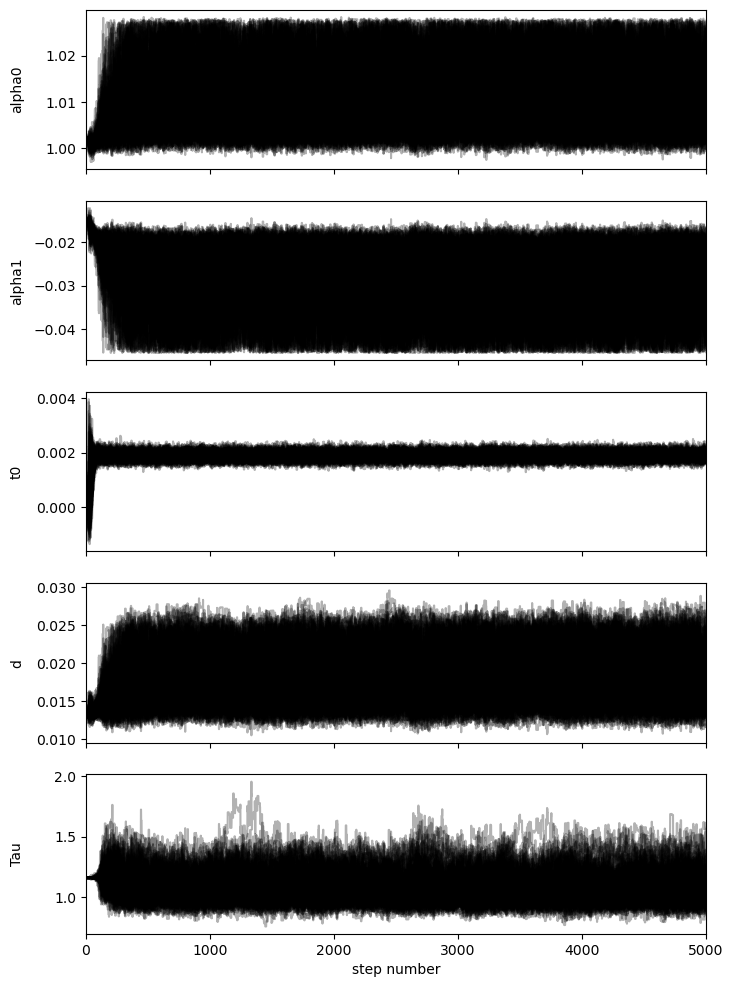

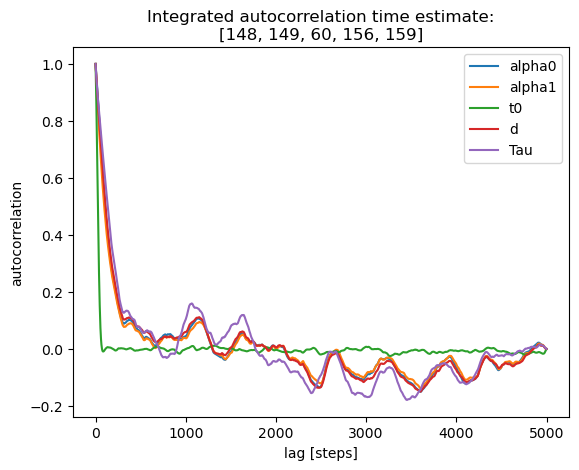

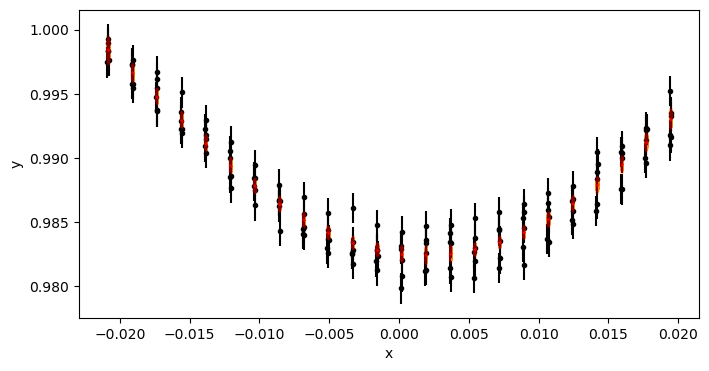

55 2810.7429213184814


100%|█████████████████████████████████████████████████████████| 5000/5000 [00:37<00:00, 132.47it/s]


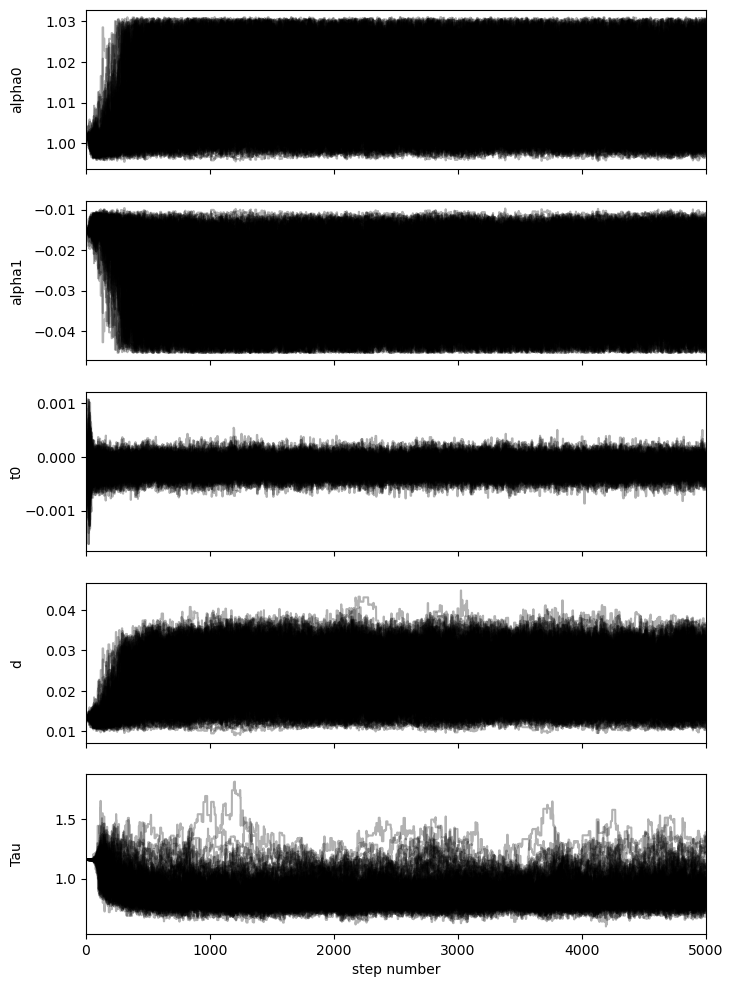

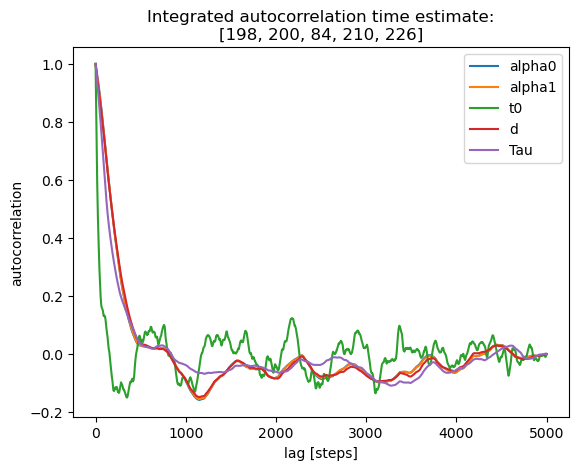

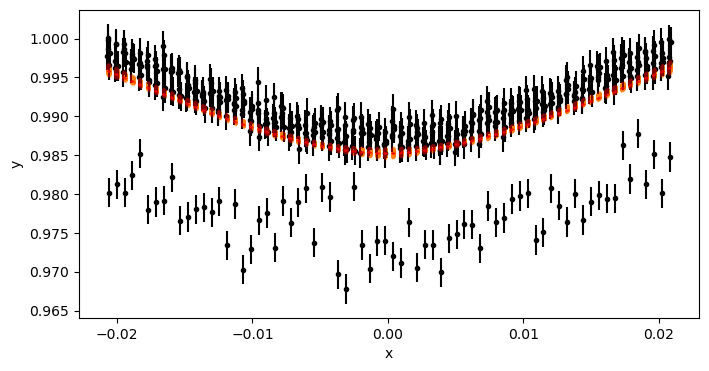

75 3351.9917393086425


100%|█████████████████████████████████████████████████████████| 5000/5000 [00:40<00:00, 124.95it/s]


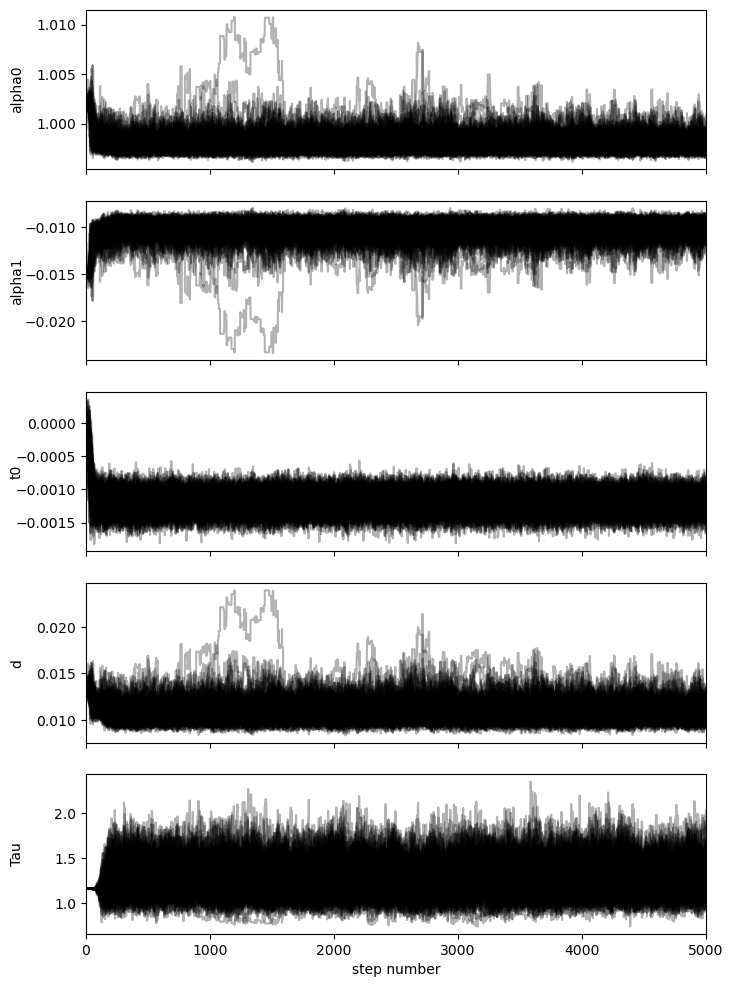

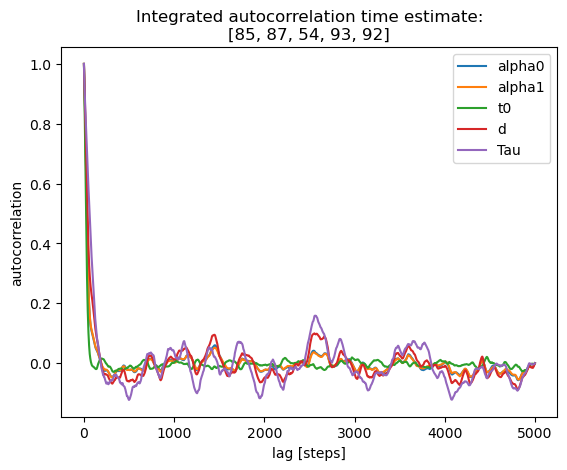

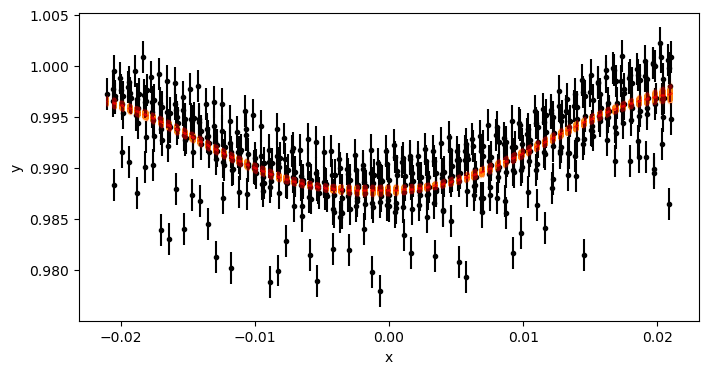

81 3518.6007622572097


100%|█████████████████████████████████████████████████████████| 5000/5000 [00:34<00:00, 143.96it/s]
The chain is shorter than 20 times the integrated autocorrelation time for 4 parameter(s). Use this estimate with caution and run a longer chain!
N/20 = 250;
tau: [266.0674471  266.65953627  89.74539492 272.32399357 257.57400264]


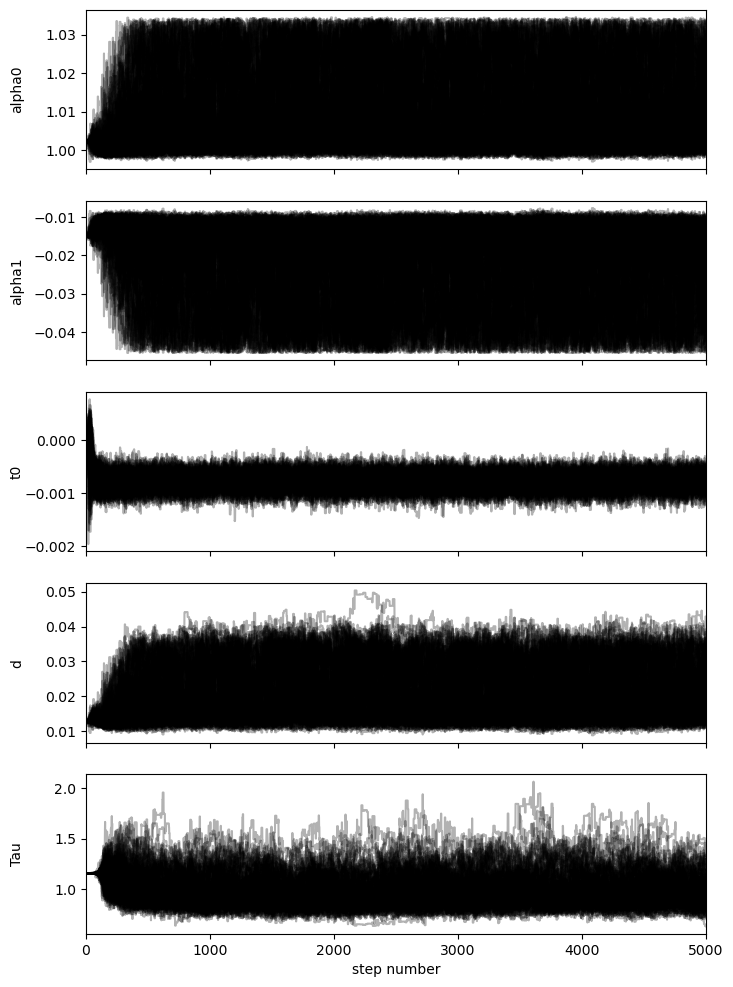

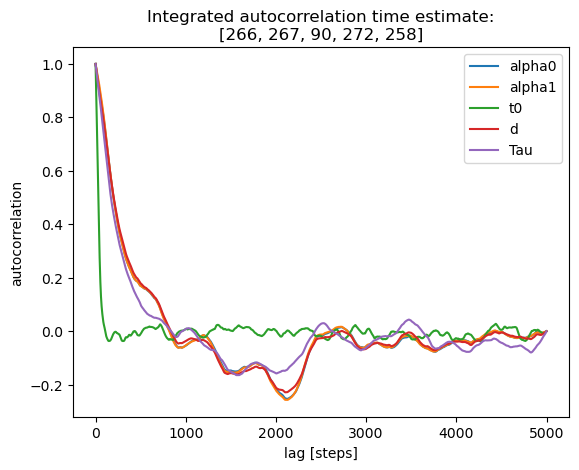

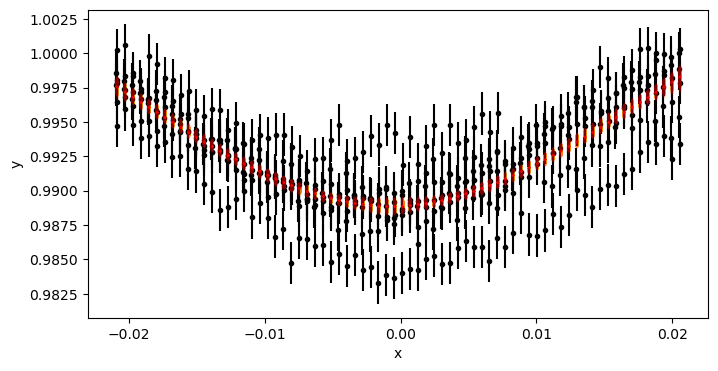

82 3545.712456673671
number,epoch,mean_alpha0,mean_alpha1,t0,stdv_t0,mean_d,mean_Tau
14,1696.5297514442548,0.9914891392741656,-0.01988432494250353,-0.002501922259197956,0.00021567360541065514,0.01067501814133225,1.452606785228331
15,1724.2876052205654,1.0105003534557788,-0.03915481756838379,-0.0017458020166821575,0.00017111477847538267,0.018660229489378545,1.0166131209800244
41,2432.072959742361,1.0049534844908847,-0.02724177415923652,0.002532240248940962,0.00011892540259990807,0.016281411342910404,1.0403120063842366
54,2783.003780807773,1.0150443954203159,-0.033882077667700405,0.0021189694536122797,0.00014762316625458298,0.02046504023311251,1.0277695025197309
55,2810.7429213184814,1.0094150786169185,-0.026948165703138117,0.0018899916428845767,0.00014392697740995988,0.017674003324158867,1.064553645864812
75,3351.9917393086425,1.0108135204105855,-0.02555564166512462,-0.00017911155097717236,0.00014954879185866365,0.022564711308413914,0.852954061897542
81,3518.6007622572097,0.997913149408

In [14]:
etv_out_str_s = "number,epoch,mean_alpha0,mean_alpha1,t0,stdv_t0,mean_d,mean_Tau\n"


from types import SimpleNamespace

# use a custom log_prior so that emcee won't waste time going over amplitude (alpha1) that is too large
# in order for use the custom log_prior in emcee, I then need to create a custom log_probability
def custom_log_prior(theta):
    alpha0, alpha1, t0, d, Tau = theta
    if (0 < alpha0 < 10) and (mean_alpha1_s * 3 < alpha1 < 0) and (-0.5 < t0 < 0.5) and (0 < d < 10) and (0.5 < Tau < 50):
        return 0.0
    return -np.inf

    
def custom_log_probability(theta, x, y, yerr):
    # check that the priors are satisfied
    lp = custom_log_prior(theta)
    if not np.isfinite(lp):
        return -np.inf
    return lp + etv_functions.log_likelihood(theta, x, y, yerr)


for lc in lcc_tess[:]: 
    lc_f = lc.fold(epoch_time=t0_secondary, period=period_s, normalize_phase=True)
    lc_f = lc_f.truncate(-window_width_s / 2, window_width_s / 2)
    # lc_f = lc_f.truncate(0.96, 1.015, column="flux")  # crude remove outliers (not needed in the window)
    # if True: # for diagnostics
    #     ax = lc_f.scatter(label=f"S. {lc.sector}");  
    #     continue
        
    # convert lc to the form needed by fit etv_functions
    lc_f_data = SimpleNamespace(time=lc_f.time_original.value, phase=lc_f.time.value, flux=np.array(lc_f.flux.value), err=np.array(lc_f.flux_err.value))

    start_vals_s = [mean_alpha0_s, mean_alpha1_s, 0, mean_d_s, mean_Tau_s]  # mean_t0 is not helpful at all

    start_vals_dict_s = dict(alpha0=mean_alpha0_s, alpha1=mean_alpha1_s, t0=0, d=mean_d_s, Tau=mean_Tau_s)
    _alpha0, _alpha1, _t0, _d, _Tau, _fit_params_stats = etv_functions.run_mcmc_initial_fit_of_model(
        custom_log_probability, etv_functions.coshgauss_model_fit,
        lc_f_data, start_vals_dict_s, 
        # nruns=40, discard=6, 
        nruns=5000, discard=1000,  # ?? is probably sufficient
        autocorr_time_kwargs=dict(tol=20), pool=None, plot_chains=True,  plot_autocorrelation=True, plot=True, also_return_stats=True)
    
    # _alpha0, _alpha1, _t0, _d, _Tau, _fit_params_stats = etv_functions.run_mcmc_initial_fit(
    #     lc_f_data, start_vals_s, 
    #     # nruns=40, discard=6, 
    #     nruns=5000, discard=1000,  # ?? is probably sufficient
    #     autocorr_time_kwargs=dict(tol=20), pool=-2, plot_chains=True,  plot_autocorrelation=True, plot=True, also_return_stats=True)
    
    _stdv_t0 = _fit_params_stats["std_t0"]
    _t = np.mean(lc_f.time_original.value)  # approximate transit time 
    print(lc.sector, _t)
    
    etv_out_str_s += ",".join([str(s) for s in [lc.sector, _t, _alpha0, _alpha1, _t0, _stdv_t0, _d, _Tau]])
    etv_out_str_s += "\n"

print(etv_out_str_s)

In [ ]:
# # Keep the result in a cell for safekeeping
# etv_out_str_s = """\
# number,epoch,mean_alpha0,mean_alpha1,t0,stdv_t0,mean_d,mean_Tau
# 14,1696.5297514442548,0.9914891392741656,-0.01988432494250353,-0.002501922259197956,0.00021567360541065514,0.01067501814133225,1.452606785228331
# 15,1724.2876052205654,1.0105003534557788,-0.03915481756838379,-0.0017458020166821575,0.00017111477847538267,0.018660229489378545,1.0166131209800244
# 41,2432.072959742361,1.0049534844908847,-0.02724177415923652,0.002532240248940962,0.00011892540259990807,0.016281411342910404,1.0403120063842366
# 54,2783.003780807773,1.0150443954203159,-0.033882077667700405,0.0021189694536122797,0.00014762316625458298,0.02046504023311251,1.0277695025197309
# 55,2810.7429213184814,1.0094150786169185,-0.026948165703138117,0.0018899916428845767,0.00014392697740995988,0.017674003324158867,1.064553645864812
# 75,3351.9917393086425,1.0108135204105855,-0.02555564166512462,-0.00017911155097717236,0.00014954879185866365,0.022564711308413914,0.852954061897542
# 81,3518.6007622572097,0.9979131494086556,-0.010089927416007644,-0.0011946200039621756,0.0001445474623212018,0.010745154580725884,1.2585824947960262
# 82,3545.712456673671,1.006830022807498,-0.01796028414836623,-0.000776579708091111,0.0001550903137152167,0.01902392255438851,0.9312798569846803
# """

### Run custom individual fit (per-cycle)

In [33]:
# the stitched, outlier-filtered  data
lc_data = lk.LightCurve(time=Time(data.time, format="btjd"), flux=data.flux, flux_err=data.err)
len(lc_data)
# lc_data.scatter();

34971

#### per-cycle fit for `data_primary`

100%|██████████████████████████████████████████████████████████| 3000/3000 [00:32<00:00, 93.18it/s]


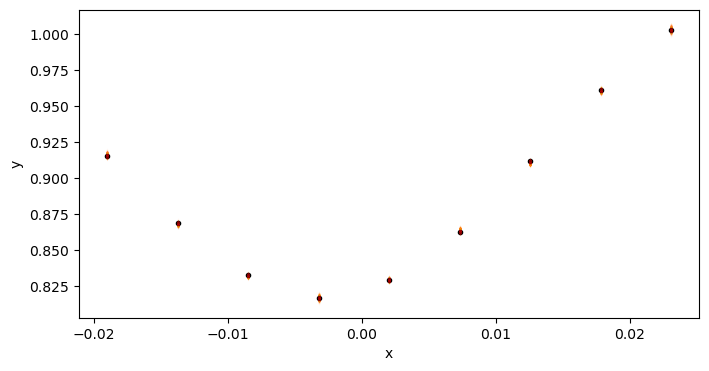

0 1683.946117294625


100%|██████████████████████████████████████████████████████████| 3000/3000 [00:30<00:00, 97.62it/s]


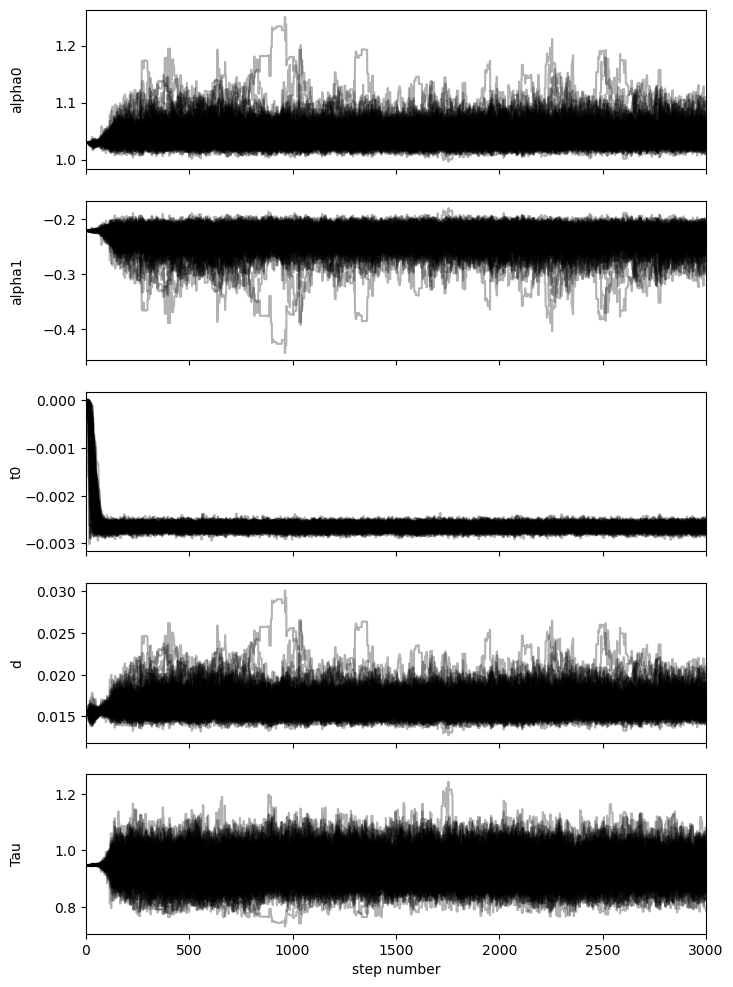

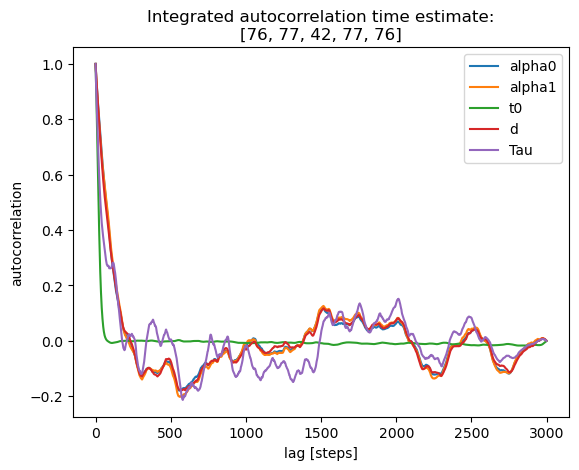

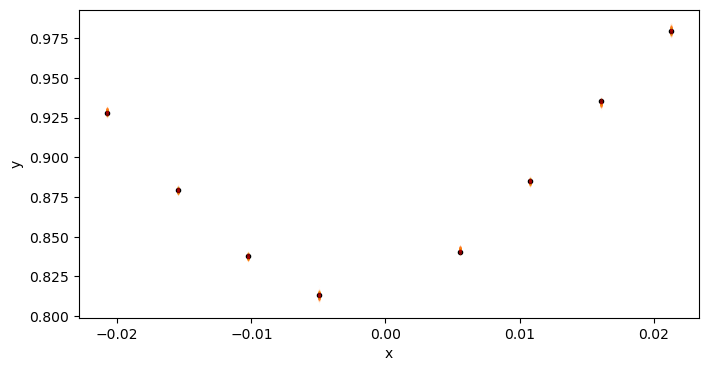

1 1687.9045365388042


100%|██████████████████████████████████████████████████████████| 3000/3000 [00:32<00:00, 92.93it/s]


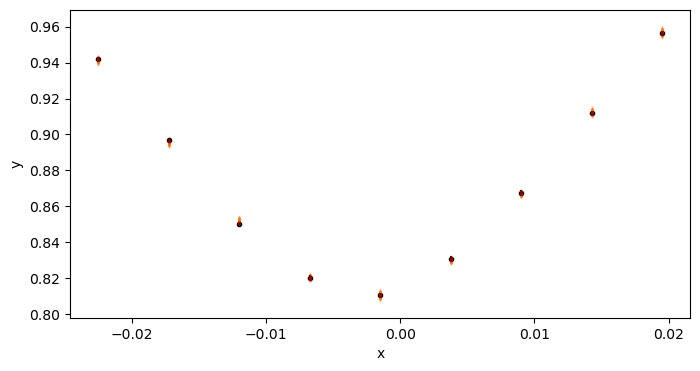

2 1691.8629574760669


100%|██████████████████████████████████████████████████████████| 3000/3000 [00:30<00:00, 97.97it/s]


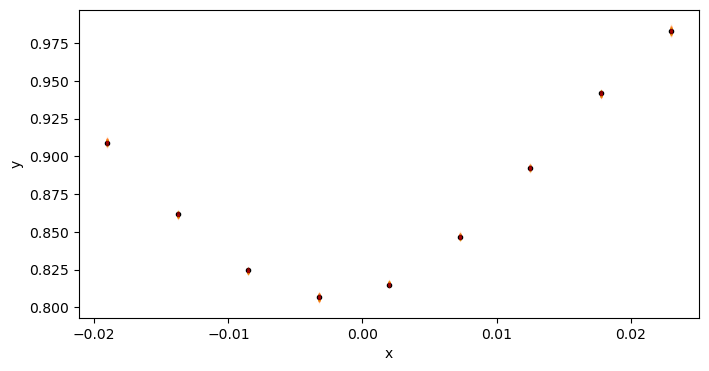

3 1695.8422128657317


100%|██████████████████████████████████████████████████████████| 3000/3000 [00:31<00:00, 94.10it/s]


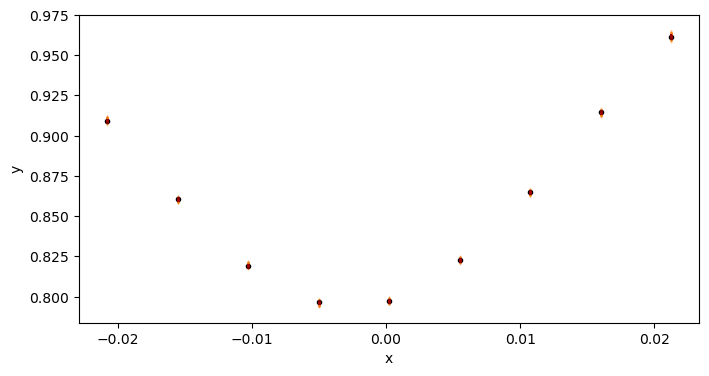

4 1699.8006597722313


100%|██████████████████████████████████████████████████████████| 3000/3000 [00:30<00:00, 98.27it/s]


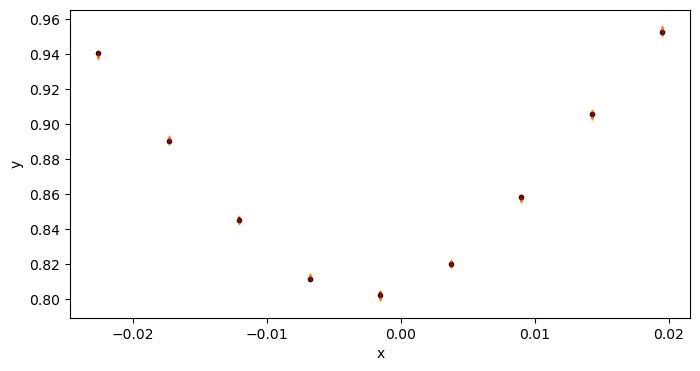

5 1703.7591118558723


100%|██████████████████████████████████████████████████████████| 3000/3000 [00:32<00:00, 93.20it/s]


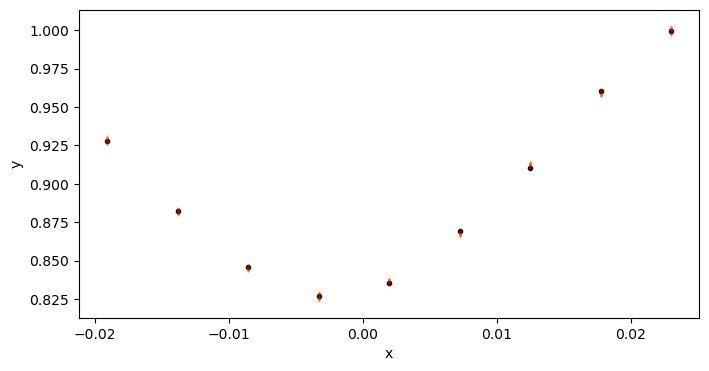

6 1707.7383982255753


100%|████████████████████████████████████████████████████████| 3000/3000 [2:29:57<00:00,  3.00s/it]


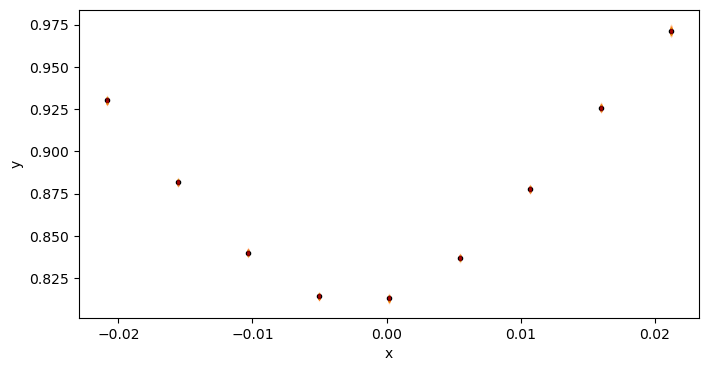

7 1711.696856383501


100%|██████████████████████████████████████████████████████████| 3000/3000 [00:32<00:00, 92.01it/s]
The chain is shorter than 20 times the integrated autocorrelation time for 4 parameter(s). Use this estimate with caution and run a longer chain!
N/20 = 150;
tau: [322.87895561 323.2987038   47.8380426  331.7280425  338.17566662]


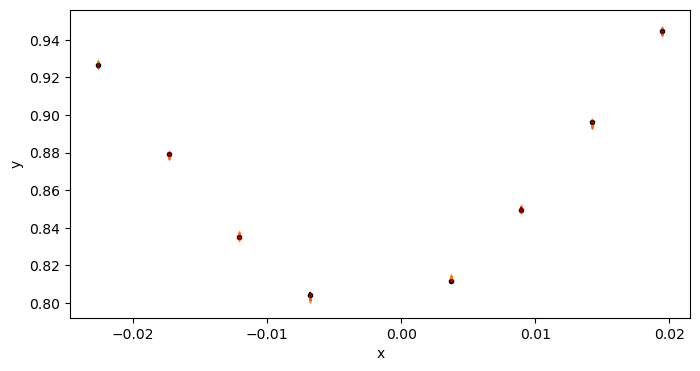

8 1715.6553354672349


100%|██████████████████████████████████████████████████████████| 3000/3000 [00:30<00:00, 98.14it/s]


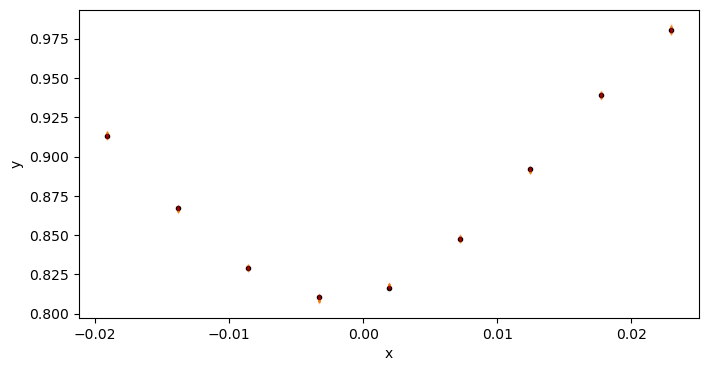

9 1719.6346460382629


100%|██████████████████████████████████████████████████████████| 3000/3000 [00:32<00:00, 92.81it/s]


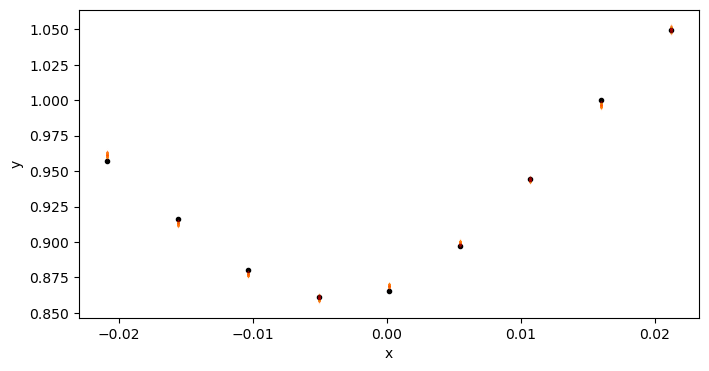

10 1723.5931191020652


100%|██████████████████████████████████████████████████████████| 3000/3000 [00:30<00:00, 99.94it/s]


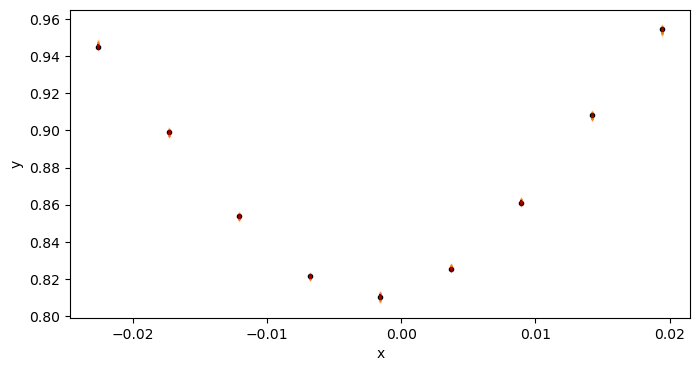

11 1727.5516143756877


100%|██████████████████████████████████████████████████████████| 3000/3000 [00:32<00:00, 93.13it/s]


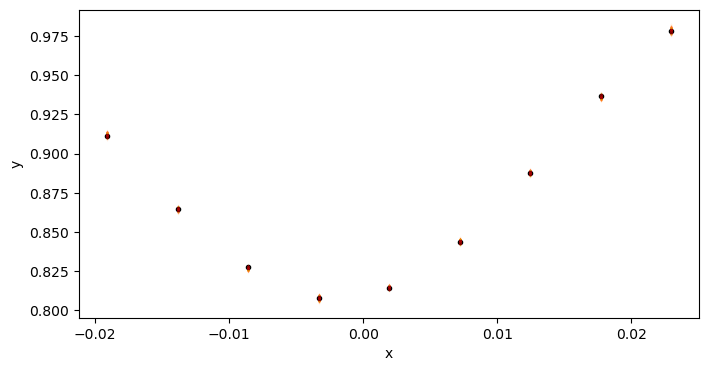

12 1731.530943598768


100%|█████████████████████████████████████████████████████████| 3000/3000 [00:29<00:00, 100.04it/s]


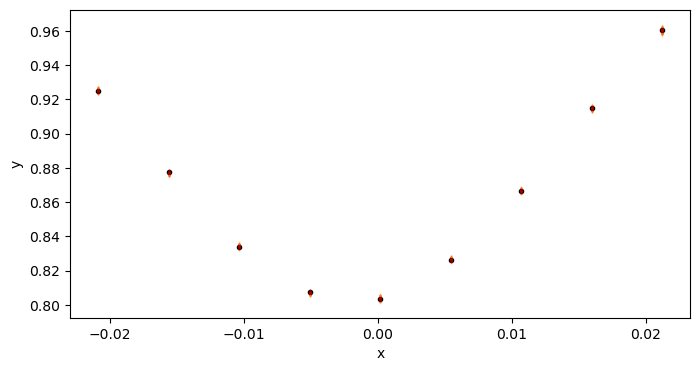

13 1735.4894339056182


100%|██████████████████████████████████████████████████████████| 3000/3000 [00:31<00:00, 94.00it/s]


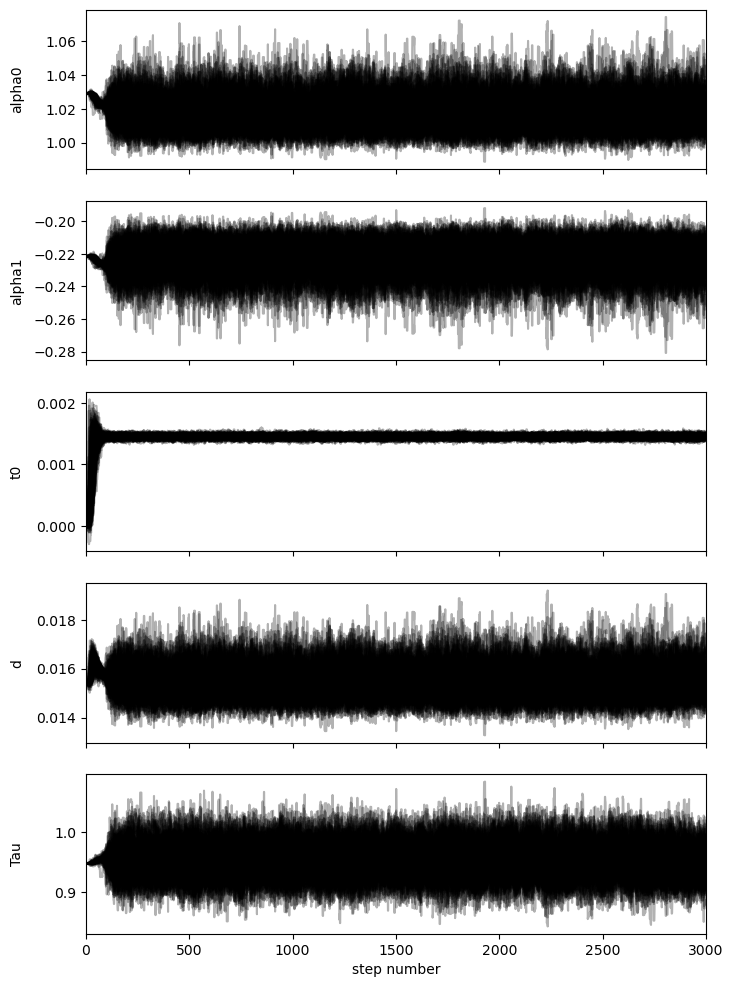

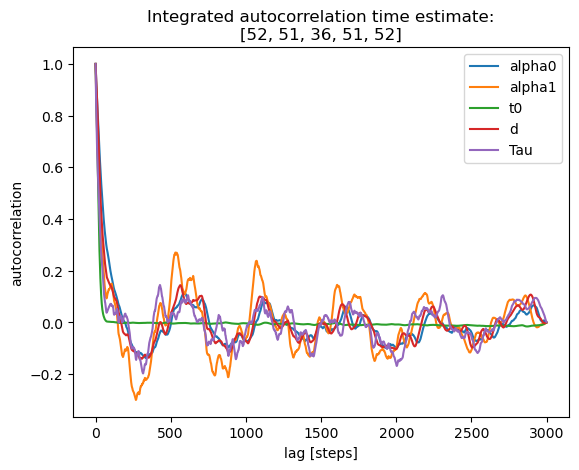

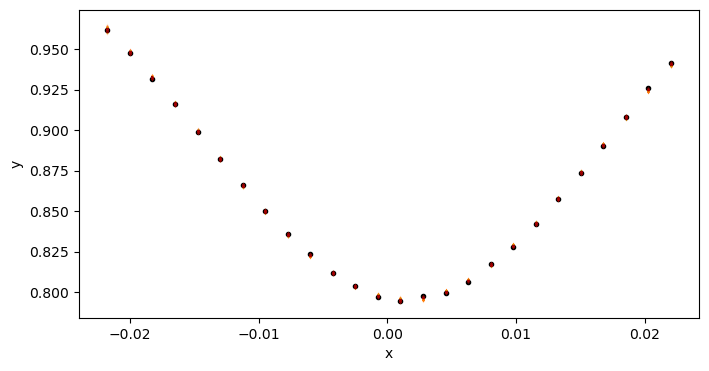

186 2421.5104035289773


100%|██████████████████████████████████████████████████████████| 3000/3000 [00:30<00:00, 99.22it/s]


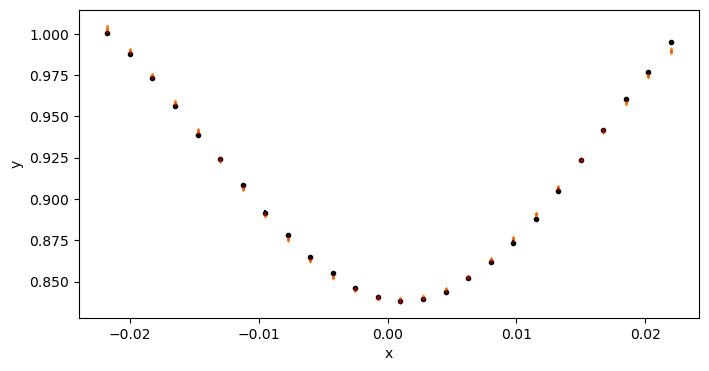

187 2425.4757206944614


100%|██████████████████████████████████████████████████████████| 3000/3000 [00:32<00:00, 92.85it/s]


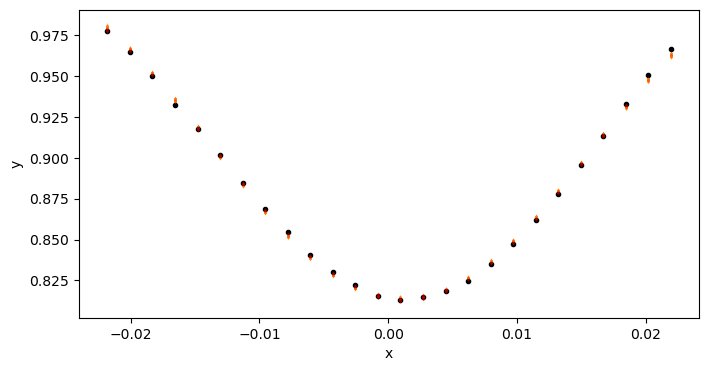

188 2429.4410312582067


100%|██████████████████████████████████████████████████████████| 3000/3000 [00:30<00:00, 99.59it/s]


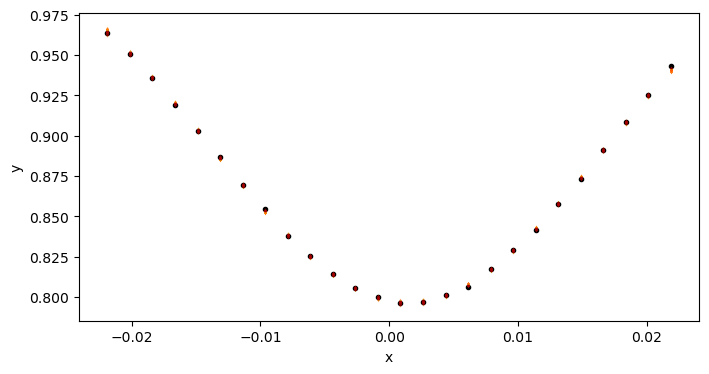

190 2437.371604137969


100%|██████████████████████████████████████████████████████████| 3000/3000 [00:32<00:00, 93.19it/s]


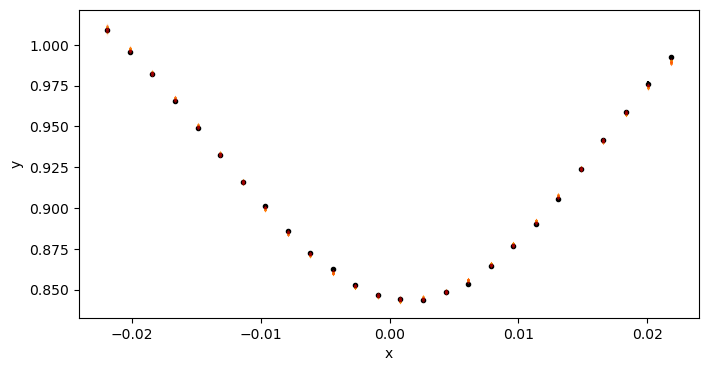

191 2441.3368635884003


100%|██████████████████████████████████████████████████████████| 3000/3000 [00:30<00:00, 98.43it/s]


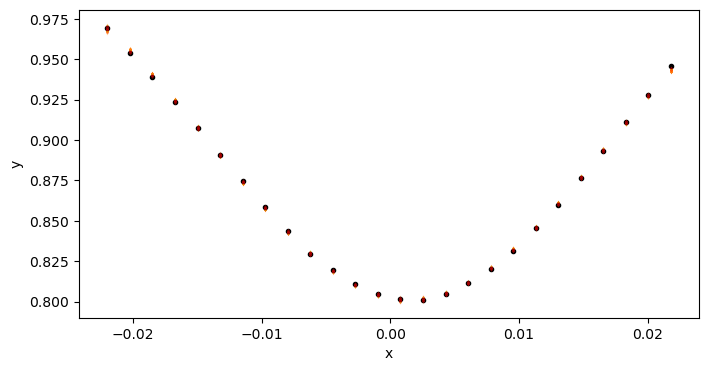

192 2445.302117206329


100%|██████████████████████████████████████████████████████████| 3000/3000 [00:32<00:00, 91.95it/s]


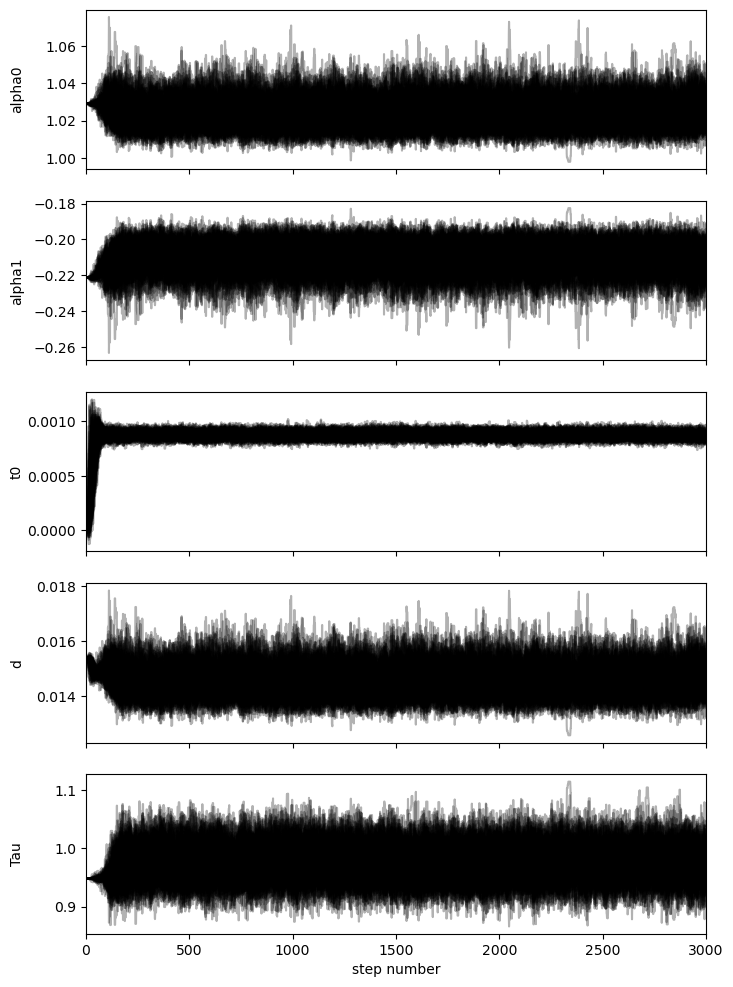

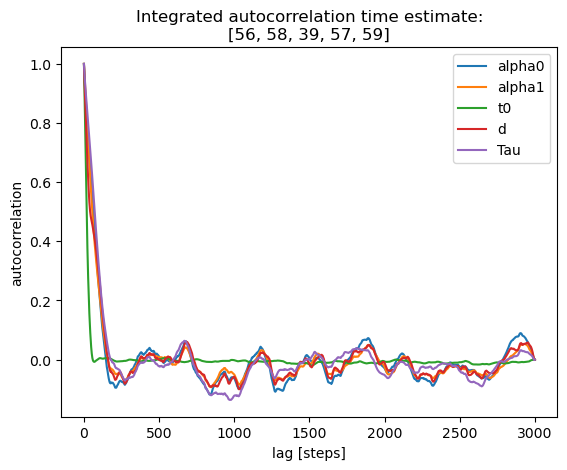

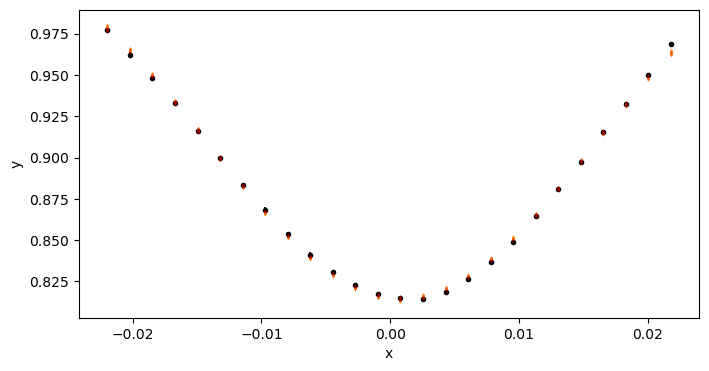

274 2770.46824296625


100%|██████████████████████████████████████████████████████████| 3000/3000 [00:30<00:00, 99.93it/s]


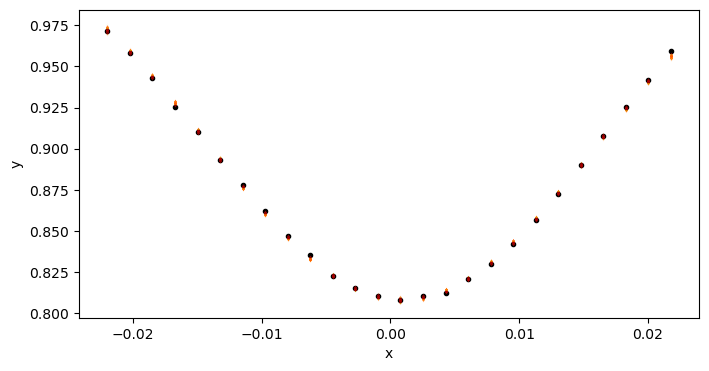

275 2774.43361698814


100%|██████████████████████████████████████████████████████████| 3000/3000 [00:32<00:00, 93.55it/s]


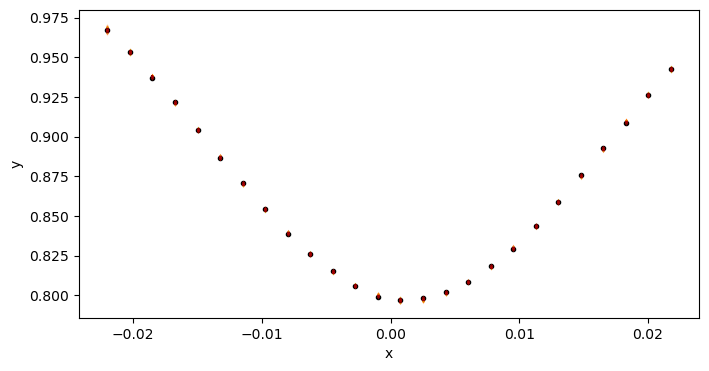

276 2778.3989855812656


100%|██████████████████████████████████████████████████████████| 3000/3000 [00:30<00:00, 98.55it/s]
The chain is shorter than 20 times the integrated autocorrelation time for 5 parameter(s). Use this estimate with caution and run a longer chain!
N/20 = 150;
tau: [372.9696843  378.28432103 383.03415974 382.90575335 352.07596803]


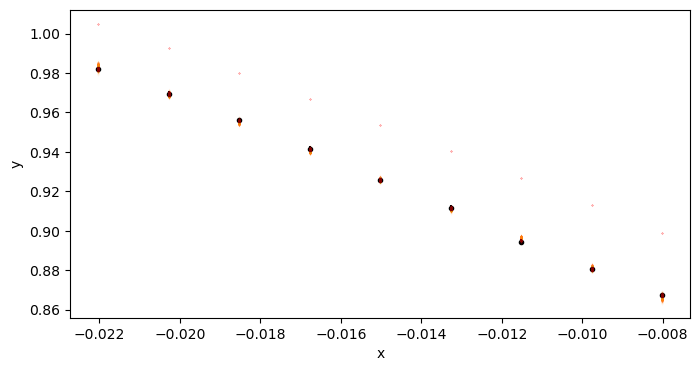

277 2782.3053211047427


100%|██████████████████████████████████████████████████████████| 3000/3000 [00:32<00:00, 93.02it/s]


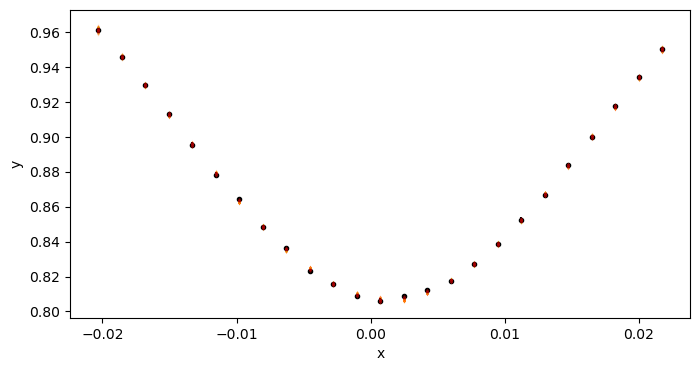

278 2786.333158174168


100%|██████████████████████████████████████████████████████████| 3000/3000 [00:30<00:00, 99.12it/s]


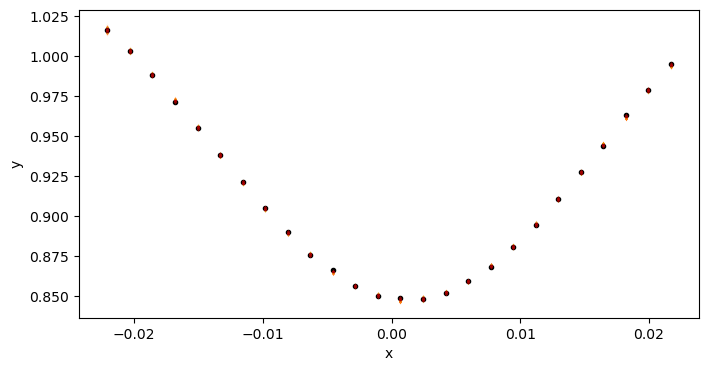

279 2790.295007301029


100%|██████████████████████████████████████████████████████████| 3000/3000 [00:32<00:00, 92.89it/s]


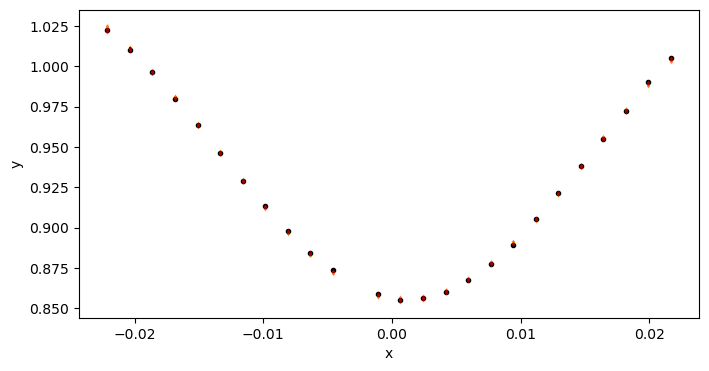

280 2794.260739454307


100%|██████████████████████████████████████████████████████████| 3000/3000 [00:30<00:00, 97.74it/s]


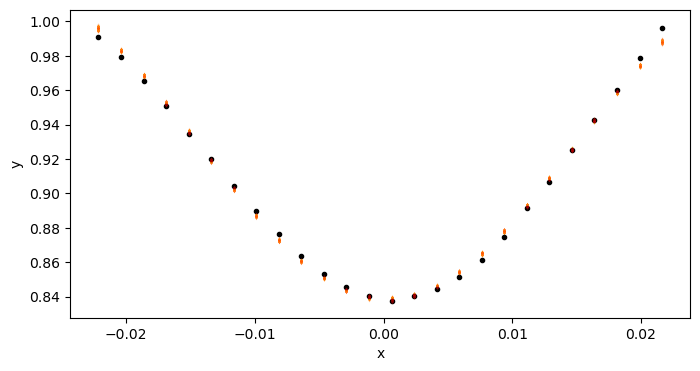

281 2798.2256337692456


100%|██████████████████████████████████████████████████████████| 3000/3000 [00:32<00:00, 93.73it/s]


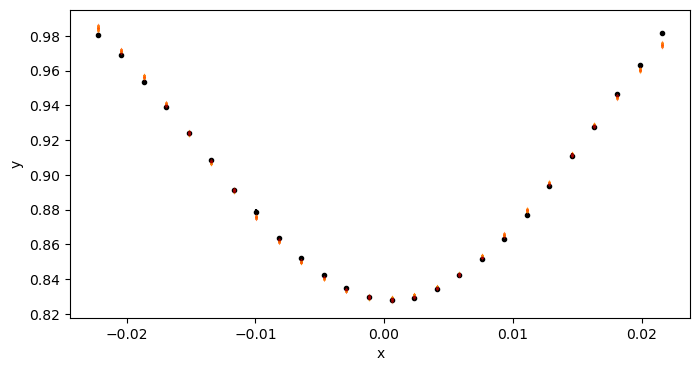

282 2802.1909056647764


100%|█████████████████████████████████████████████████████████| 3000/3000 [00:29<00:00, 100.32it/s]


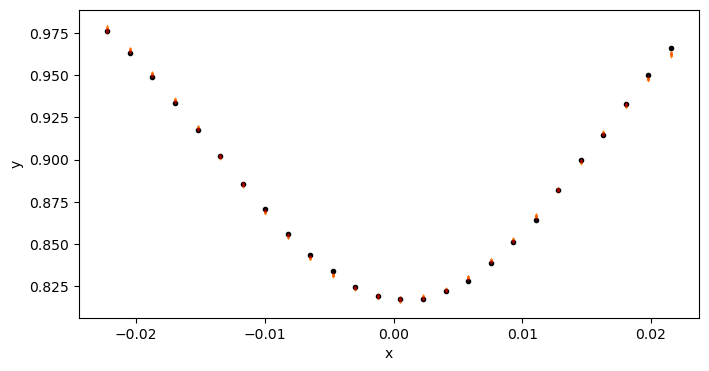

283 2806.1561703938914


100%|██████████████████████████████████████████████████████████| 3000/3000 [00:32<00:00, 93.52it/s]


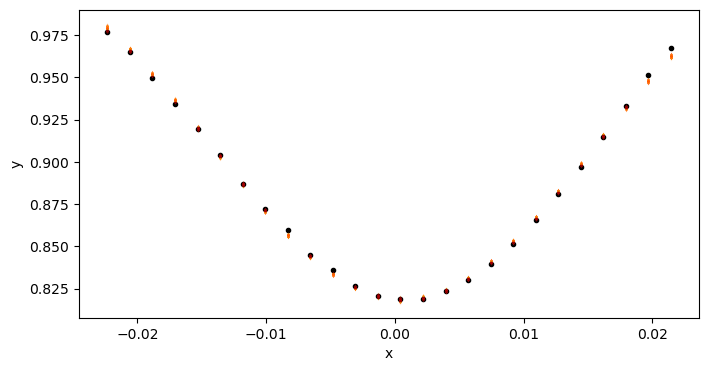

285 2814.0866569313807


100%|██████████████████████████████████████████████████████████| 3000/3000 [00:30<00:00, 97.19it/s]


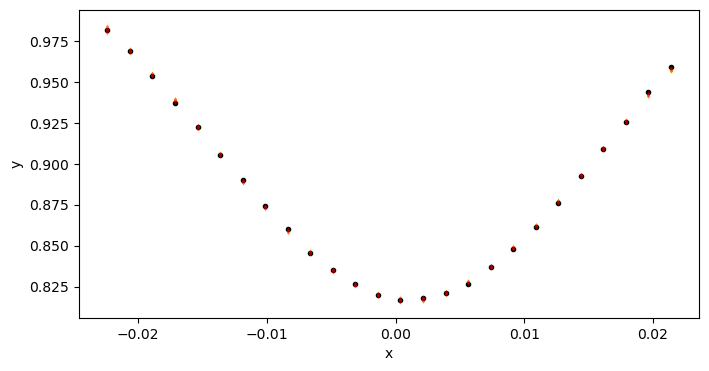

286 2818.0518707509186


100%|██████████████████████████████████████████████████████████| 3000/3000 [00:31<00:00, 94.24it/s]


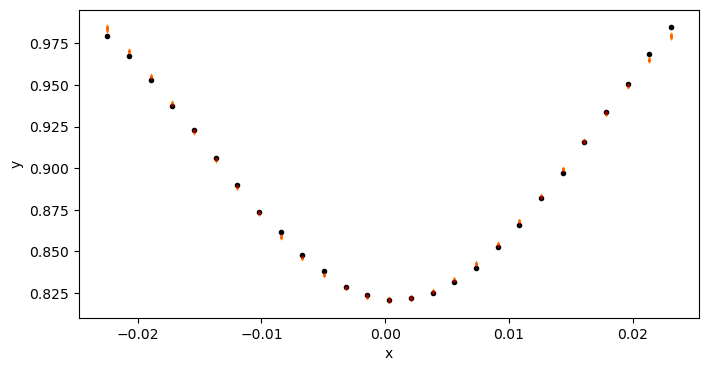

287 2822.0205508485606


100%|██████████████████████████████████████████████████████████| 3000/3000 [00:31<00:00, 94.50it/s]


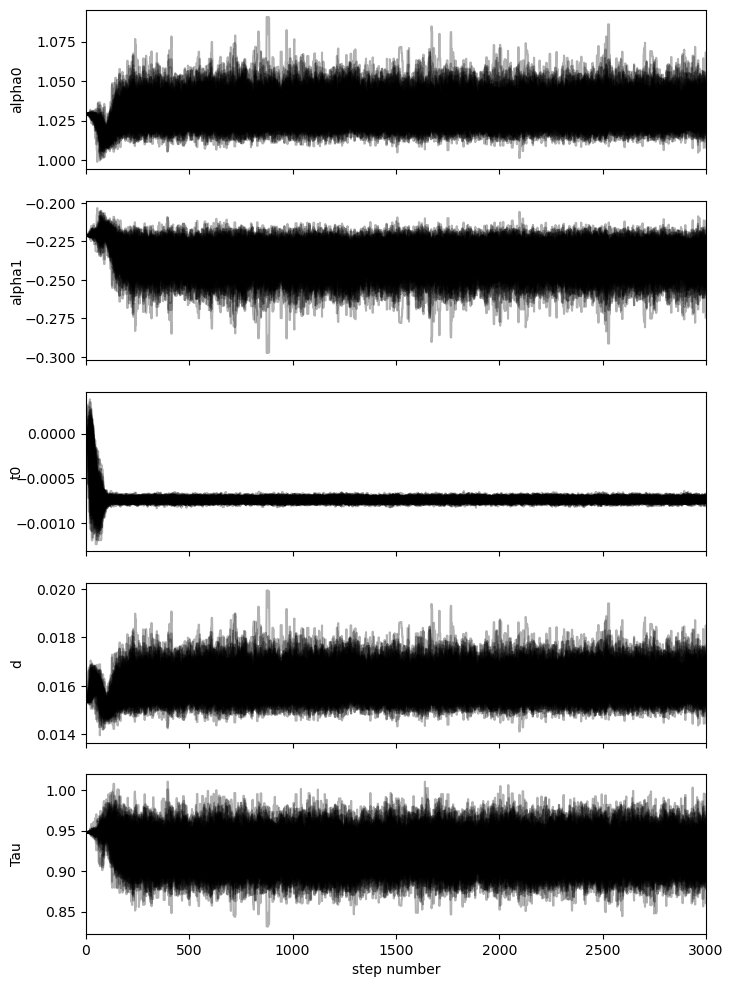

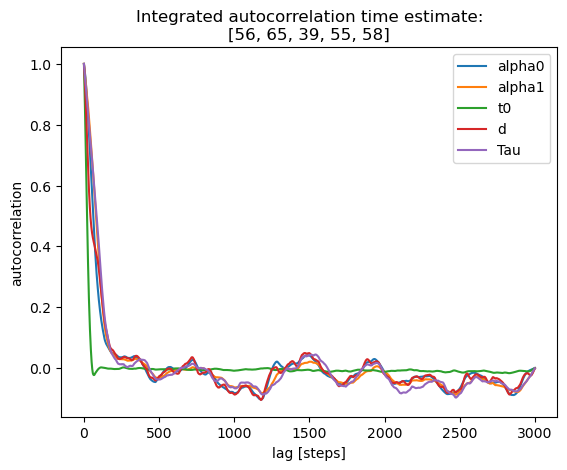

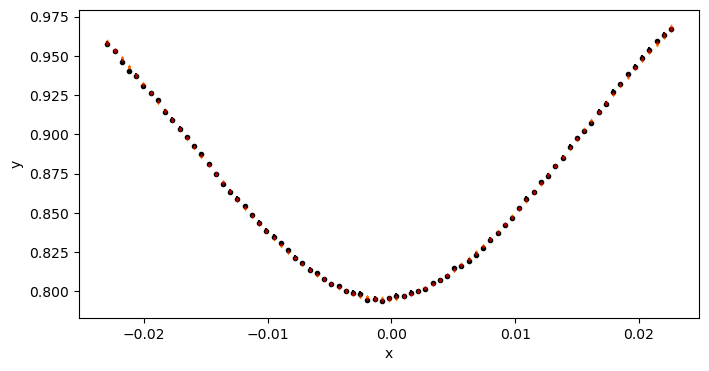

460 3508.0396518765256


100%|██████████████████████████████████████████████████████████| 3000/3000 [00:31<00:00, 93.87it/s]


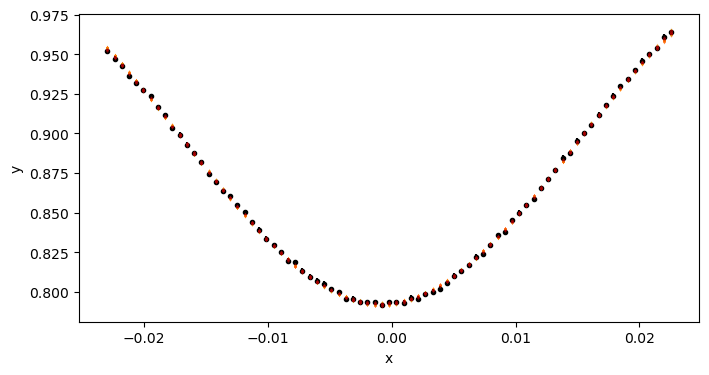

461 3512.0050058621337


100%|██████████████████████████████████████████████████████████| 3000/3000 [00:30<00:00, 97.84it/s]


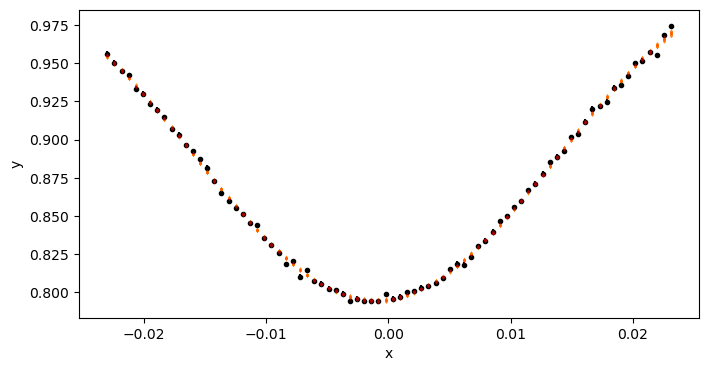

462 3515.971504696542


100%|██████████████████████████████████████████████████████████| 3000/3000 [00:31<00:00, 94.28it/s]
The chain is shorter than 20 times the integrated autocorrelation time for 4 parameter(s). Use this estimate with caution and run a longer chain!
N/20 = 150;
tau: [370.94265072 371.14122156  35.9977711  376.75976164 272.37632516]


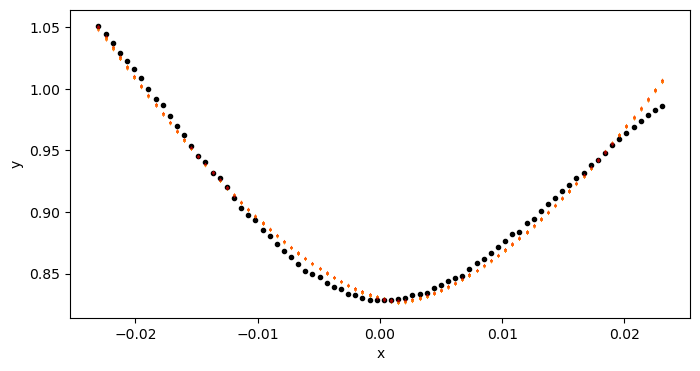

463 3519.936840139185


100%|██████████████████████████████████████████████████████████| 3000/3000 [00:30<00:00, 99.90it/s]


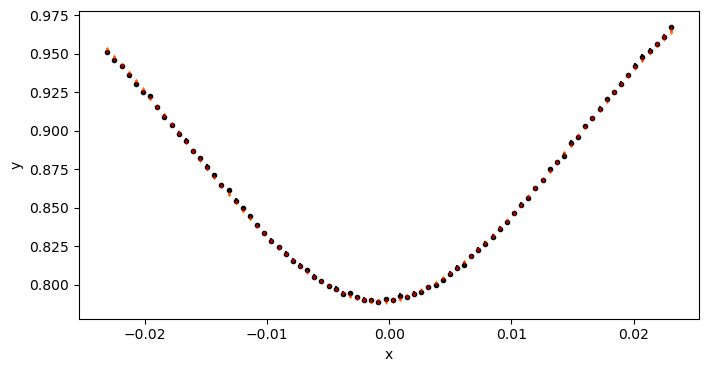

464 3523.9021524649797


100%|██████████████████████████████████████████████████████████| 3000/3000 [00:31<00:00, 95.09it/s]


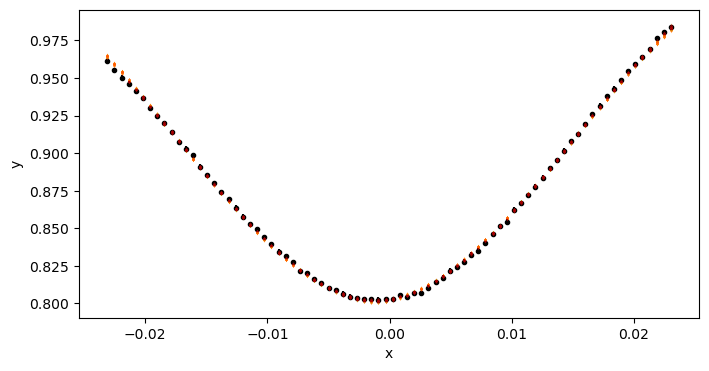

465 3527.8674473497754


100%|██████████████████████████████████████████████████████████| 3000/3000 [00:30<00:00, 97.41it/s]


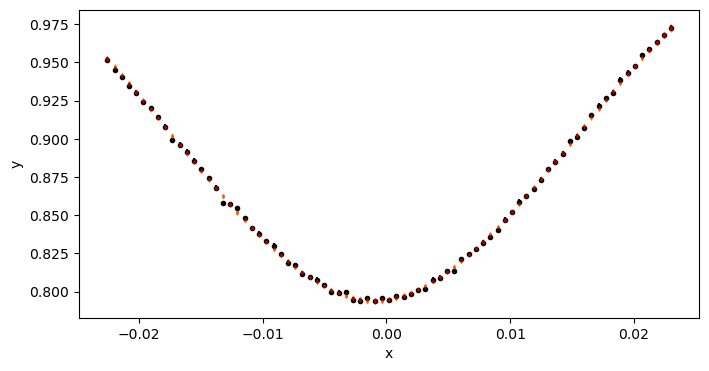

466 3531.833890360159


100%|██████████████████████████████████████████████████████████| 3000/3000 [00:31<00:00, 94.38it/s]


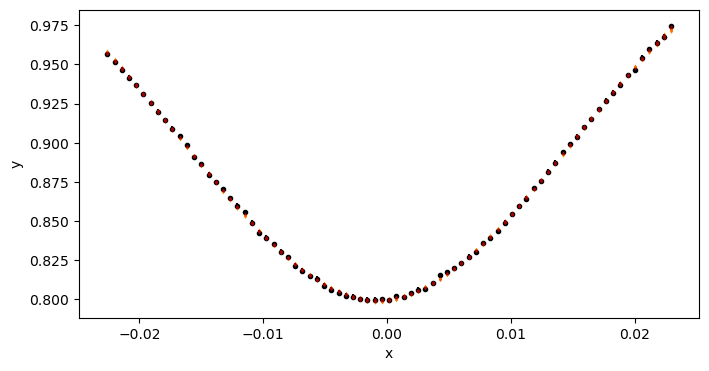

467 3535.7991611304233


100%|██████████████████████████████████████████████████████████| 3000/3000 [00:30<00:00, 99.33it/s]


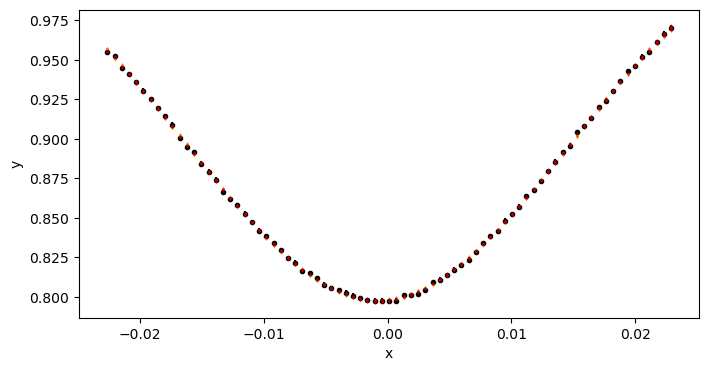

468 3539.7644090229423


100%|██████████████████████████████████████████████████████████| 3000/3000 [00:32<00:00, 93.25it/s]


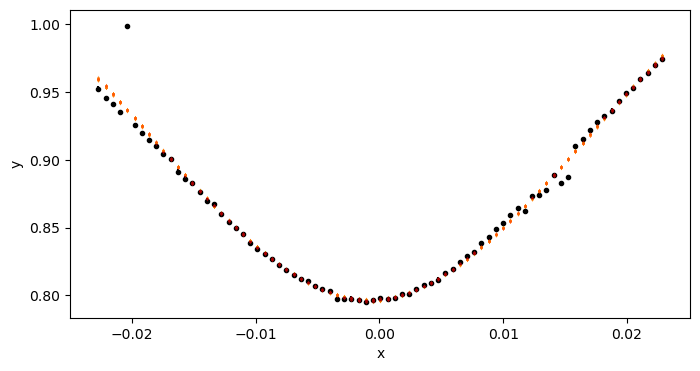

469 3543.7296459411773


100%|██████████████████████████████████████████████████████████| 3000/3000 [00:30<00:00, 99.22it/s]


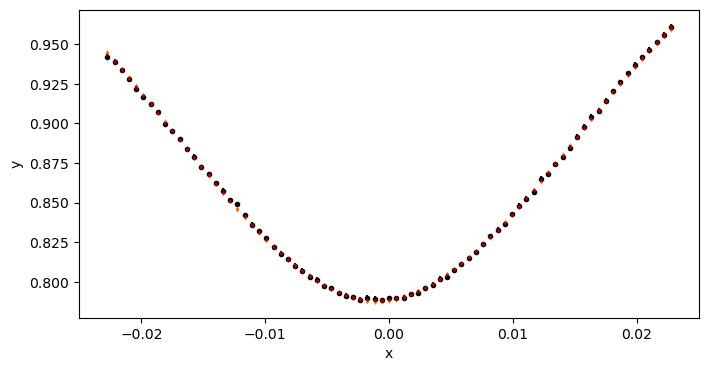

470 3547.694873442118


100%|██████████████████████████████████████████████████████████| 3000/3000 [00:31<00:00, 94.77it/s]


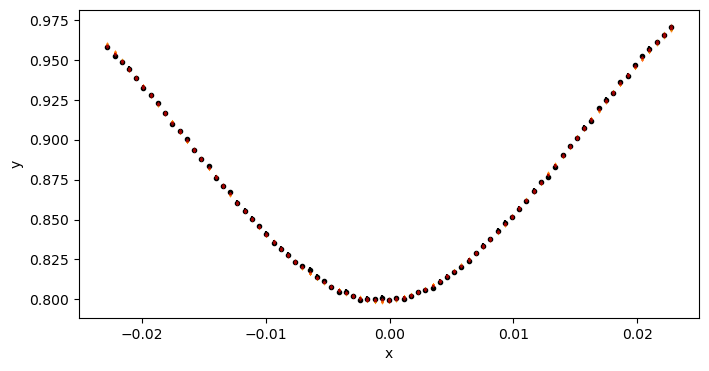

471 3551.660075836036


100%|█████████████████████████████████████████████████████████| 3000/3000 [00:29<00:00, 100.69it/s]


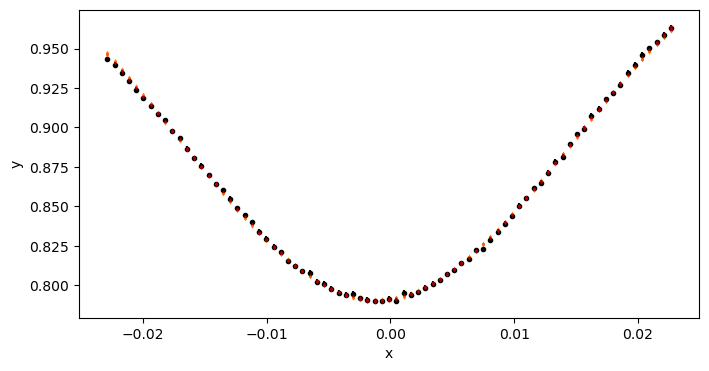

472 3555.625265782901
number,epoch,mean_alpha0,mean_alpha1,t0,stdv_t0,mean_d,mean_Tau
0,1683.946117294625,1.0510050443112058,-0.23427936618644274,-0.002931761914941396,6.648031402337526e-05,0.016447511524142512,0.9439264649301935
1,1687.9045365388042,1.0397208730404721,-0.2296203920460328,-0.0026545530886068333,6.451379584028686e-05,0.016266576760471184,0.940340732814633
2,1691.8629574760669,1.0248718260424117,-0.2149665851142088,-0.0024561493571370894,6.38542852967961e-05,0.016258908760787855,0.8968276530027574
3,1695.8422128657317,1.0283884829345058,-0.22222714930754642,-0.002359557842437031,6.622507280420004e-05,0.015954106191846475,0.9593597106442882
4,1699.8006597722313,1.0336430576294267,-0.24054537104989512,-0.0026502456817965752,6.375488922643593e-05,0.01699228425118847,0.9470040251724527
5,1703.7591118558723,1.0307703130736803,-0.22917759175754343,-0.002312387543878639,6.013597807949149e-05,0.01636823970223787,0.92626431887948
6,1707.7383982255753,1.0477813034138461,-0.2218270

In [24]:

_lc_data_f = lc_data.fold(epoch_time=t0_primary, period=period, normalize_phase=True)

c_etv_out_str = "number,epoch,mean_alpha0,mean_alpha1,t0,stdv_t0,mean_d,mean_Tau\n"

for c in np.unique(_lc_data_f.cycle):
    lc_f = _lc_data_f[_lc_data_f.cycle == c]
    lc_f = lc_f.truncate(-window_width_p / 2, window_width_p / 2)
    if len(lc_f) < 1:
        continue

    if len(lc_f) < 8:
        print(f"Skipped cycle {c} due to insuffient data points {len(lc_f)}")
        continue

    # ax = lc_f.scatter(label=f"C.{c}");  # for diagnostics
    # if True:
    #     continue

    verbose_cycles = [1,  186,  274, 460]  # the first cycle of sectors 14,  41,  54,  81

    # if c not in verbose_cycles:  # for trying a few cycles
    #     continue

    plot_chains, plot_autocorrelation = False, False
    if c in verbose_cycles:  # show MCMC details for selected cycles
        plot_chains, plot_autocorrelation = True, True  

    # convert lc to the form needed by fit etv_functions
    lc_f_data = SimpleNamespace(time=lc_f.time_original.value, phase=lc_f.time.value, flux=np.array(lc_f.flux.value), err=np.array(lc_f.flux_err.value))
    
    start_vals = [mean_alpha0, mean_alpha1, 0, mean_d, mean_Tau]  # mean_t0 is not helpful at all
    _alpha0, _alpha1, _t0, _d, _Tau, _fit_params_stats = etv_functions.run_mcmc_initial_fit(
        lc_f_data, start_vals, 
        # nruns=40, discard=6, 
        nruns=3000, discard=1000, 
        autocorr_time_kwargs=dict(tol=20), pool=-2, plot_chains=plot_chains,  plot_autocorrelation=plot_autocorrelation, plot=True, also_return_stats=True)
    _stdv_t0 = _fit_params_stats["std_t0"]
    _t = np.mean(lc_f.time_original.value)  # approximate transit time 
    print(c, _t)
    
    c_etv_out_str += ",".join([str(s) for s in [c, _t, _alpha0, _alpha1, _t0, _stdv_t0, _d, _Tau]])
    c_etv_out_str += "\n"
    
print(c_etv_out_str)

In [ ]:
# # save the result in a cell for safekeeping
# c_etv_out_str = """
# number,epoch,mean_alpha0,mean_alpha1,t0,stdv_t0,mean_d,mean_Tau
# 0,1683.946117294625,1.0510050443112058,-0.23427936618644274,-0.002931761914941396,6.648031402337526e-05,0.016447511524142512,0.9439264649301935
# 1,1687.9045365388042,1.0397208730404721,-0.2296203920460328,-0.0026545530886068333,6.451379584028686e-05,0.016266576760471184,0.940340732814633
# 2,1691.8629574760669,1.0248718260424117,-0.2149665851142088,-0.0024561493571370894,6.38542852967961e-05,0.016258908760787855,0.8968276530027574
# 3,1695.8422128657317,1.0283884829345058,-0.22222714930754642,-0.002359557842437031,6.622507280420004e-05,0.015954106191846475,0.9593597106442882
# 4,1699.8006597722313,1.0336430576294267,-0.24054537104989512,-0.0026502456817965752,6.375488922643593e-05,0.01699228425118847,0.9470040251724527
# 5,1703.7591118558723,1.0307703130736803,-0.22917759175754343,-0.002312387543878639,6.013597807949149e-05,0.01636823970223787,0.92626431887948
# 6,1707.7383982255753,1.0477813034138461,-0.22182704055386657,-0.0024031687305301613,6.852284305328124e-05,0.01641806150807941,0.9138811104834725
# 7,1711.696856383501,1.0359252813209778,-0.22605282403858332,-0.0022006219636451817,5.7391707104605344e-05,0.0164318418120001,0.9382492001300842
# 8,1715.6553354672349,1.3596726863831192,-0.5721381292854266,-0.0024820208957138223,5.5378277153212304e-05,0.03610235813692754,0.7440153125844593
# 9,1719.6346460382629,1.030914922605519,-0.22212901032985,-0.0021049269683115768,5.9663526127995576e-05,0.016352207328484792,0.9287908936001272
# 10,1723.5931191020652,1.1676394705322455,-0.3077290220847188,-0.004169399875307346,5.685332064243831e-05,0.02010838688621519,0.9317480976728766
# 11,1727.5516143756877,1.0215486631391957,-0.2114441448249178,-0.0020649027654086297,5.489998388287831e-05,0.015639907496096485,0.9552775046481832
# 12,1731.530943598768,1.0291231472465765,-0.22226147406405183,-0.0020209939229880645,5.93867732220434e-05,0.0162032045201045,0.9525450229449106
# 13,1735.4894339056182,1.0248029276915347,-0.22343181381376775,-0.001874119036649015,5.641316754295757e-05,0.0162490960704112,0.9380762806733665
# 186,2421.5104035289773,1.016926656512615,-0.2219084133030114,0.001451711623799532,3.231015831803616e-05,0.015423583848924897,0.9535127916138901
# 187,2425.4757206944614,1.0445586631294392,-0.2058177848674262,0.0009751390892744917,3.1848587396421655e-05,0.01416814884388538,0.9956756783759375
# 188,2429.4410312582067,1.0174777850068317,-0.20379827513632476,0.001170369098011176,3.21672571989333e-05,0.014009880179329122,1.004455072809752
# 190,2437.371604137969,1.0109898286005774,-0.21459876284700957,0.001488973933870316,3.280662453096959e-05,0.014927206769603107,0.9657108489190109
# 191,2441.3368635884003,1.0475685338971426,-0.2038406409723882,0.001291803885537323,3.275939316357247e-05,0.014189828615097674,0.9849915527402032
# 192,2445.302117206329,1.016425470352115,-0.2156039090438601,0.0014927394824767613,3.274664103593768e-05,0.015089910988998357,0.9638271184641167
# 274,2770.46824296625,1.0232270117626685,-0.20897876622240924,0.0008752312689877633,3.3219730218102105e-05,0.014513388657556312,0.9761425489164497
# 275,2774.43361698814,1.0153047922522704,-0.20714730161288472,0.000950807218700178,3.2891739893081354e-05,0.014379660914780604,0.9938968780013142
# 276,2778.3989855812656,1.0216997249236464,-0.22506511501723145,0.0013737020152083767,3.317215501651441e-05,0.015480351765448208,0.9450059345398134
# 277,2782.3053211047427,1.2229284507677267,-0.7349993865075541,0.08991626491489287,0.09604019545854299,0.0696821474788864,1.5468895012724926
# 278,2786.333158174168,1.029897450408337,-0.2233760765851408,0.001359526932436988,3.350017872967903e-05,0.015555978674410036,0.9483116184983725
# 279,2790.295007301029,1.0586732199116247,-0.21096080034965528,0.0012294298407687747,3.2823003717741136e-05,0.014526844817341317,0.9769838903858201
# 280,2794.260739454307,1.0598941390807768,-0.20448431145886362,0.0010706260762951094,3.313674042818918e-05,0.014053577585581883,0.9798893431371376
# 281,2798.2256337692456,1.0368260377131178,-0.19834702396361903,0.0002824737220147261,3.2279858301831504e-05,0.014059898420512015,0.9847213387075953
# 282,2802.1909056647764,1.0279060408608078,-0.19949117303358366,0.0003468305696312574,3.252697047294712e-05,0.01429734915290333,0.9974872859558545
# 283,2806.1561703938914,1.0138401790430138,-0.19667634187103591,0.0006917557737712671,3.219188433278415e-05,0.013975499875528563,0.9953205748800269
# 285,2814.0866569313807,1.0186228499522492,-0.20020977158126596,0.0006730491709387248,3.2191358454427074e-05,0.014276693703419087,0.983631022698839
# 286,2818.0518707509186,1.028865007650279,-0.21225416830592583,0.0010658081678945712,3.213266516744845e-05,0.015099060031613671,0.9485860282353696
# 287,2822.0205508485606,1.0336800010906042,-0.21289267219927593,0.0006245223652500855,3.055724830803622e-05,0.015018230409324065,0.9754988183427212
# 460,3508.0396518765256,1.0311766411184782,-0.2362040388699177,-0.0007405612782933338,2.2323326006725412e-05,0.016097465387383277,0.9237337220547346
# 461,3512.0050058621337,1.0169043455854927,-0.2248711598371476,-0.0008571410171081868,2.2430184546669613e-05,0.01536533233169995,0.9584528948051299
# 462,3515.971504696542,1.0047855294809682,-0.21013807876793897,-0.0010084099116930414,2.235130156341634e-05,0.014410902467650501,0.9727305104395421
# 463,3519.936840139185,2.5984607920067093,-1.7708272624857828,0.001611827510461471,1.9427082537082426e-05,0.06258613615252222,0.8032979228023622
# 464,3523.9021524649797,1.0210400096422112,-0.2319678964694541,-0.0007887544931527343,2.242337573409676e-05,0.015861621871132423,0.924292517403022
# 465,3527.8674473497754,1.0429161499003174,-0.24134298616606717,-0.0011639664619217346,2.1764631787169954e-05,0.01620993914723142,0.9287566746048266
# 466,3531.833890360159,1.034640140488989,-0.24065663910671015,-0.0009782267876245888,2.280631618430713e-05,0.016320445650617316,0.9205392677520501
# 467,3535.7991611304233,1.0300452724764853,-0.23097511972818596,-0.0007640133140427944,2.288822324391772e-05,0.015931652866040598,0.9249546832414786
# 468,3539.7644090229423,1.0217594542908208,-0.22427683563957412,-0.0007600526276185851,2.242233691389451e-05,0.01545529112358767,0.9423741858755663
# 469,3543.7296459411773,1.053576977216868,-0.25713637932009337,-0.0007996759881480995,2.1788825185337692e-05,0.01690860082211672,0.9448719949870461
# 470,3547.694873442118,1.0196437927461193,-0.23168043619937229,-0.0009546630609392306,2.258418332457293e-05,0.016068822509610437,0.9333707457367291
# 471,3551.660075836036,1.024119499912232,-0.2249748612986771,-0.0007244668314231628,2.240383302873269e-05,0.015527277444110043,0.9446407264234657
# 472,3555.625265782901,1.017692538514345,-0.22733788441822472,-0.0010993049603491326,2.2526978215927004e-05,0.015774265903741595,0.9426448478916027
# """

#### per-cycle fit for `data_secondary`

- use custom `log_prior()`

100%|█████████████████████████████████████████████████████████| 3000/3000 [00:15<00:00, 199.45it/s]


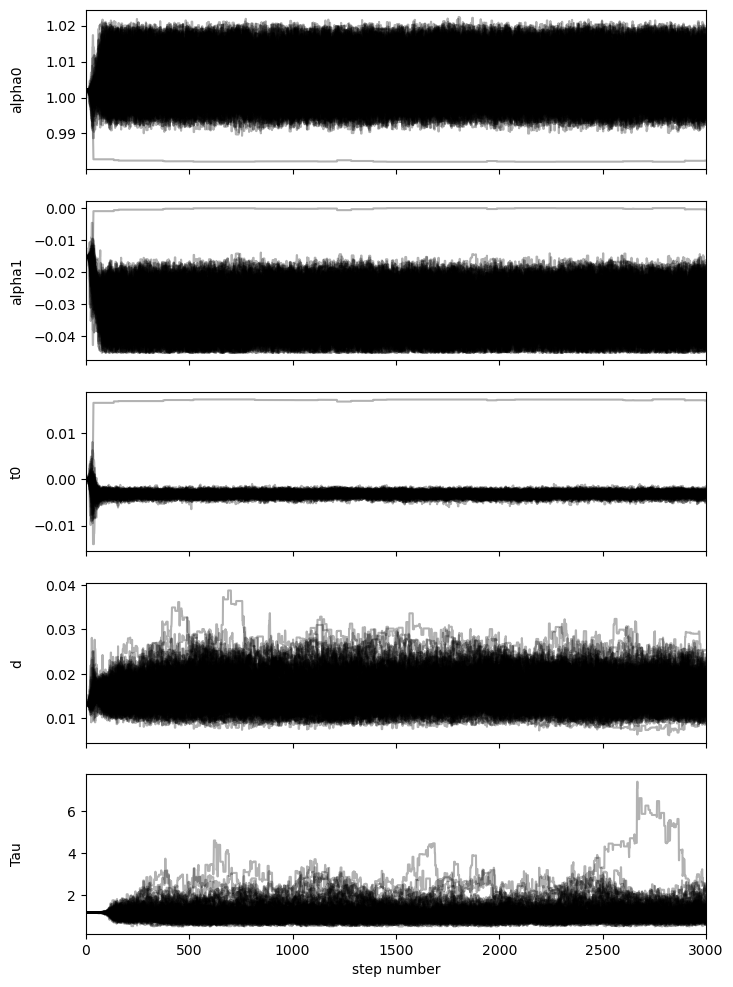

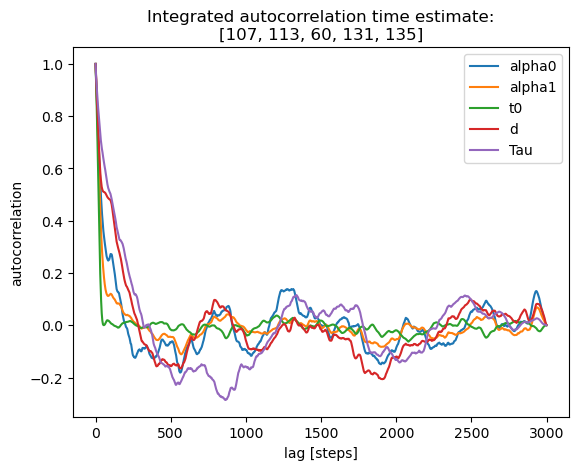

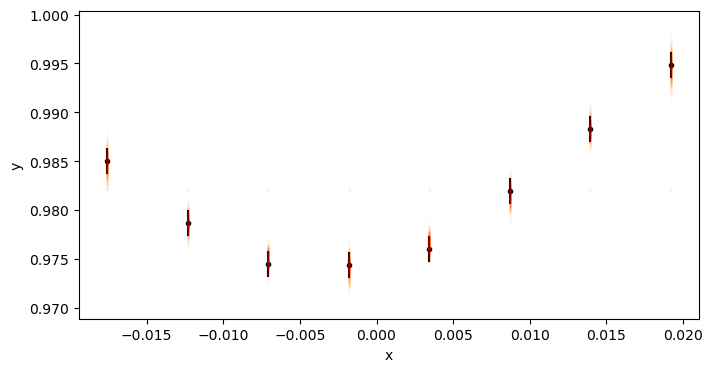

1 1686.6232586676524


100%|█████████████████████████████████████████████████████████| 3000/3000 [00:14<00:00, 213.22it/s]


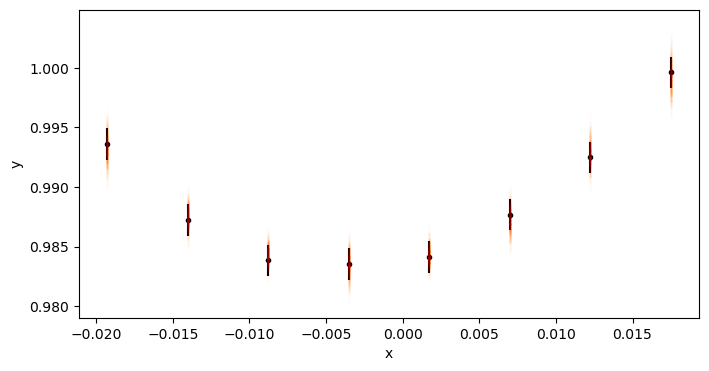

2 1690.5816788762354


100%|█████████████████████████████████████████████████████████| 3000/3000 [00:14<00:00, 210.14it/s]
The chain is shorter than 20 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/20 = 150;
tau: [126.27349677 132.04202566  71.53824621 152.87653531 153.33827888]


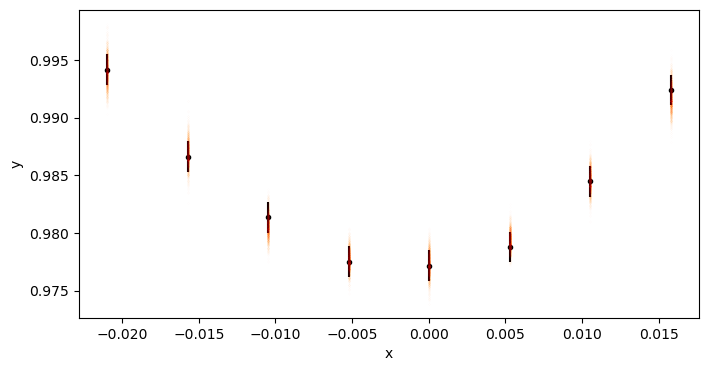

3 1694.5401007508672


100%|█████████████████████████████████████████████████████████| 3000/3000 [00:14<00:00, 208.97it/s]


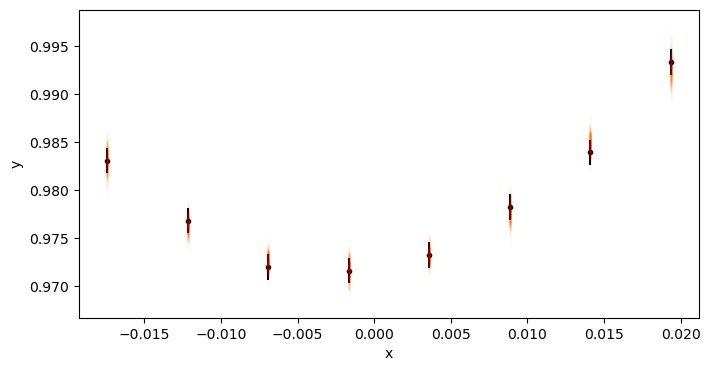

4 1698.519371210024


100%|█████████████████████████████████████████████████████████| 3000/3000 [00:13<00:00, 216.33it/s]


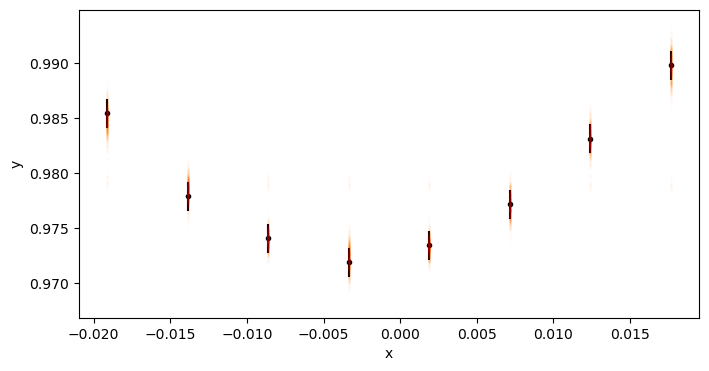

5 1702.4778233633328


100%|█████████████████████████████████████████████████████████| 3000/3000 [00:13<00:00, 219.33it/s]
The chain is shorter than 20 times the integrated autocorrelation time for 1 parameter(s). Use this estimate with caution and run a longer chain!
N/20 = 150;
tau: [125.55506652 142.67893443  57.52132347 147.19644186 156.6660294 ]


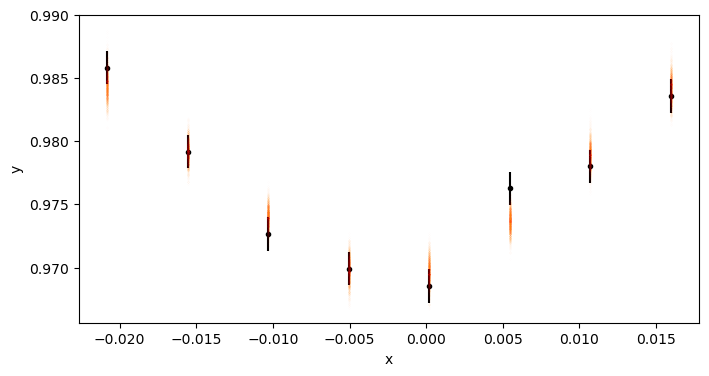

6 1706.4362757974163


100%|█████████████████████████████████████████████████████████| 3000/3000 [00:15<00:00, 199.68it/s]


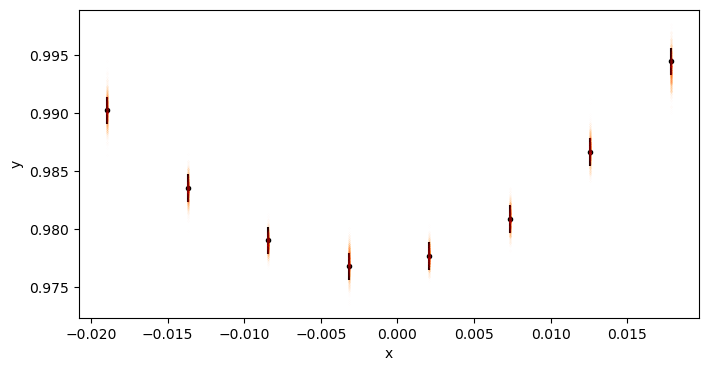

8 1714.3740387305486


100%|█████████████████████████████████████████████████████████| 3000/3000 [00:12<00:00, 245.59it/s]


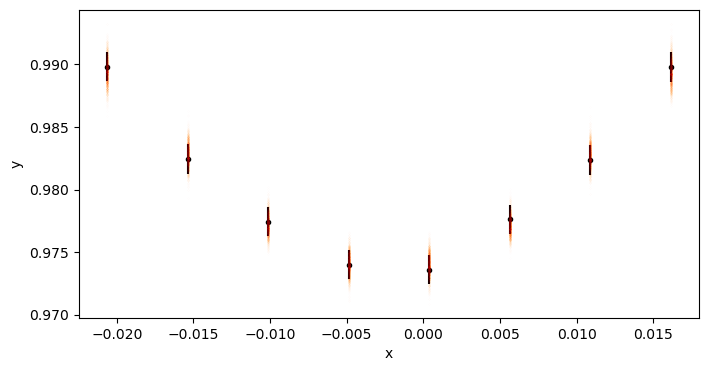

9 1718.332515821886


100%|█████████████████████████████████████████████████████████| 3000/3000 [00:12<00:00, 243.68it/s]


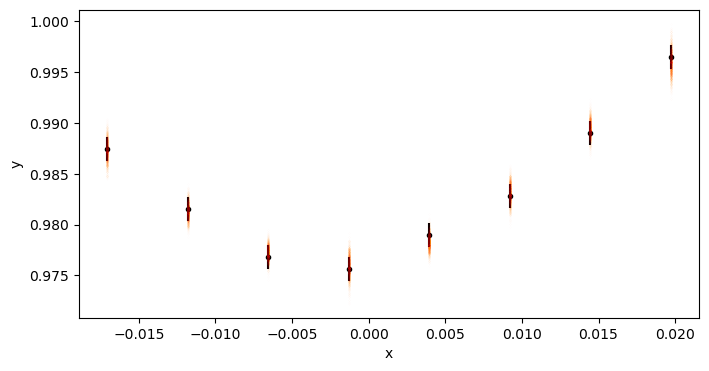

10 1722.3118245378896


100%|█████████████████████████████████████████████████████████| 3000/3000 [00:12<00:00, 248.93it/s]


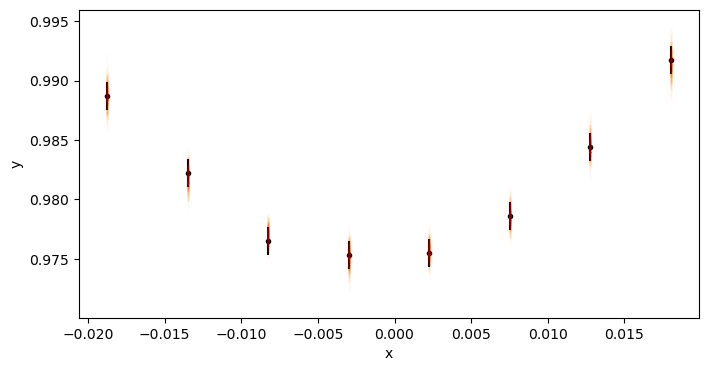

11 1726.2703109069962


100%|█████████████████████████████████████████████████████████| 3000/3000 [00:11<00:00, 255.42it/s]
The chain is shorter than 20 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/20 = 150;
tau: [135.76115311 137.63373896  70.41034144 159.84781793 158.76613302]


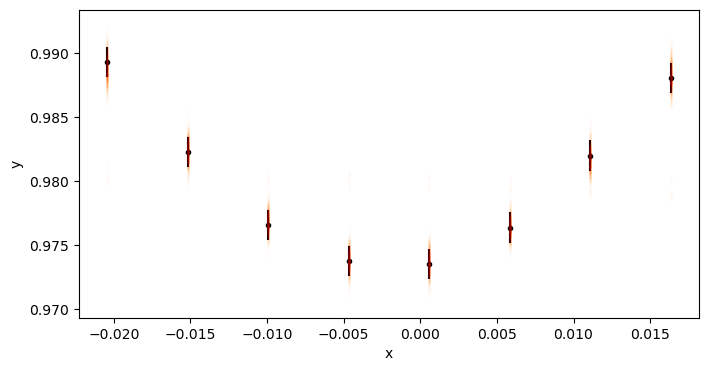

12 1730.2288075457877


100%|█████████████████████████████████████████████████████████| 3000/3000 [00:12<00:00, 246.95it/s]


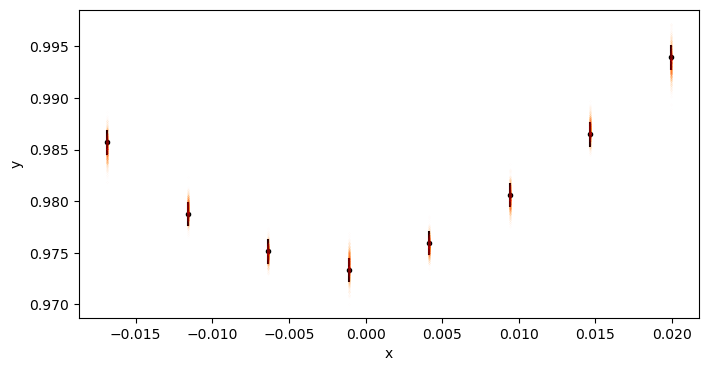

13 1734.2081337802836


100%|█████████████████████████████████████████████████████████| 3000/3000 [00:13<00:00, 226.05it/s]


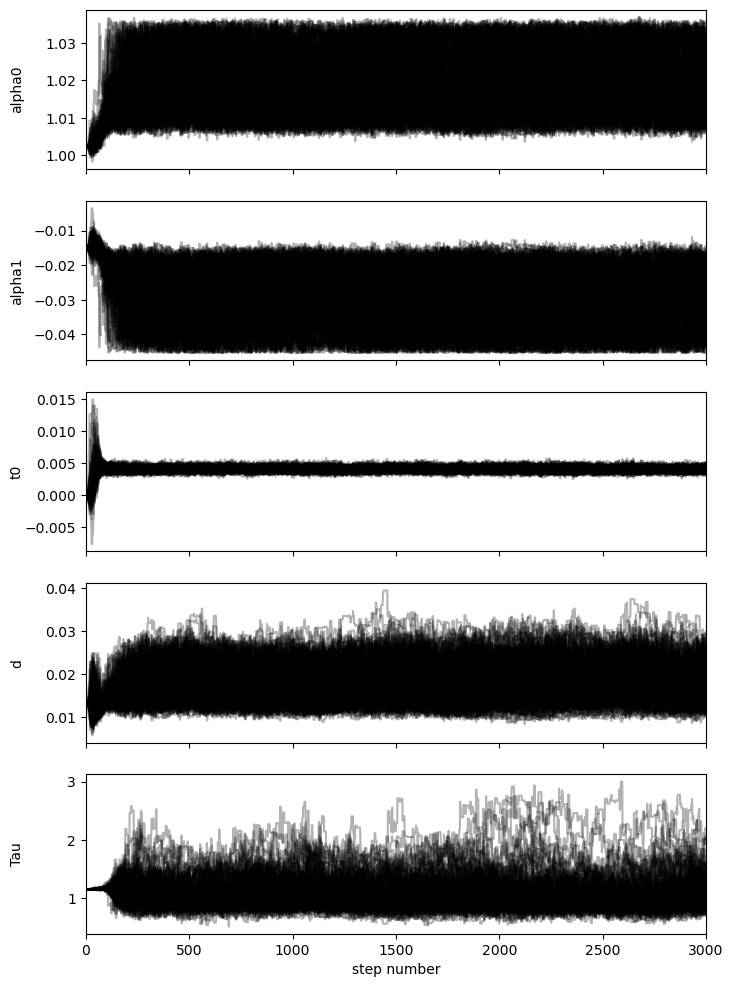

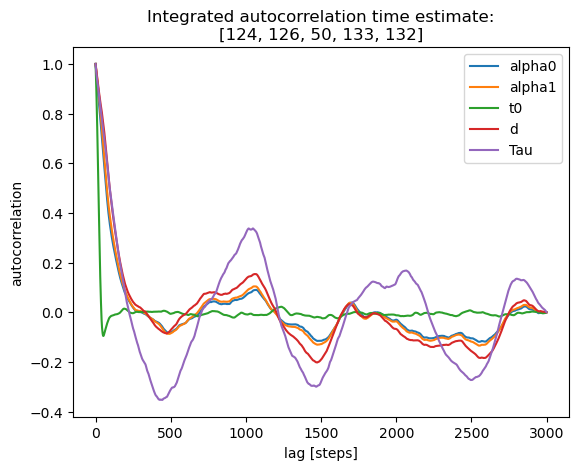

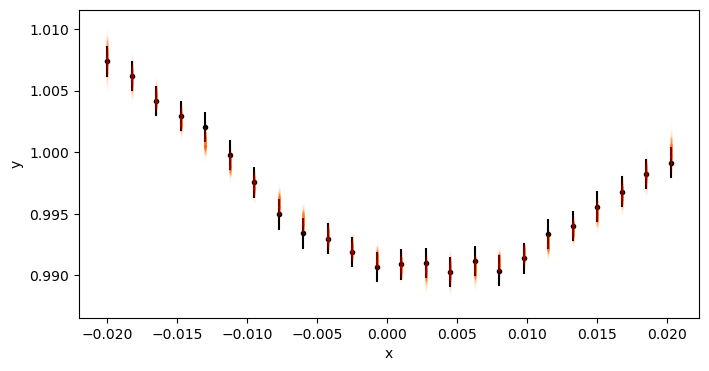

186 2420.1770555064027


100%|█████████████████████████████████████████████████████████| 3000/3000 [00:12<00:00, 234.16it/s]


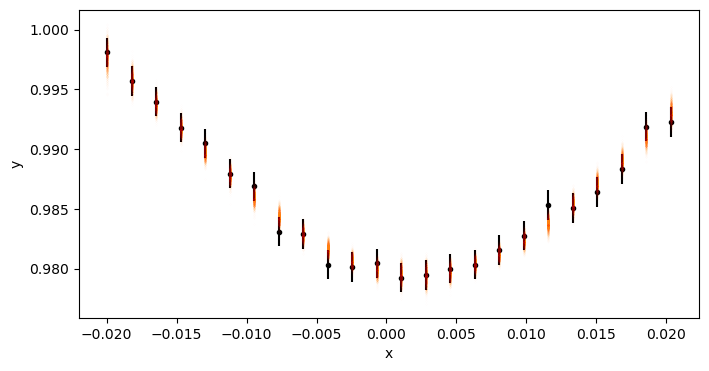

187 2424.1423748425627


100%|█████████████████████████████████████████████████████████| 3000/3000 [00:12<00:00, 232.80it/s]


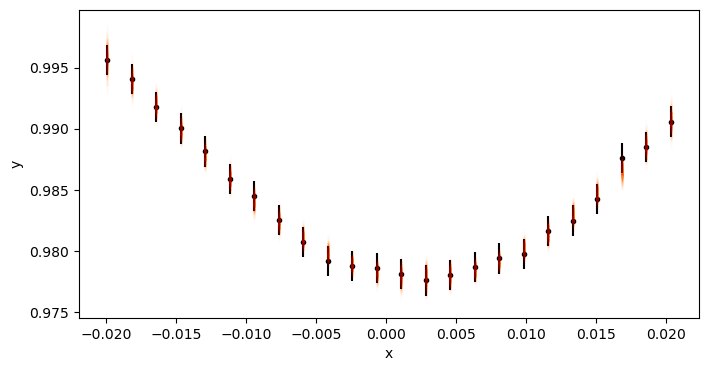

188 2428.1076875697217


100%|█████████████████████████████████████████████████████████| 3000/3000 [00:12<00:00, 241.37it/s]


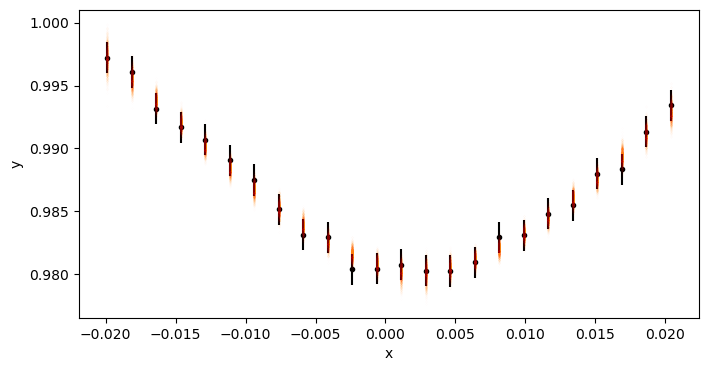

189 2432.0729953455716


100%|█████████████████████████████████████████████████████████| 3000/3000 [00:12<00:00, 239.21it/s]


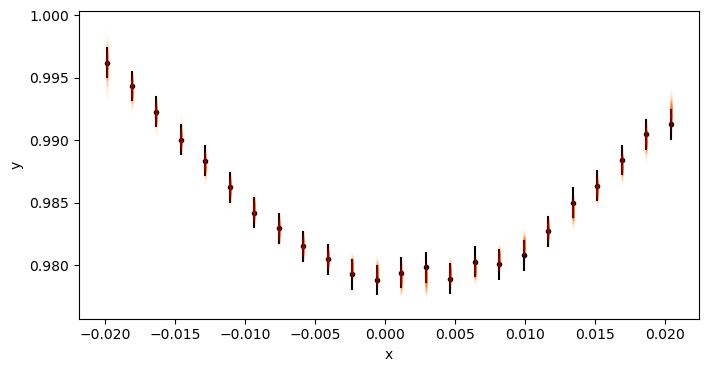

190 2436.0382753937297


100%|█████████████████████████████████████████████████████████| 3000/3000 [00:12<00:00, 241.00it/s]
The chain is shorter than 20 times the integrated autocorrelation time for 1 parameter(s). Use this estimate with caution and run a longer chain!
N/20 = 150;
tau: [133.21398746 135.96986479  68.01590947 148.12647121 155.67732623]


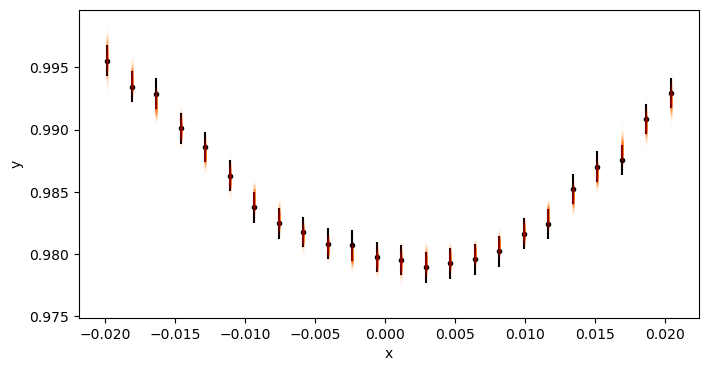

191 2440.0035372156926


100%|█████████████████████████████████████████████████████████| 3000/3000 [00:12<00:00, 235.23it/s]


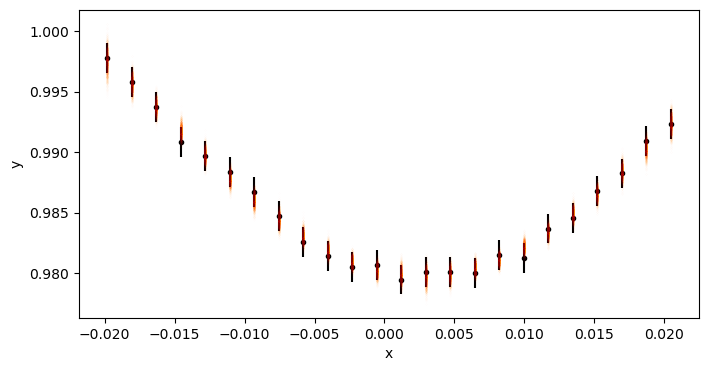

192 2443.9687923228453


100%|█████████████████████████████████████████████████████████| 3000/3000 [00:12<00:00, 233.32it/s]


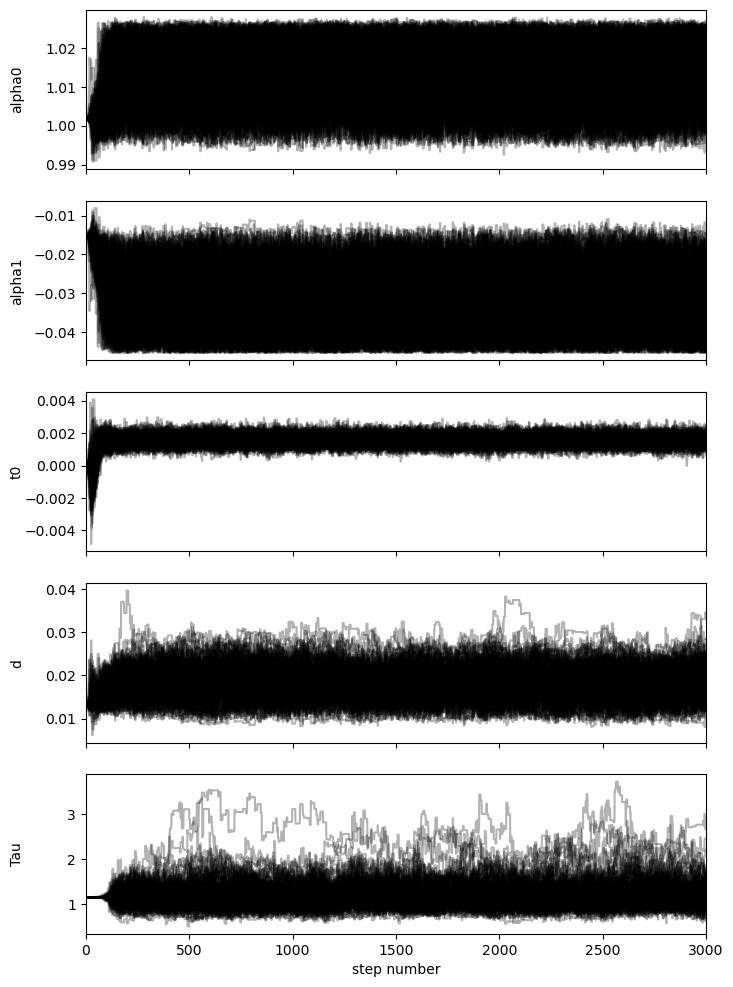

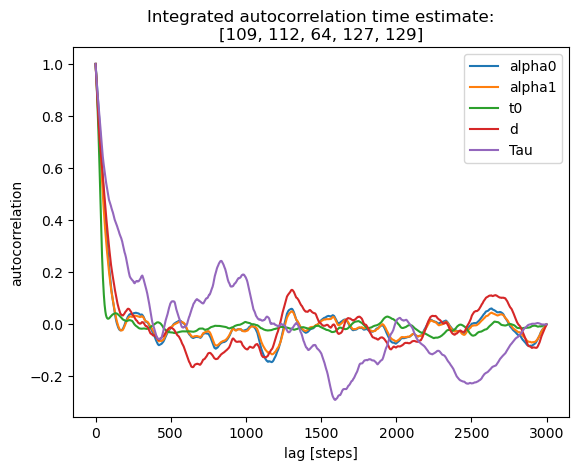

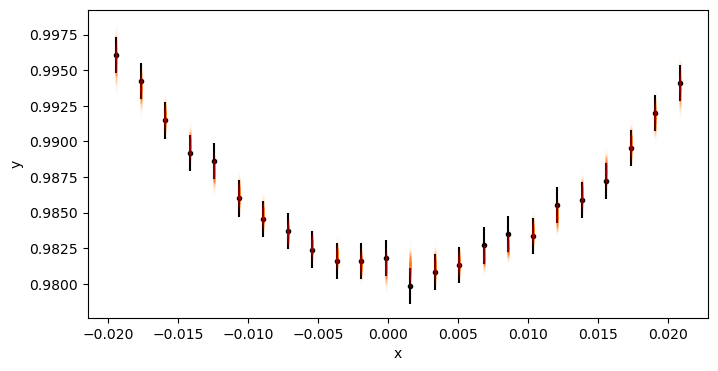

275 2773.0794180743846


100%|█████████████████████████████████████████████████████████| 3000/3000 [00:12<00:00, 242.92it/s]


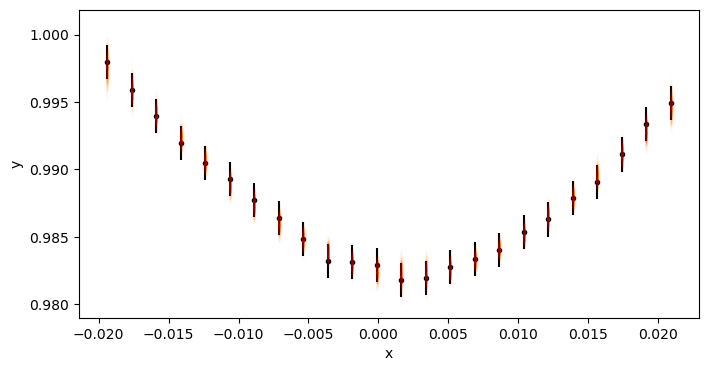

276 2777.0447885142844


100%|█████████████████████████████████████████████████████████| 3000/3000 [00:16<00:00, 180.63it/s]


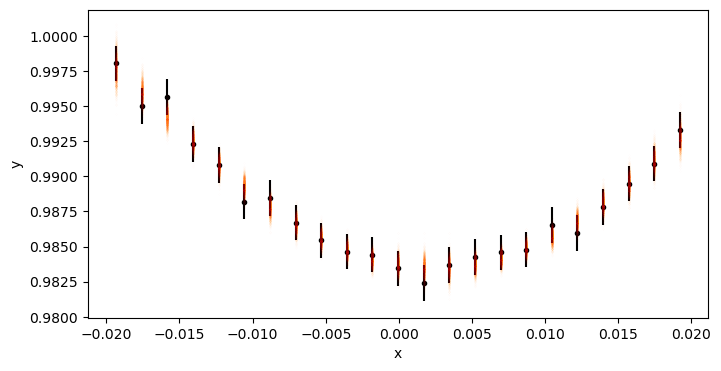

277 2781.006681733806


100%|█████████████████████████████████████████████████████████| 3000/3000 [00:14<00:00, 210.04it/s]


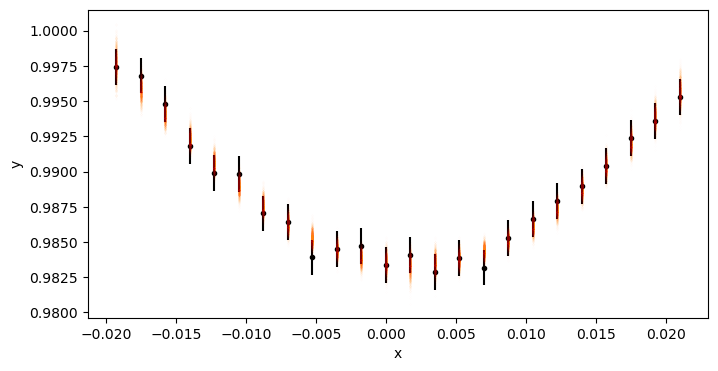

278 2784.975502894112


100%|█████████████████████████████████████████████████████████| 3000/3000 [00:13<00:00, 220.12it/s]


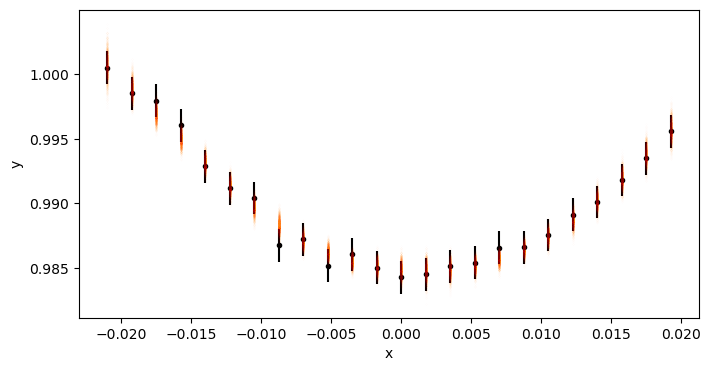

279 2788.9338819549944


100%|█████████████████████████████████████████████████████████| 3000/3000 [00:12<00:00, 238.19it/s]


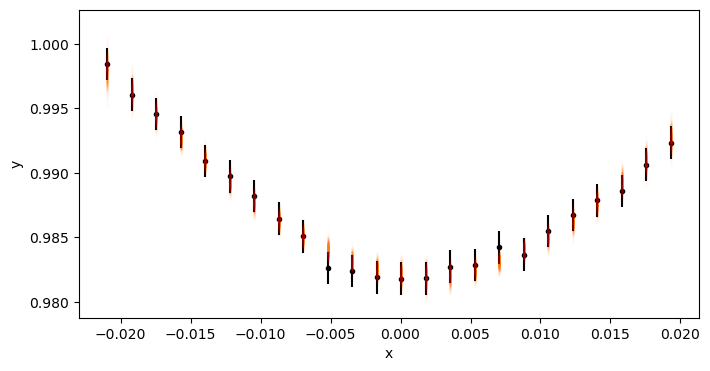

280 2792.899199213643


100%|█████████████████████████████████████████████████████████| 3000/3000 [00:12<00:00, 234.39it/s]


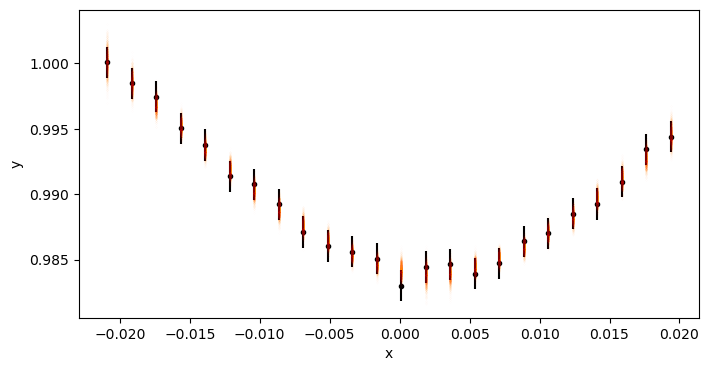

282 2800.829797411589


100%|█████████████████████████████████████████████████████████| 3000/3000 [00:12<00:00, 239.15it/s]


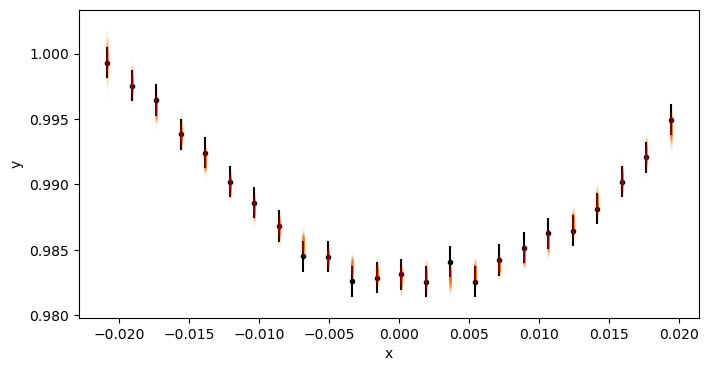

283 2804.7950645056335


100%|█████████████████████████████████████████████████████████| 3000/3000 [00:12<00:00, 241.51it/s]


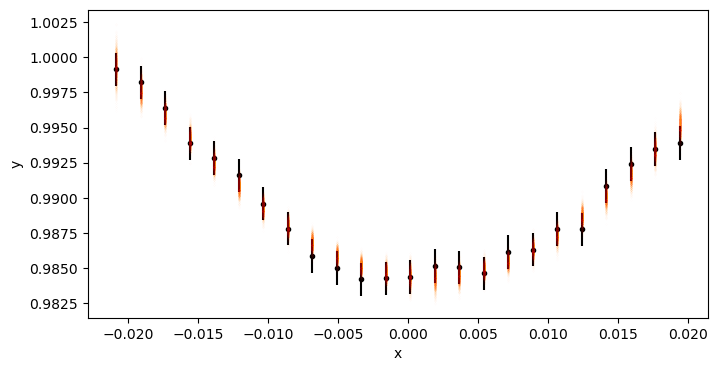

284 2808.760325579989


100%|█████████████████████████████████████████████████████████| 3000/3000 [00:12<00:00, 235.50it/s]


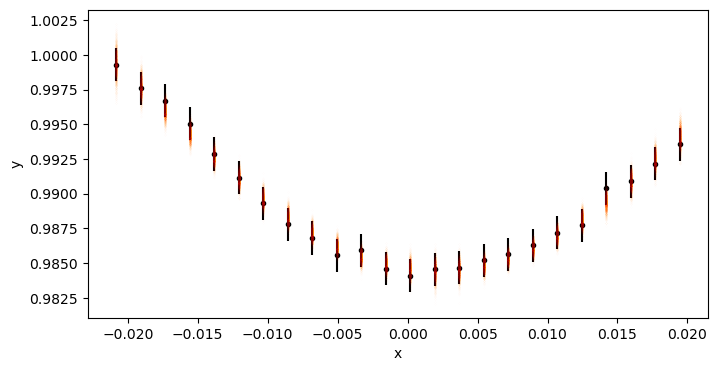

285 2812.7255660469295


100%|█████████████████████████████████████████████████████████| 3000/3000 [00:12<00:00, 237.42it/s]


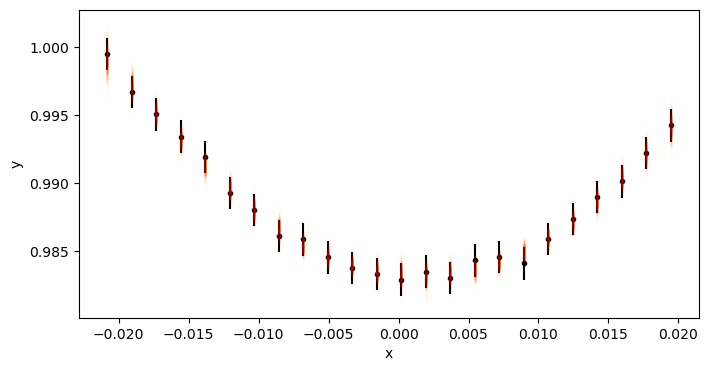

286 2816.6907823761126


100%|█████████████████████████████████████████████████████████| 3000/3000 [00:13<00:00, 227.63it/s]


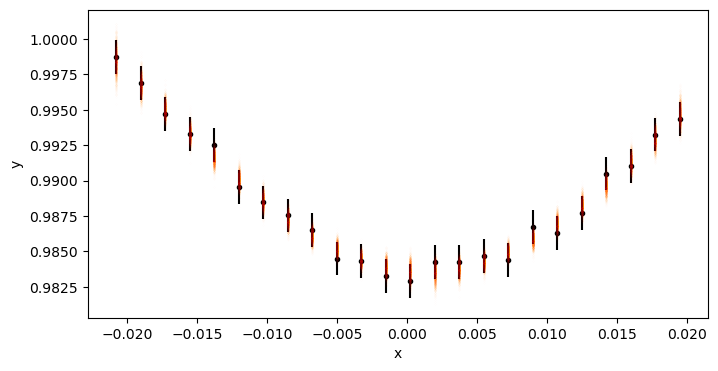

287 2820.6559919906335


100%|███████████████████████████████████████████████████████| 10000/10000 [00:40<00:00, 249.33it/s]


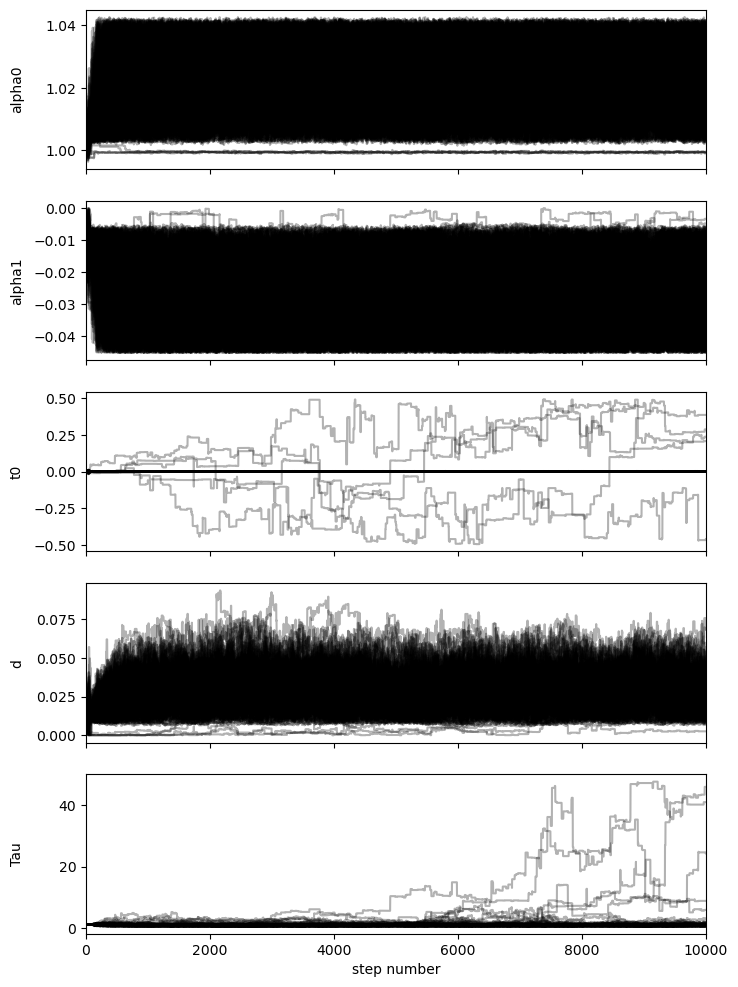

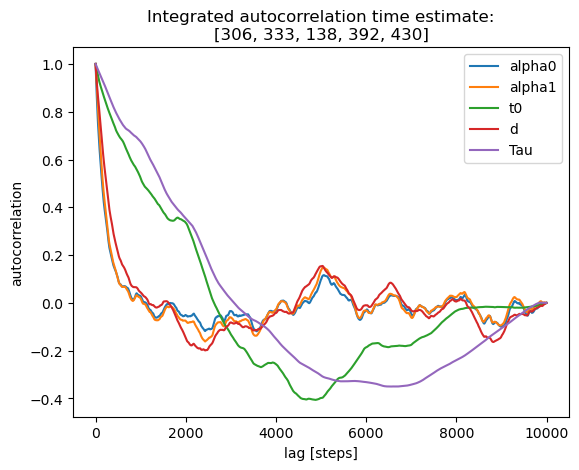

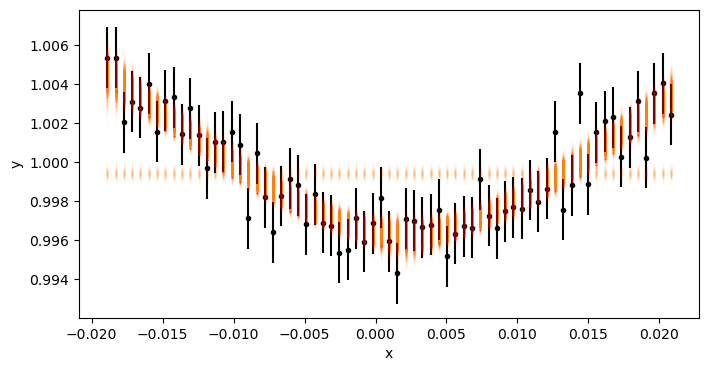

460 3506.636840645349


100%|███████████████████████████████████████████████████████| 10000/10000 [00:44<00:00, 226.64it/s]


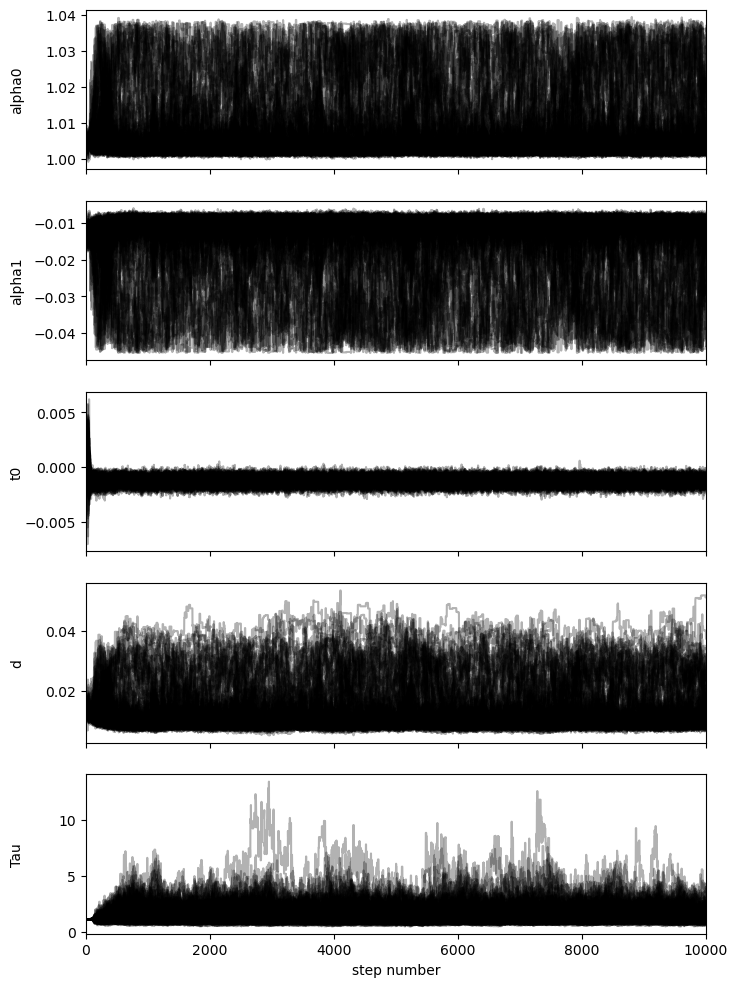

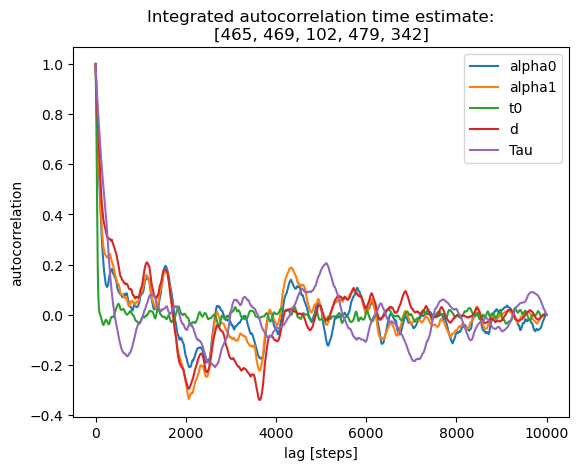

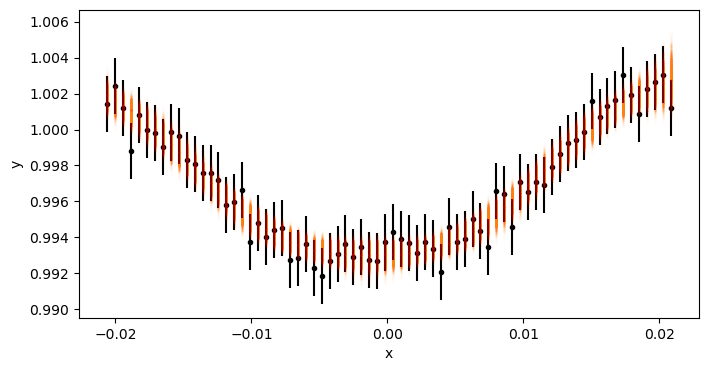

461 3510.5987306851184


100%|███████████████████████████████████████████████████████| 10000/10000 [00:41<00:00, 243.13it/s]


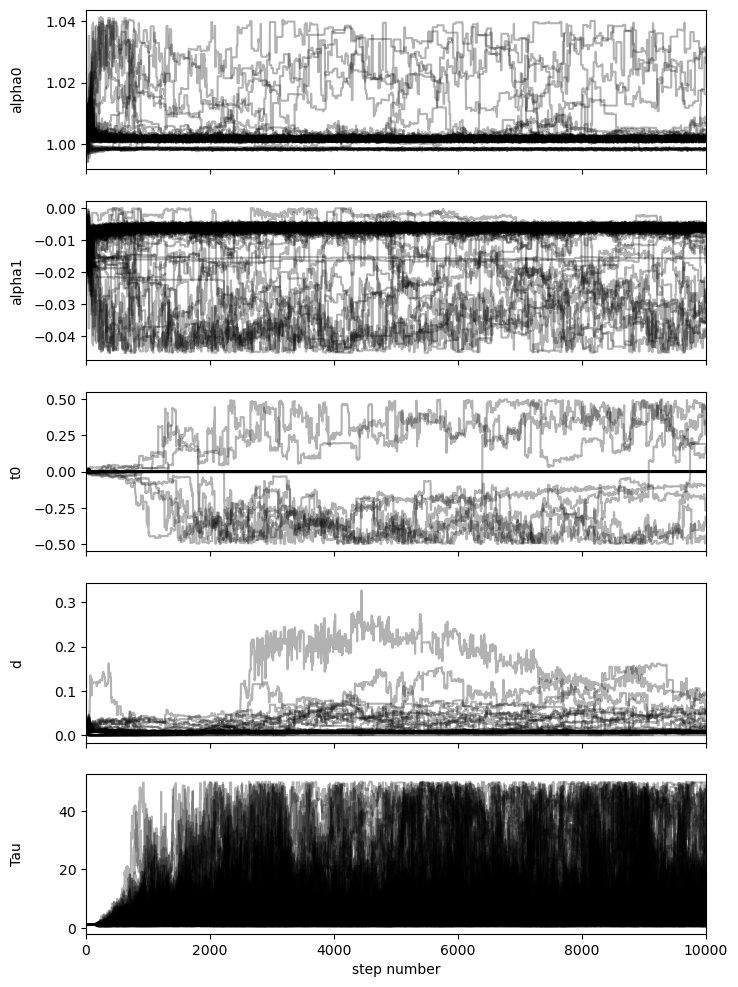

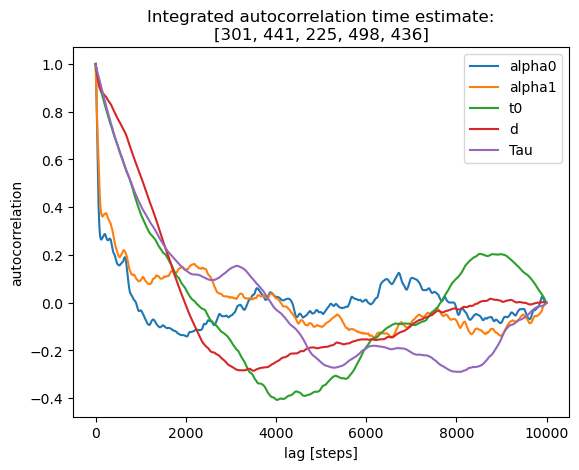

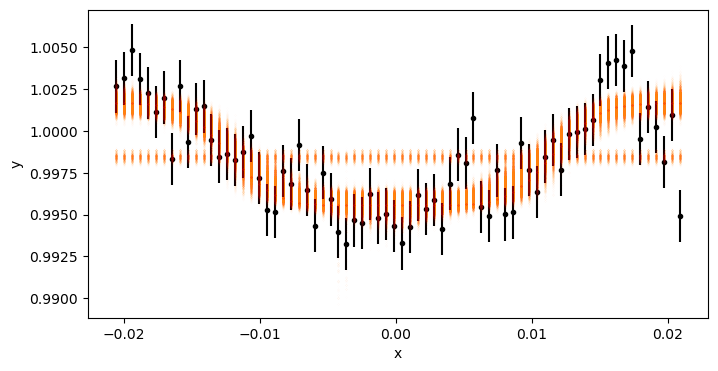

462 3514.564075770314


100%|███████████████████████████████████████████████████████| 10000/10000 [00:44<00:00, 224.65it/s]


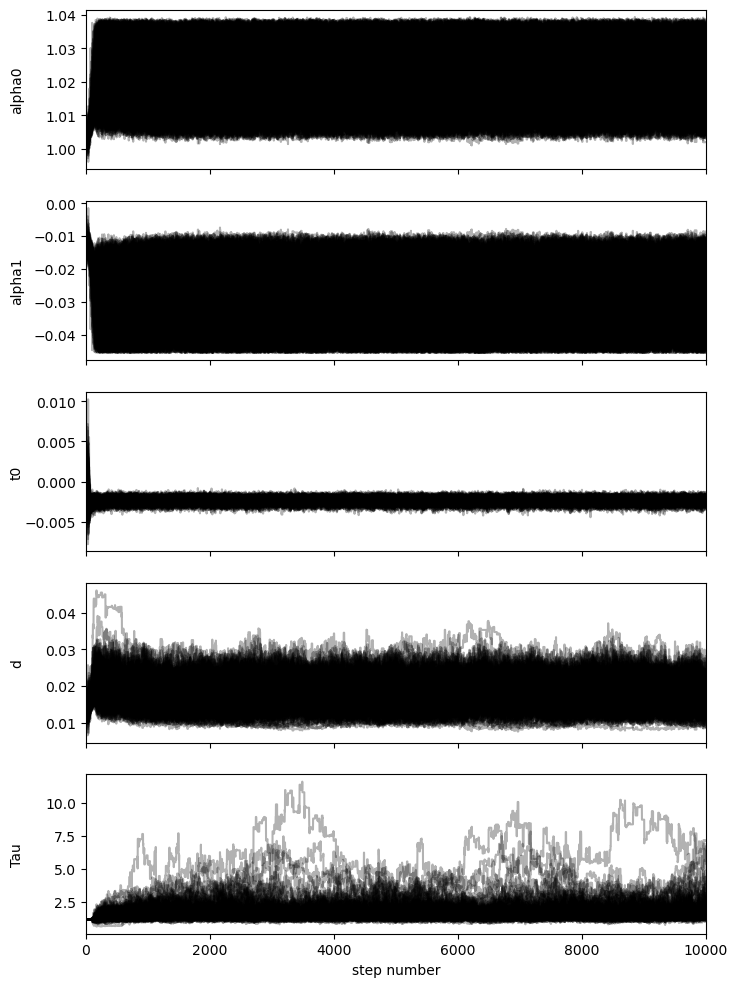

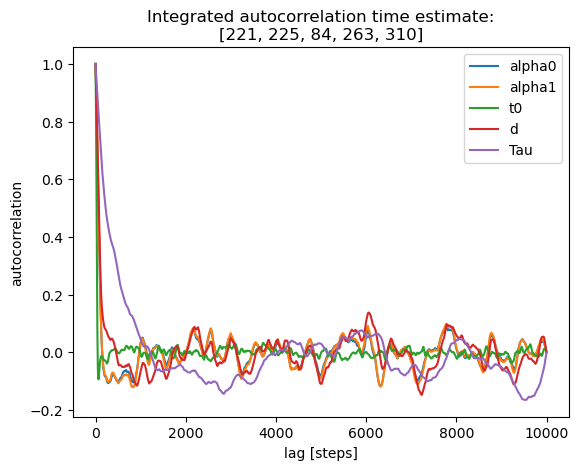

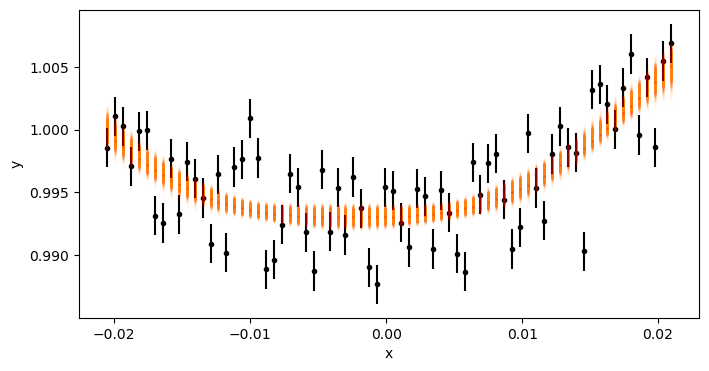

463 3518.529412604842


100%|███████████████████████████████████████████████████████| 10000/10000 [01:05<00:00, 152.49it/s]


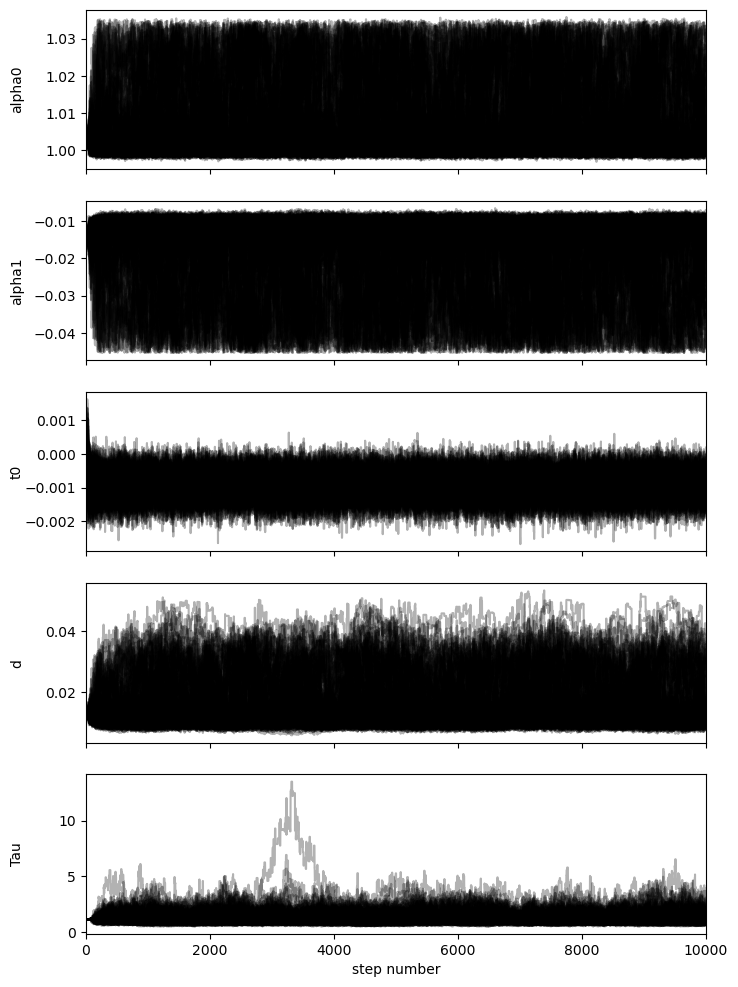

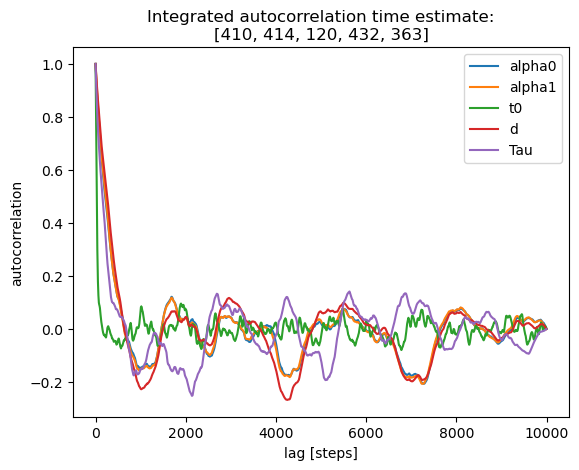

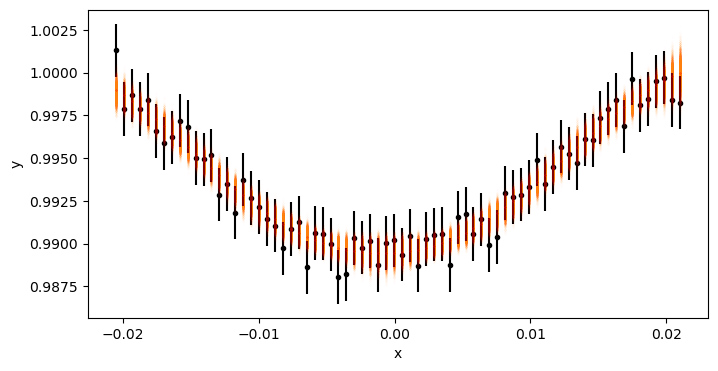

464 3522.494735652111


100%|███████████████████████████████████████████████████████| 10000/10000 [00:45<00:00, 218.24it/s]


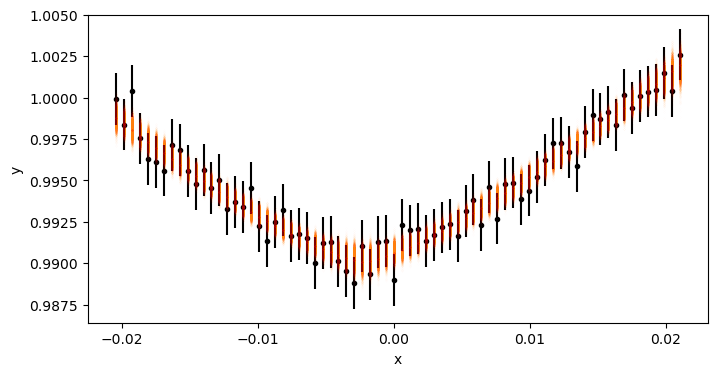

465 3526.4600352548982


100%|███████████████████████████████████████████████████████| 10000/10000 [00:46<00:00, 215.89it/s]


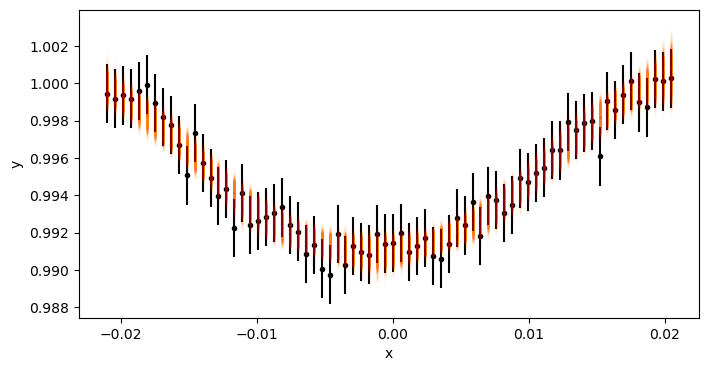

466 3530.4230084540072


100%|███████████████████████████████████████████████████████| 10000/10000 [00:48<00:00, 204.85it/s]


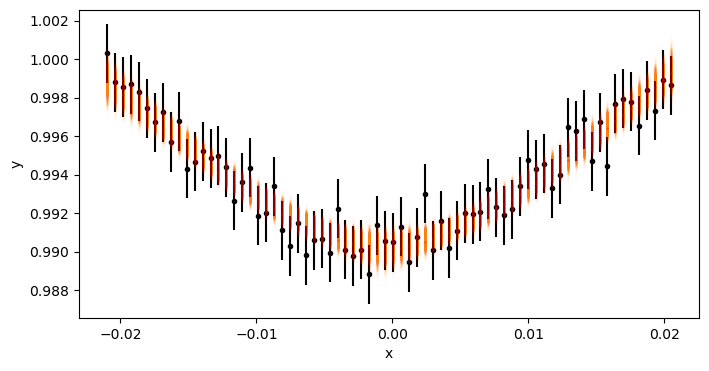

467 3534.388288106339


100%|███████████████████████████████████████████████████████| 10000/10000 [00:47<00:00, 210.56it/s]


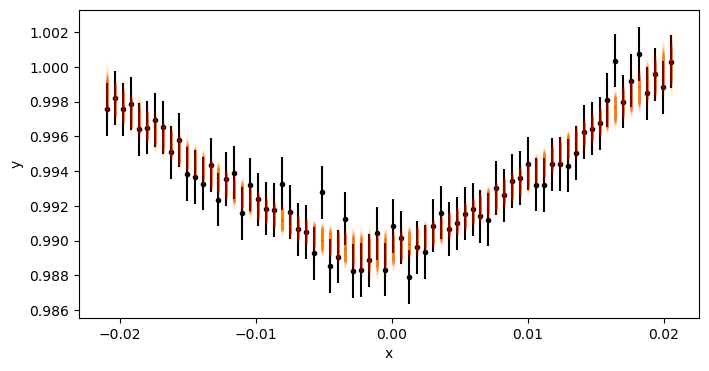

468 3538.3535415614374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:53<00:00, 185.85it/s]


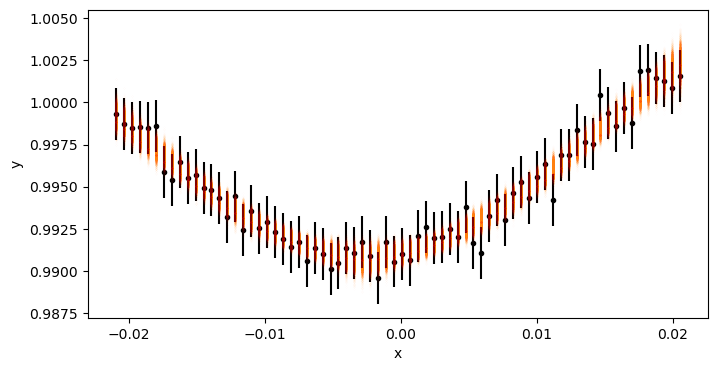

469 3542.3187817103812


100%|███████████████████████████████████████████████████████| 10000/10000 [00:42<00:00, 233.21it/s]


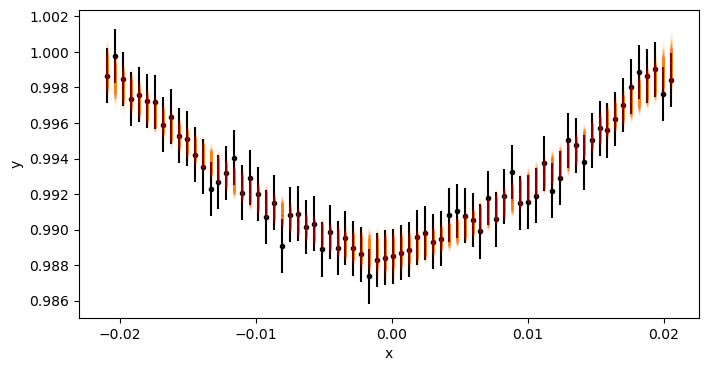

470 3546.2840151841187


100%|███████████████████████████████████████████████████████| 10000/10000 [00:43<00:00, 230.19it/s]


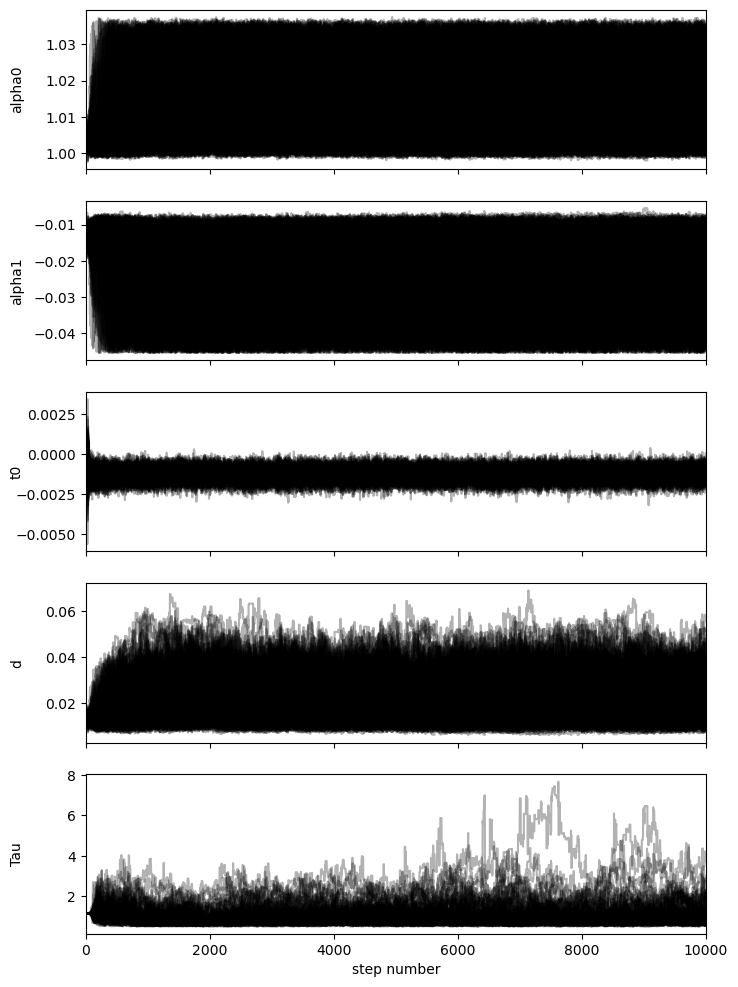

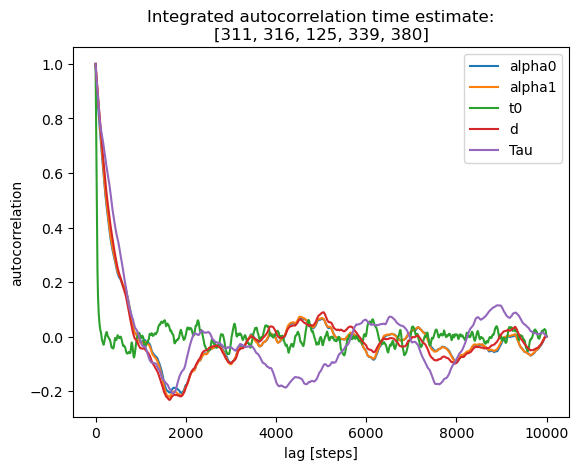

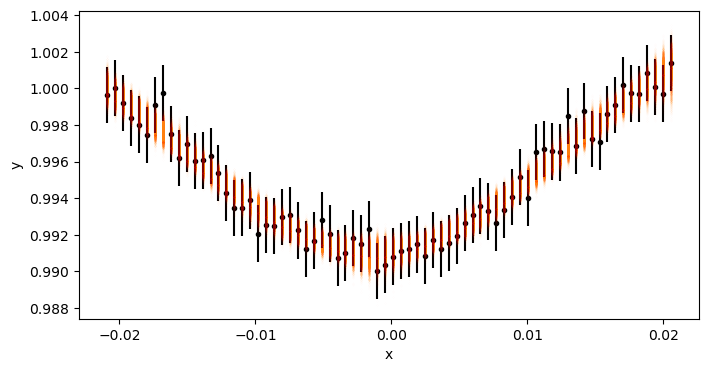

471 3550.249224752512


100%|███████████████████████████████████████████████████████| 10000/10000 [00:42<00:00, 235.14it/s]


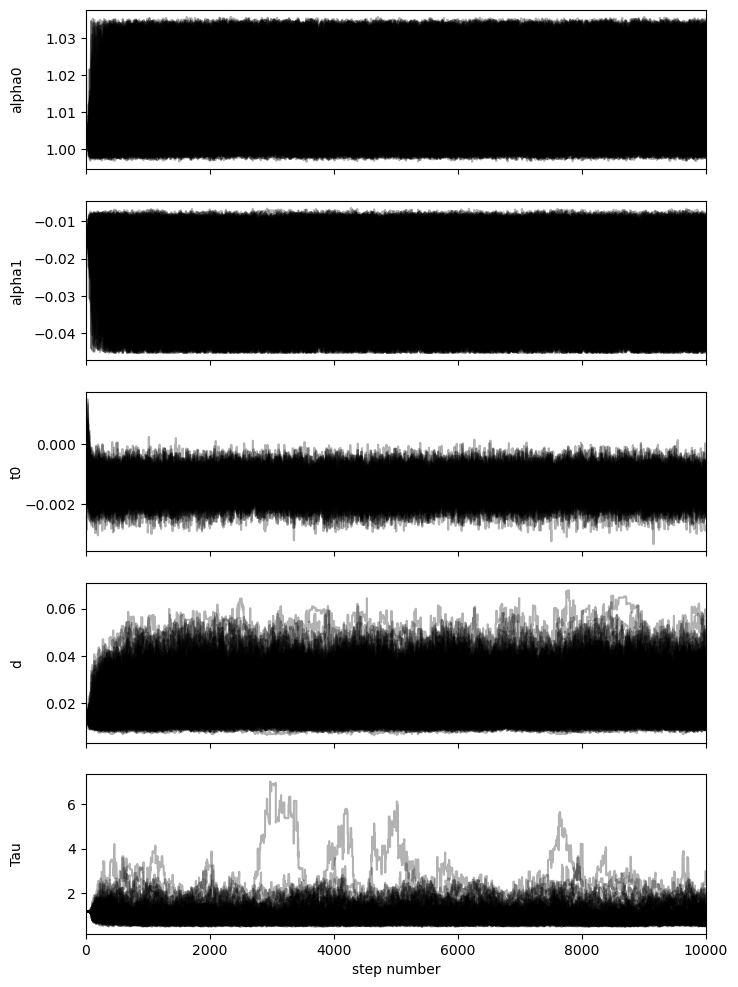

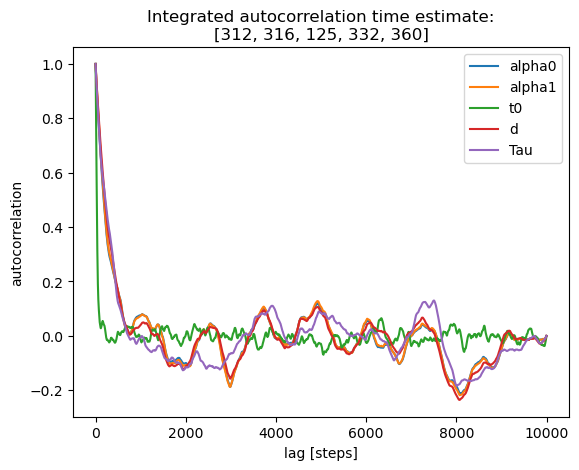

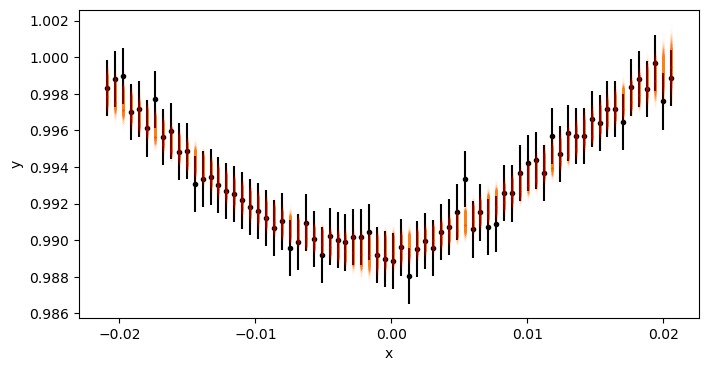

472 3554.214418491617


100%|███████████████████████████████████████████████████████| 10000/10000 [00:38<00:00, 259.02it/s]
The chain is shorter than 20 times the integrated autocorrelation time for 3 parameter(s). Use this estimate with caution and run a longer chain!
N/20 = 500;
tau: [388.54890389 375.78417117 818.00217524 527.11237768 878.96402224]


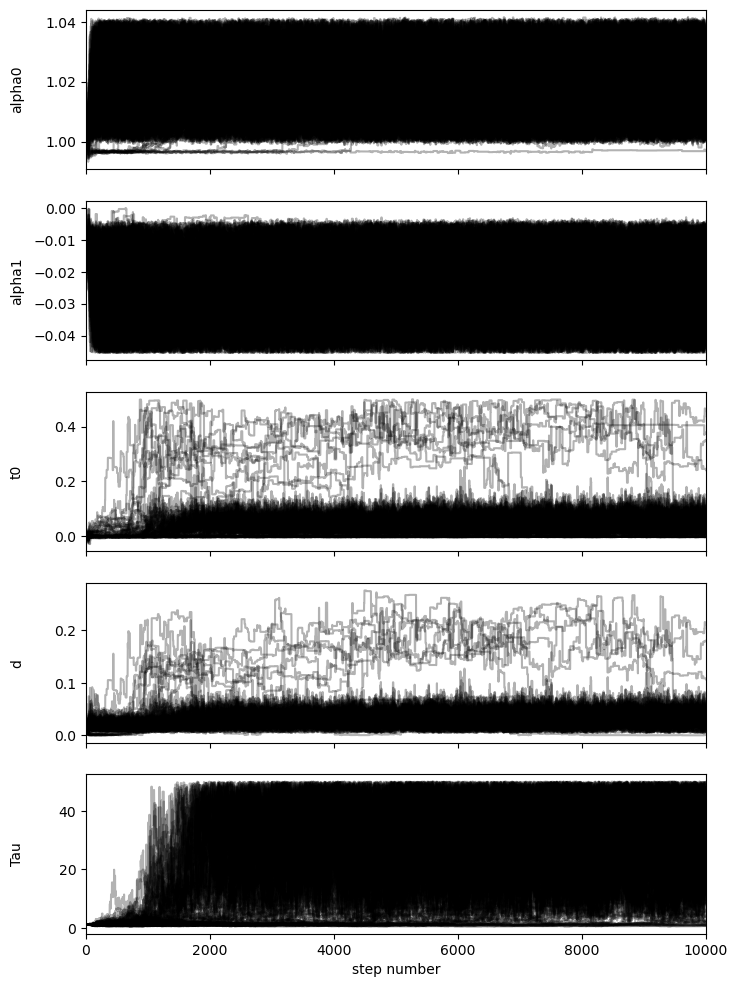

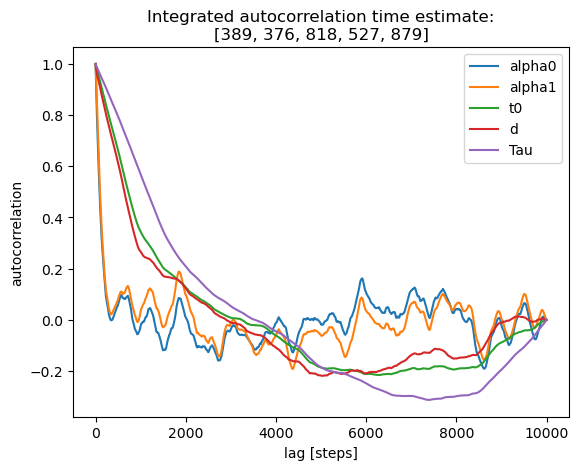

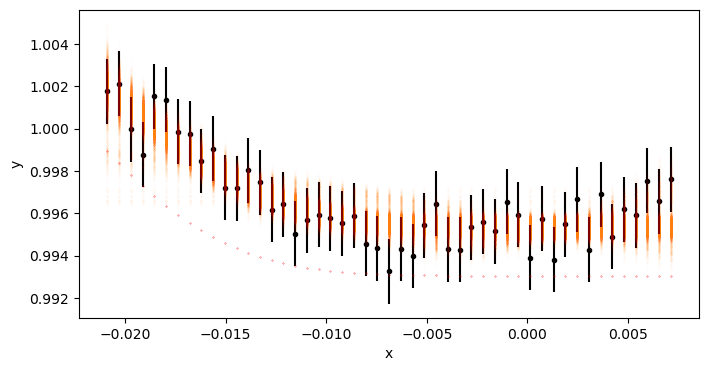

473 3558.1529843668295
number,epoch,mean_alpha0,mean_alpha1,t0,stdv_t0,mean_d,mean_Tau
1,1686.6232586676524,1.0048693949579544,-0.031108987084898405,-0.0031412488964034594,0.0018713447465275974,0.016207786221669764,1.0197445676079004
2,1690.5816788762354,1.011610402038775,-0.028262072908416154,-0.003367915245670093,0.0006115493471330869,0.015646557842365964,1.2971863150257932
3,1694.5401007508672,1.0070139205602255,-0.029951260320953944,-0.0017326846006584457,0.00046735144254855365,0.014705759409085584,1.2325575872292174
4,1698.519371210024,1.0067043646279297,-0.035108487638282386,-0.0022400527367208707,0.0005100491571925372,0.015940652271533025,1.1879379741876348
5,1702.4778233633328,1.0018731043907159,-0.02971336561805562,-0.002645797808456372,0.04335123017834835,0.015839793513233995,1.1007920552194101
6,1706.4362757974163,1.0009069418472691,-0.03246708063919058,-0.00227407318248697,0.0005358511479498668,0.019679879166150667,0.7065273069113063
8,1714.3740387305486,1.0094732786835814,

In [44]:

_lc_data_f = lc_data.fold(epoch_time=t0_secondary, period=period_s, normalize_phase=True)

c_etv_out_str_s = "number,epoch,mean_alpha0,mean_alpha1,t0,stdv_t0,mean_d,mean_Tau\n"

for c in np.unique(_lc_data_f.cycle):
    lc_f = _lc_data_f[_lc_data_f.cycle == c]
    lc_f = lc_f.truncate(-window_width_s / 2, window_width_s / 2)
    if len(lc_f) < 1:
        continue
    if len(lc_f) < 8:
        print(f"Skipped cycle {c} due to insuffient data points {len(lc_f)}")
        continue

    # if True:
    #     ax = lc_f.scatter(label=f"C.{c}");  # for diagnostics
    #     continue

    verbose_cycles = [1, 186, 275, 460, 461, 462, 463, 464, 471, 472, 473]  # the first cycle of sectors 14,  41,  54,  81, and more in sector 81 / 82 (fitting probelmatic)

    # if c not in verbose_cycles:  # for trying a few cycles
    #     continue

    plot_chains, plot_autocorrelation = False, False
    if c in verbose_cycles:  # show MCMC details for selected cycles
        plot_chains, plot_autocorrelation = True, True  

    # convert lc to the form needed by fit etv_functions
    lc_f_data = SimpleNamespace(time=lc_f.time_original.value, phase=lc_f.time.value, flux=np.array(lc_f.flux.value), err=np.array(lc_f.flux_err.value))

    nruns, discard = 3000, 1000
    if c >= 460: 
        # the fit doesn't look too good starting from sector 81 (the shallowest dips)
        # make it run longer to compensate it
        # I might need tailored start values for them to really fix it.
        nruns, discard = 10000, 5000
    
    start_vals = [mean_alpha0_s, mean_alpha1_s, 0, mean_d_s, mean_Tau_s]  # mean_t0 is not helpful at all

    start_vals_dict_s = dict(alpha0=mean_alpha0_s, alpha1=mean_alpha1_s, t0=0, d=mean_d_s, Tau=mean_Tau_s)
    _alpha0, _alpha1, _t0, _d, _Tau, _fit_params_stats = etv_functions.run_mcmc_initial_fit_of_model(
        custom_log_probability, etv_functions.coshgauss_model_fit,
        lc_f_data, start_vals_dict_s, 
        # nruns=40, discard=6, 
        nruns=nruns, discard=discard, 
        autocorr_time_kwargs=dict(tol=20), pool=None, plot_chains=plot_chains,  plot_autocorrelation=plot_autocorrelation, plot=True, also_return_stats=True)
        
    # _alpha0, _alpha1, _t0, _d, _Tau, _fit_params_stats = etv_functions.run_mcmc_initial_fit(
    #     lc_f_data, start_vals, 
    #     # nruns=40, discard=6, 
    #     nruns=3000, discard=1000, 
    #     autocorr_time_kwargs=dict(tol=20), pool=-2, plot_chains=plot_chains,  plot_autocorrelation=plot_autocorrelation, plot=True, also_return_stats=True)

    _stdv_t0 = _fit_params_stats["std_t0"]
    _t = np.mean(lc_f.time_original.value)  # approximate transit time 
    print(c, _t)
    
    c_etv_out_str_s += ",".join([str(s) for s in [c, _t, _alpha0, _alpha1, _t0, _stdv_t0, _d, _Tau]])
    c_etv_out_str_s += "\n"
    
print(c_etv_out_str_s)

In [ ]:
# # save the result in a cell for safekeeping
# c_etv_out_str_s = """
# number,epoch,mean_alpha0,mean_alpha1,t0,stdv_t0,mean_d,mean_Tau
# 1,1686.6232586676524,1.0048693949579544,-0.031108987084898405,-0.0031412488964034594,0.0018713447465275974,0.016207786221669764,1.0197445676079004
# 2,1690.5816788762354,1.011610402038775,-0.028262072908416154,-0.003367915245670093,0.0006115493471330869,0.015646557842365964,1.2971863150257932
# 3,1694.5401007508672,1.0070139205602255,-0.029951260320953944,-0.0017326846006584457,0.00046735144254855365,0.014705759409085584,1.2325575872292174
# 4,1698.519371210024,1.0067043646279297,-0.035108487638282386,-0.0022400527367208707,0.0005100491571925372,0.015940652271533025,1.1879379741876348
# 5,1702.4778233633328,1.0018731043907159,-0.02971336561805562,-0.002645797808456372,0.04335123017834835,0.015839793513233995,1.1007920552194101
# 6,1706.4362757974163,1.0009069418472691,-0.03246708063919058,-0.00227407318248697,0.0005358511479498668,0.019679879166150667,0.7065273069113063
# 8,1714.3740387305486,1.0094732786835814,-0.032494084557092795,-0.0019155985156151286,0.00043115270717977684,0.015964236588759104,1.184098626229893
# 9,1718.332515821886,1.0057435630080236,-0.032353633651958216,-0.002193383650867293,0.00042499416316213863,0.01655759658509635,1.0066263699379885
# 10,1722.3118245378896,1.0104795186755093,-0.034866474089725236,-0.0021421880509448375,0.0004924954201104577,0.018094171517784273,0.927114311335522
# 11,1726.2703109069962,1.0042390037501097,-0.029217172442726383,-0.0014091076568171468,0.00043543262386746943,0.01489813977994232,1.2421526086780865
# 12,1730.2288075457877,1.0021553472796396,-0.028909927555881856,-0.0017592250385737185,0.004332343897911843,0.01572384379994999,1.076647078629672
# 13,1734.2081337802836,1.007326361928028,-0.03369581376741785,-0.0016746022462675884,0.00047506485359010683,0.017142498812675912,1.0052293546295243
# 186,2420.1770555064027,1.0178949903016306,-0.027624751863875325,0.004076179334597171,0.0003854244565729958,0.018218627033336526,1.01331952806356
# 187,2424.1423748425627,1.01188148654423,-0.03251005909855512,0.002251727963629129,0.00029805146804296964,0.01854680004008765,0.9625590753195103
# 188,2428.1076875697217,1.0065741220422593,-0.028836970051749435,0.0025458652967119827,0.00031593224920718825,0.016853348609009257,1.062475316840895
# 189,2432.0729953455716,1.0113075570968657,-0.0313726743740216,0.0024324490969127952,0.00033077492484003766,0.01991217441725126,0.869964974451414
# 190,2436.0382753937297,1.0076392938090732,-0.028632981644901932,0.0020612829680627534,0.0003093171592848564,0.0167069279232571,1.10316904661945
# 191,2440.0035372156926,1.004574485440875,-0.025327688673004393,0.001932631725566381,0.0003137062892100859,0.01531840050126473,1.1604098167338566
# 192,2443.9687923228453,1.011031654462749,-0.03131617107502098,0.002691452746319666,0.0003173387862054416,0.018367699748915577,1.0057150197857585
# 275,2773.0794180743846,1.0132420366115107,-0.03217783316598351,0.0015711367436820082,0.00032945931097293804,0.018481245532565076,1.1619700909632353
# 276,2777.0447885142844,1.0137205754533114,-0.03163645623140687,0.002229407118471201,0.0003486567598346279,0.020130743769884524,0.938174568475262
# 277,2781.006681733806,1.0145508086194643,-0.031178968813774396,0.0024021495453463047,0.0004154031404191522,0.020112988433259708,1.0365645358077296
# 278,2784.975502894112,1.0121271843011401,-0.02881967837608973,0.001855152140330661,0.0003556815237180718,0.018514369237047374,1.065578024399862
# 279,2788.9338819549944,1.0130375414789632,-0.028305078515384646,0.0014864889762425011,0.00035178654624414425,0.017579128484464267,1.1601720296646874
# 280,2792.899199213643,1.0136087450072564,-0.03173873078644398,0.0018626729642848535,0.00037651130438858893,0.020510334054578777,0.9679252137046643
# 282,2800.829797411589,1.014372616550994,-0.03057892866977717,0.0022531509887667826,0.00037288311167452717,0.02066327678661141,0.9105260546396082
# 283,2804.7950645056335,1.0089245574187662,-0.026160611882238494,0.0017226316588474832,0.00032173657421591097,0.016120446940415926,1.1673779434974452
# 284,2808.760325579989,1.010875233149529,-0.026592209088208286,0.001468233715808205,0.0003478408767932108,0.017927608675182078,1.0689618261091627
# 285,2812.7255660469295,1.013946346704158,-0.02955445014374016,0.002064330294167002,0.0003841701062187558,0.02002772208819798,1.0364135533535124
# 286,2816.6907823761126,1.014356309141283,-0.031138757531499604,0.0015415253087077041,0.00033821123314882364,0.018616537889476453,1.14187102487707
# 287,2820.6559919906335,1.014078700148531,-0.03059297854589115,0.0012836427059645466,0.00035462966803729917,0.020230489377583948,0.9831919180234299
# 460,3506.636840645349,1.0215648451948898,-0.02600308351169634,0.0020611498885587274,0.059819857873805955,0.028223804433796948,0.8148304541308711
# 461,3510.5987306851184,1.0032044156887083,-0.010159585451214833,-0.001245055369492513,0.0003669010864648069,0.010178869333649969,1.4548172942855282
# 462,3514.564075770314,1.0016651738235436,-0.006075853662555355,-0.0003099268963776517,0.09036118856677398,0.006861951687630029,4.383909757867806
# 463,3518.529412604842,1.0199697618276813,-0.02693474878424822,-0.002389809856949682,0.0003684118131920988,0.018511573550290768,1.5542628404245773
# 464,3522.494735652111,1.0014131650293172,-0.011948046119471568,-0.0009138072013603216,0.00036103793332805154,0.011842697373552875,1.130178596406029
# 465,3526.4600352548982,1.0214128355843064,-0.031313905915170887,-0.0022571956061124545,0.0003896980194269229,0.031848135456441995,0.6878528278807338
# 466,3530.4230084540072,1.0022759180585243,-0.011356039912207842,-0.001357824237960817,0.00038740285991486773,0.012018626886816,1.1120207991350166
# 467,3534.388288106339,1.0180147942577302,-0.02791743564013594,-0.0005795817531523003,0.00040980339063355825,0.02814265566888306,0.8107822351190658
# 468,3538.3535415614374,1.0210618575756412,-0.03185312799884899,-0.0015679142946639338,0.0003611248560323843,0.03019431281339336,0.7416007930299522
# 469,3542.3187817103812,1.0152234060007808,-0.024570442423746314,-0.0025508340722307753,0.0003707119385124377,0.02281090878357863,0.8870121829806712
# 470,3546.2840151841187,1.0197935799196782,-0.031194929168589732,-0.0004639391008261058,0.0003405781893994764,0.02706182669791001,0.8138463024858893
# 471,3550.249224752512,1.0118651984457827,-0.021112034049130868,-0.001266414175552454,0.00037007422801340635,0.021648228962384643,0.8324271675424337
# 472,3554.214418491617,1.0116310732261329,-0.02243841145308411,-0.0013924904339361844,0.00038671249709116743,0.022731539167745715,0.8411577243488748
# 473,3558.1529843668295,1.0162570038662797,-0.023217403640549972,0.04056302181452045,0.0818511128554625,0.03024403880514528,23.631497041529702
# """

## ETV O-C plot (Per-sector)

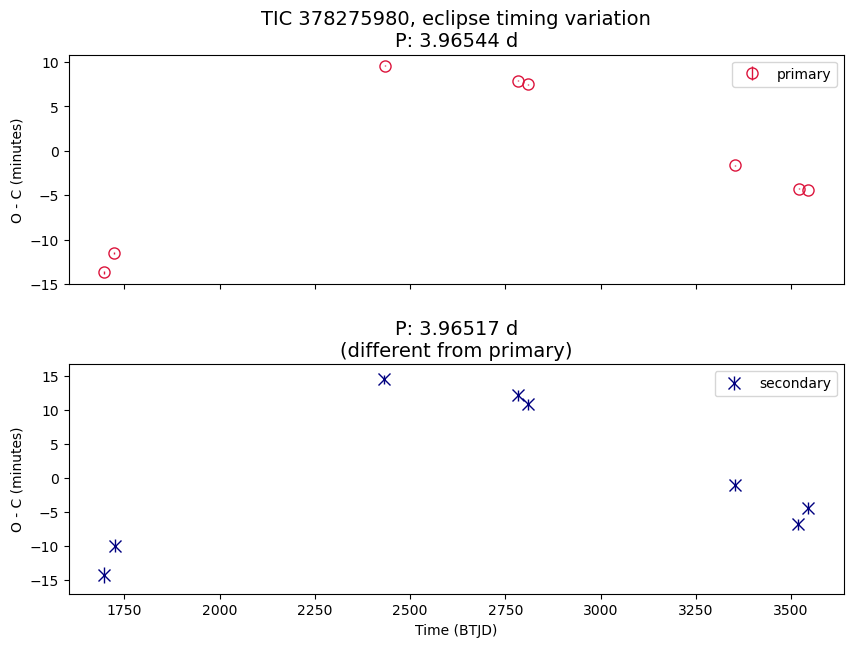

In [16]:
%matplotlib inline
# %matplotlib widget


title_suffix = "eclipse timing variation"

#plot the extracted transit times to check for ETVs

num_rows = 2 if t0_secondary is not None else 1
figsize_y = 3.3 if num_rows == 1 else num_rows * 3.5
# num_rows = 1  # force to plot primary only
# figsize_y = 3.3

fig, axs = plt.subplots(num_rows, 1, figsize=(10, figsize_y), sharex=True)
if isinstance(axs, plt.Axes):  # handle edge case that num_rows == 1, returned axs is not a list
    axs = [axs]

# in_df_primary = pd.read_csv(outfile_path)
from io import StringIO
in_df_primary = pd.read_csv(StringIO(etv_out_str))
in_df_primary['midpoint'] = in_df_primary['epoch'] + (in_df_primary['t0']*period)
in_df_primary['shift_mins'] = in_df_primary['t0']*period*24*60
in_df_primary['std_mins'] = in_df_primary['stdv_t0']*period*24*60
in_df_primary_all = in_df_primary  # in case filtering is helpful

# in_df_primary = in_df_primary[in_df_primary.std_mins < 10]  # filter out outliers in error
# print(f"Note: {len(in_df_primary_all) - len(in_df_primary)} data points in df_primary filtered out due to huge O-C error.")

# axs[0].plot(in_df_primary['epoch'], in_df_primary['shift_mins'],
#              lw = 1, color = 'crimson', )
# axs[0].scatter(in_df_primary['epoch'], in_df_primary['shift_mins'],
#              marker = 'o', s=8**2, color = 'None', edgecolor = 'crimson', label="primary")
axs[0].errorbar(in_df_primary['epoch'], in_df_primary['shift_mins'], yerr = in_df_primary['std_mins'],
             lw = 0, marker = 'o', elinewidth = 1, markersize = 8, color = 'None', ecolor='crimson', markeredgecolor = 'crimson', label="primary")

# if False:
if t0_secondary is not None:
    # in_df_secondary = pd.read_csv(outfile_path_s)
    in_df_secondary = pd.read_csv(StringIO(etv_out_str_s))
    in_df_secondary['midpoint'] = in_df_secondary['epoch'] + (in_df_secondary['t0']*period_s)
    in_df_secondary['shift_mins'] = in_df_secondary['t0']*period_s*24*60
    in_df_secondary['std_mins'] = in_df_secondary['stdv_t0']*period_s*24*60
    in_df_secondary_all = in_df_secondary  # in case filtering is helpful

    # in_df_secondary = in_df_secondary[in_df_secondary.std_mins < 10]  # filter out outliers in error
    # print(f"Note: {len(in_df_secondary_all) - len(in_df_secondary)} data points in in_df_secondary filtered out due to huge O-C error.")

    # axs[1].plot(in_df_secondary['epoch'], in_df_secondary['shift_mins'],
    #              lw = 1, color = 'navy', )
    # axs[1].scatter(in_df_secondary['epoch'], in_df_secondary['shift_mins'],
    #              marker = 'x',  s=9**2, color = 'navy', zorder = -2, label="secondary" );
    axs[1].errorbar(in_df_secondary['epoch'], in_df_secondary['shift_mins'], yerr = in_df_secondary['std_mins'],
                 lw = 0, marker = 'x', elinewidth = 1, markersize = 9, color = 'navy', zorder = -2, label="secondary" );
else:
    in_df_secondary = None

for ax in axs:
    ax.set_ylabel("O - C (minutes)")
    ax.legend();

axs[-1].set_xlabel(f"Time ({search_result.time.format.upper()})")
axs[0].set_title(f"TIC {ticid}, {title_suffix}\nP: {period} d", fontsize=14)
axs[1].set_title(f"P: {period_s} d\n(different from primary)", fontsize=14)

plt.subplots_adjust(hspace=0.35)
# plt.ylim(-3, 8)
plt.show()

## ETV O-C plot (Per-cycle)

Note: 1 data points in df_primary filtered out due to large errors.
Note: 6 data points in in_df_secondary filtered out due to lager errors.


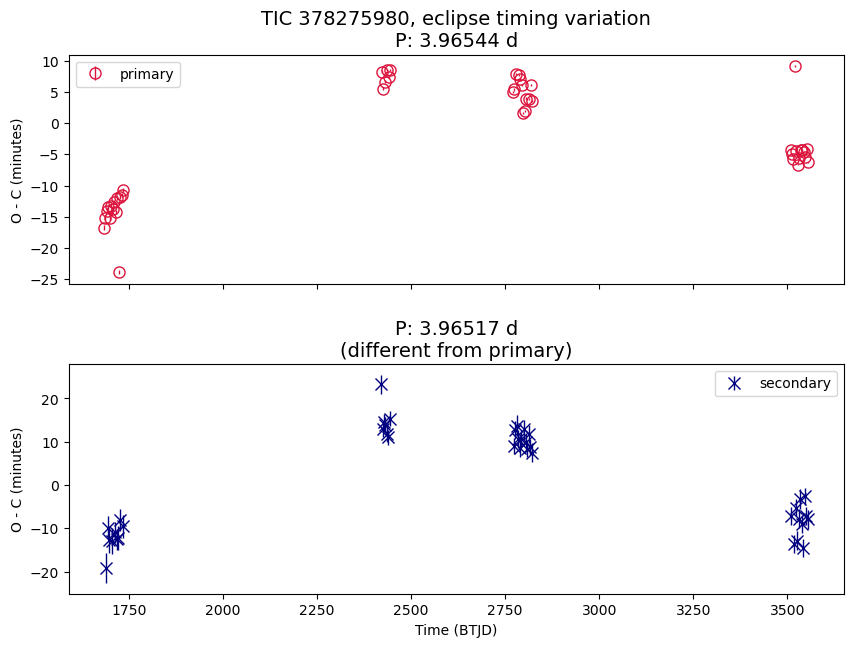

In [49]:
%matplotlib inline
# %matplotlib widget


title_suffix = "eclipse timing variation"

#plot the extracted transit times to check for ETVs

num_rows = 2 if t0_secondary is not None else 1
figsize_y = 3.3 if num_rows == 1 else num_rows * 3.5
# num_rows = 1  # force to plot primary only
# figsize_y = 3.3

fig, axs = plt.subplots(num_rows, 1, figsize=(10, figsize_y), sharex=True)
if isinstance(axs, plt.Axes):  # handle edge case that num_rows == 1, returned axs is not a list
    axs = [axs]

# in_df_primary = pd.read_csv(outfile_path)
from io import StringIO
in_df_primary = pd.read_csv(StringIO(c_etv_out_str))
in_df_primary['midpoint'] = in_df_primary['epoch'] + (in_df_primary['t0']*period)
in_df_primary['shift_mins'] = in_df_primary['t0']*period*24*60
in_df_primary['std_mins'] = in_df_primary['stdv_t0']*period*24*60
in_df_primary_all = in_df_primary  # in case filtering is helpful

in_df_primary = in_df_primary[in_df_primary.std_mins < 10]  # filter out outliers 
print(f"Note: {len(in_df_primary_all) - len(in_df_primary)} data points in df_primary filtered out due to large errors.")

# axs[0].plot(in_df_primary['epoch'], in_df_primary['shift_mins'],
#              lw = 1, color = 'crimson', )
# axs[0].scatter(in_df_primary['epoch'], in_df_primary['shift_mins'],
#              marker = 'o', s=8**2, color = 'None', edgecolor = 'crimson', label="primary")
axs[0].errorbar(in_df_primary['epoch'], in_df_primary['shift_mins'], yerr = in_df_primary['std_mins'],
             lw = 0, marker = 'o', elinewidth = 1, markersize = 8, color = 'None', ecolor='crimson', markeredgecolor = 'crimson', label="primary")

# if False:
if t0_secondary is not None:
    # in_df_secondary = pd.read_csv(outfile_path_s)
    in_df_secondary = pd.read_csv(StringIO(c_etv_out_str_s))
    in_df_secondary['midpoint'] = in_df_secondary['epoch'] + (in_df_secondary['t0']*period_s)
    in_df_secondary['shift_mins'] = in_df_secondary['t0']*period_s*24*60
    in_df_secondary['std_mins'] = in_df_secondary['stdv_t0']*period_s*24*60
    in_df_secondary_all = in_df_secondary  # in case filtering is helpful

    in_df_secondary = in_df_secondary[in_df_secondary.std_mins < 10]  # filter out outliers in 
    print(f"Note: {len(in_df_secondary_all) - len(in_df_secondary)} data points in in_df_secondary filtered out due to lager errors.")

    # axs[1].plot(in_df_secondary['epoch'], in_df_secondary['shift_mins'],
    #              lw = 1, color = 'navy', )
    # axs[1].scatter(in_df_secondary['epoch'], in_df_secondary['shift_mins'],
    #              marker = 'x',  s=9**2, color = 'navy', zorder = -2, label="secondary" );
    axs[1].errorbar(in_df_secondary['epoch'], in_df_secondary['shift_mins'], yerr = in_df_secondary['std_mins'],
                 lw = 0, marker = 'x', elinewidth = 1, markersize = 9, color = 'navy', zorder = -2, label="secondary" );
else:
    in_df_secondary = None

for ax in axs:
    ax.set_ylabel("O - C (minutes)")
    ax.legend();

axs[-1].set_xlabel(f"Time ({search_result.time.format.upper()})")
axs[0].set_title(f"TIC {ticid}, {title_suffix}\nP: {period} d", fontsize=14)
axs[1].set_title(f"P: {period_s} d\n(different from primary)", fontsize=14)

plt.subplots_adjust(hspace=0.35)
# plt.ylim(-3, 8)
plt.show()

### O-C Plot, Zoom In (per cycle)

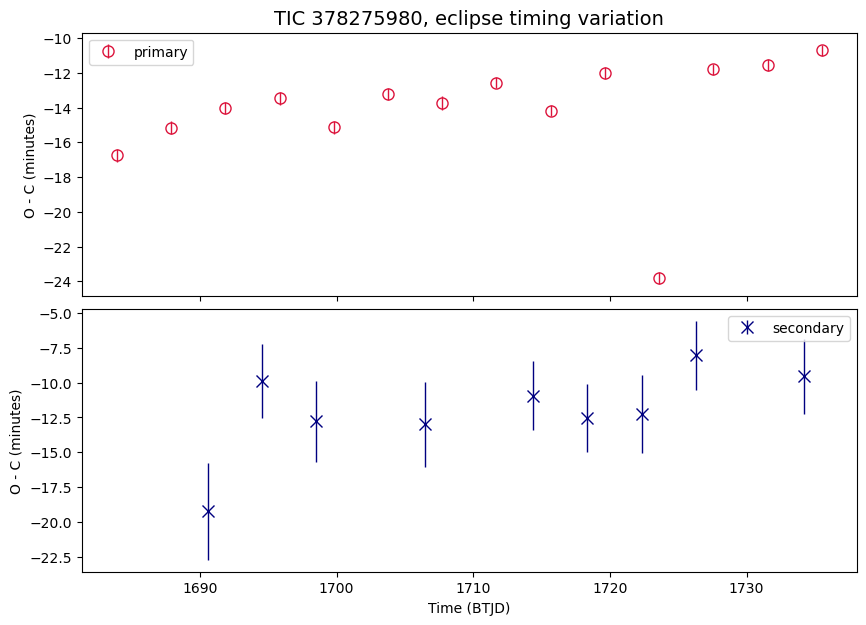

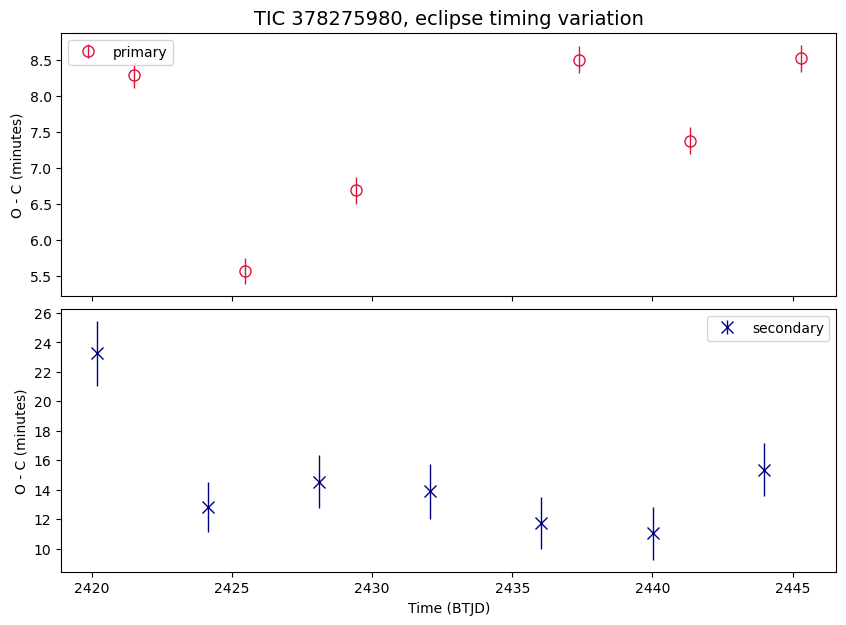

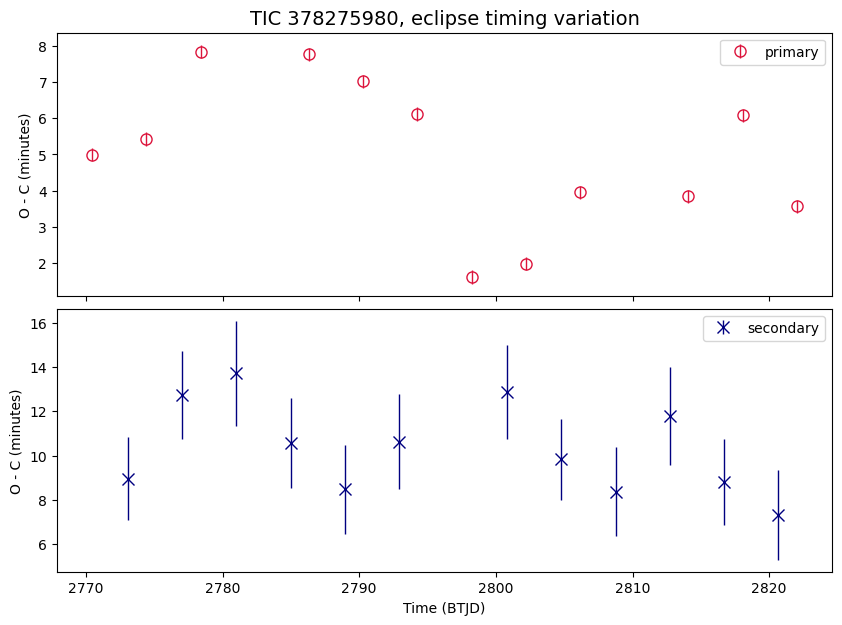

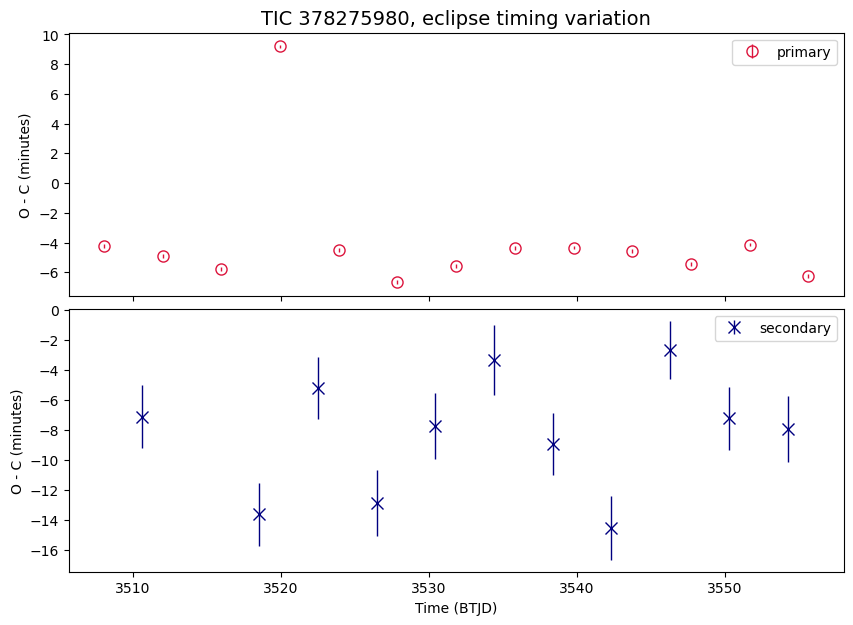

In [50]:
%matplotlib inline
# %matplotlib widget

zoom_ranges = [
    (1600, 1800),
    (2300, 2500),
    (2650, 2900),
    (3400, 3700),
]

def tweak_axs_list(axs_list):
    # axs_list[0][1].set_ylim(-20, 30);
    # axs_list[1][0].set_ylim(None, 0.5);
    # axs_list[1][1].set_ylim(-5.5, 2);

    # ax = axs_list[0][0]
    # ax.set_title(f"{ax.get_title()} (2min cadence)")
    # ax = axs_list[1][0]
    # ax.set_title(f"{ax.get_title()} (2min cadence)")

    pass


def plot_oc_in_zoom_ranges(in_df_primary, in_df_secondary, zoom_ranges):
    axs_list = []
    for zoom_start, zoom_end in zoom_ranges:
        num_rows = 2 if t0_secondary is not None else 1
        figsize_y = 3.3 if num_rows == 1 else num_rows * 3.5

        fig, axs = plt.subplots(num_rows, 1, figsize=(10, figsize_y), sharex=True)
        if isinstance(axs, plt.Axes):  # handle edge case that num_rows == 1, returned axs is not a list
            axs = [axs]

        df_zoom = in_df_primary[(in_df_primary['epoch'] > zoom_start) & (in_df_primary['epoch'] < zoom_end)]

        # axs[0].scatter(df_zoom['epoch'], df_zoom['shift_mins'],
        #                marker = 'o', s=8**2, color = 'None', edgecolor = 'crimson', label="primary")
        axs[0].errorbar(df_zoom['epoch'], df_zoom['shift_mins'], yerr = df_zoom['std_mins'],
                        lw = 0, marker = 'o', elinewidth = 1, markersize = 8, color = 'None', ecolor='crimson', markeredgecolor = 'crimson', label="primary")

        if in_df_secondary is not None:
            df_zoom = in_df_secondary[(in_df_secondary['epoch'] > zoom_start) & (in_df_secondary['epoch'] < zoom_end)]

            # axs[1].scatter(df_zoom['epoch'], df_zoom['shift_mins'],
            #                marker = 'x',  s=9**2, color = 'navy', zorder = -2, label="secondary" );
            axs[1].errorbar(df_zoom['epoch'], df_zoom['shift_mins'], yerr = df_zoom['std_mins'],
                            lw = 0, marker = 'x', elinewidth = 1, markersize = 9, color = 'navy', zorder = -2, label="secondary" );

        for ax in axs:
            ax.set_ylabel("O - C (minutes)")
            ax.legend();

        axs[-1].set_xlabel("Time (BTJD)")
        axs[0].set_title(f"TIC {ticid}, {title_suffix}", fontsize=14)

        plt.subplots_adjust(hspace=0.05)
        axs_list.append(axs)
    return axs_list


axs_list = plot_oc_in_zoom_ranges(in_df_primary, in_df_secondary, zoom_ranges)
tweak_axs_list(axs_list);

## make a periodogram 

In [ ]:
frequency, power = LombScargle(in_df_primary['epoch'], in_df_primary['shift_mins']).autopower()

fig, ax = plt.subplots(figsize=(8, 4))

plt.plot(1/frequency, power, label = 'primary')

if t0_secondary is not None:
    frequency_s, power_s = LombScargle(in_df_secondary['epoch'], in_df_secondary['shift_mins']).autopower()
    plt.plot(1/frequency_s, power_s, label = 'secondary')

plt.xlabel("period")

plt.legend()
# plt.xlim(0, 1000)
plt.show()


if True:
    fig, ax = plt.subplots(figsize=(8, 4))

    plt.plot(1/frequency, power, label = 'primary')

    if t0_secondary is not None:
        plt.plot(1/frequency_s, power_s, label = 'secondary')

    plt.xlabel("period")

    plt.legend()
    plt.xlim(0, 100)
    plt.show()

## O-C plot, folded

- for periodic trend in O-C

In [ ]:
def truncate_freq_power_to_period_range(freq, power, period_min, period_max):
    f, p = freq, power
    if period_min is not None:
        f, p = f[f < 1 / period_min], p[f < 1 / period_min]
    if period_max is not None:
        f, p = f[f > 1 / period_max], p[f >  1 / period_max]
    return f, p


def plot_oc_folded(period_min=None, period_max=None, period_min_s=None, period_max_s=None, period=None, period_s=None):

    if period is None:
        _f, _p = truncate_freq_power_to_period_range(frequency, power, period_min, period_max)
        period = 1 / _f[np.argmax(_p)]
    phase_oc = etv_functions.phase_data(in_df_primary.epoch, 0, period)

    fig, axs = plt.subplots(num_rows, 1, figsize=(10, figsize_y * 1.1), sharex=False)
    if isinstance(axs, plt.Axes):  # handle edge case that num_rows == 1, returned axs is not a list
        axs = [axs]
    
    axs[0].scatter(phase_oc, in_df_primary.shift_mins, marker = 'o', s=12**2, c=in_df_primary.epoch);
    axs[0].errorbar(phase_oc, in_df_primary['shift_mins'], yerr = in_df_primary['std_mins'],
                    lw = 0, marker = 'o', elinewidth = 1, markersize = 8, color = 'None', ecolor='crimson', markeredgecolor = 'None', label="primary")
    axs[0].set_title(f"TIC {ticid}, {title_suffix}\nfolded with P={period:.4f} d", fontsize=14)

    if in_df_secondary is not None:
        if period_s is None:
            _f, _p = truncate_freq_power_to_period_range(frequency_s, power_s, period_min_s, period_max_s)
            period_s= 1 / _f[np.argmax(_p)]
        phase_oc_s = etv_functions.phase_data(in_df_secondary.epoch, 0, period_s)
        axs[1].scatter(phase_oc_s, in_df_secondary.shift_mins, marker = 'o',  s=12**2, c=in_df_secondary.epoch);
        axs[1].errorbar(phase_oc_s, in_df_secondary['shift_mins'], yerr = in_df_secondary['std_mins'],
                        lw = 0, marker = 'o', elinewidth = 1, markersize = 8, color='None', ecolor='navy', markeredgecolor = 'None', label="secondary" );
        axs[1].set_title(f"TIC {ticid}, {title_suffix}\nfolded with P={period_s:.4f} d", fontsize=14)

    for ax in axs:
        ax.set_ylabel("O - C (minutes)")
        ax.set_xlabel("Phase (Normalized)")
        ax.legend();
    plt.subplots_adjust(hspace=0.4)
    return axs

In [ ]:
%matplotlib inline
# %matplotlib widget

if False:  # plot O-C periodic trend by folding with a period (from LS Periodogram by default)
    def tweak_axs(axs):
        pass

    axs = plot_oc_folded(
        period_min=None, period_max=None,
        period_min_s=None, period_max_s=None
    )
    tweak_axs(axs)

## Results Summary

In [51]:
# FILL-IN the ETV results / comments
has_etv = "Y"
comments = "O-C suggests non-linear variation. Correlated. The best fit period for primary is different from the one from secondary"

# Eclipse depth from the model
depth_pct_p = round(-mean_alpha1 * 100, 2)
if t0_secondary is not None:
    depth_pct_s = round(-mean_alpha1_s * 100, 2)
else:
    depth_pct_s = None

summary = {
    "tic": ticid,
    "has_etv": has_etv,
    "comments": comments,
    "period": period,  # the period used in ETV analysis
    "depth_pct_p": depth_pct_p,
    "depth_pct_s": depth_pct_s,
    "epoch_p": t0_primary,
    "epoch_s": t0_secondary,
    "num_sectors": len(sr),
    "time_span": round(time[-1] - time[0], 2),
    "time_start": round(time[0], 2),
    "time_end": round(time[-1], 2),
}

summary = pd.DataFrame.from_dict(summary, orient="index")
with pd.option_context('display.max_colwidth', None, 'display.max_rows', 999, 'display.max_columns', 99):
    display(summary);

# Single line to be added to a CSV
print("")
print(summary.transpose().to_csv(
    index=False,
    header=True,
))

,0
tic,378275980
has_etv,Y
comments,O-C suggests non-linear variation. Correlated. The best fit period for primary is different from the one from secondary
period,3.96544
depth_pct_p,22.14
depth_pct_s,1.51
epoch_p,1683.938
epoch_s,1686.62
num_sectors,8
time_span,1875.89



tic,has_etv,comments,period,depth_pct_p,depth_pct_s,epoch_p,epoch_s,num_sectors,time_span,time_start,time_end
378275980,Y,O-C suggests non-linear variation. Correlated. The best fit period for primary is different from the one from secondary,3.96544,22.14,1.51,1683.938,1686.62,8,1875.89,1683.36,3559.25



## Scratch

100%|██████████████████████████████████████████████████████████| 5000/5000 [00:54<00:00, 91.99it/s]


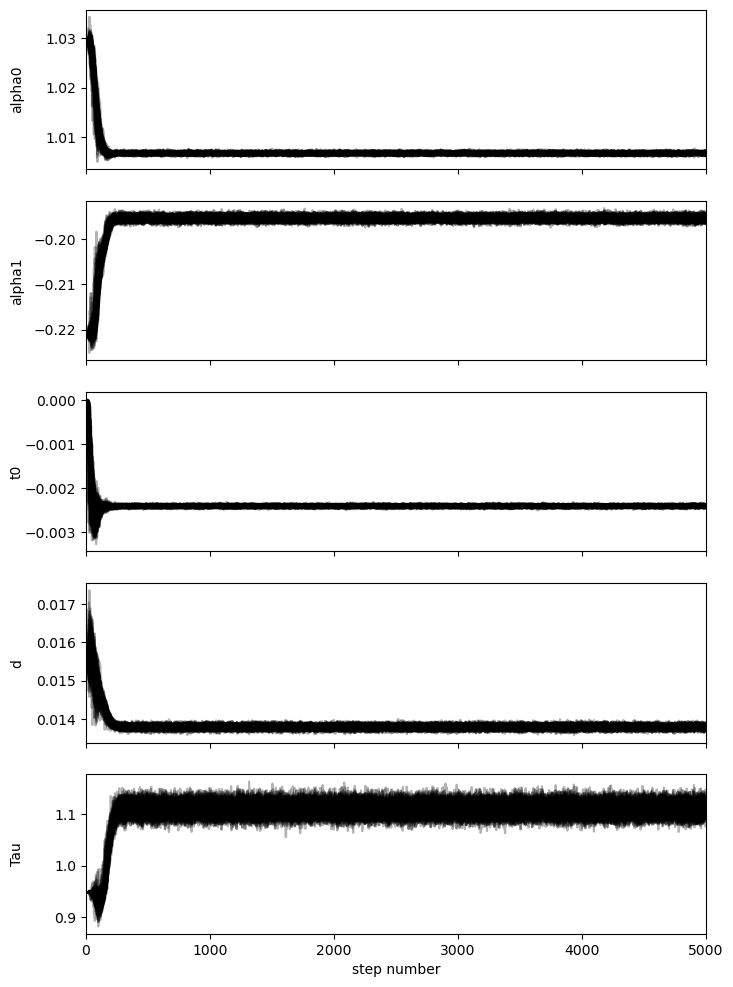

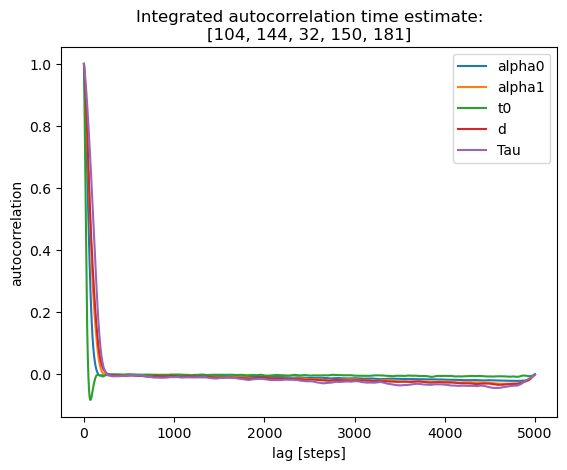

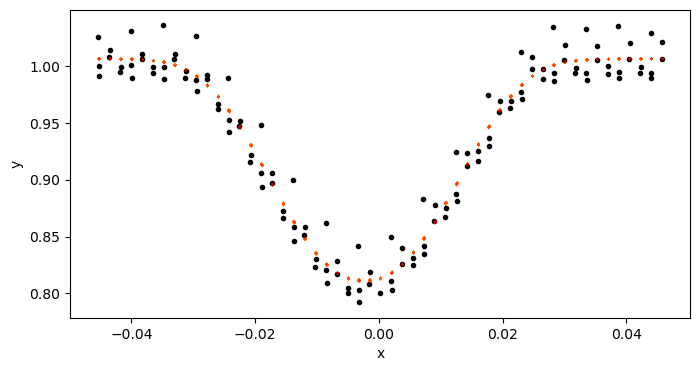

14 1695.9315012660013


100%|██████████████████████████████████████████████████████████| 5000/5000 [00:56<00:00, 89.03it/s]


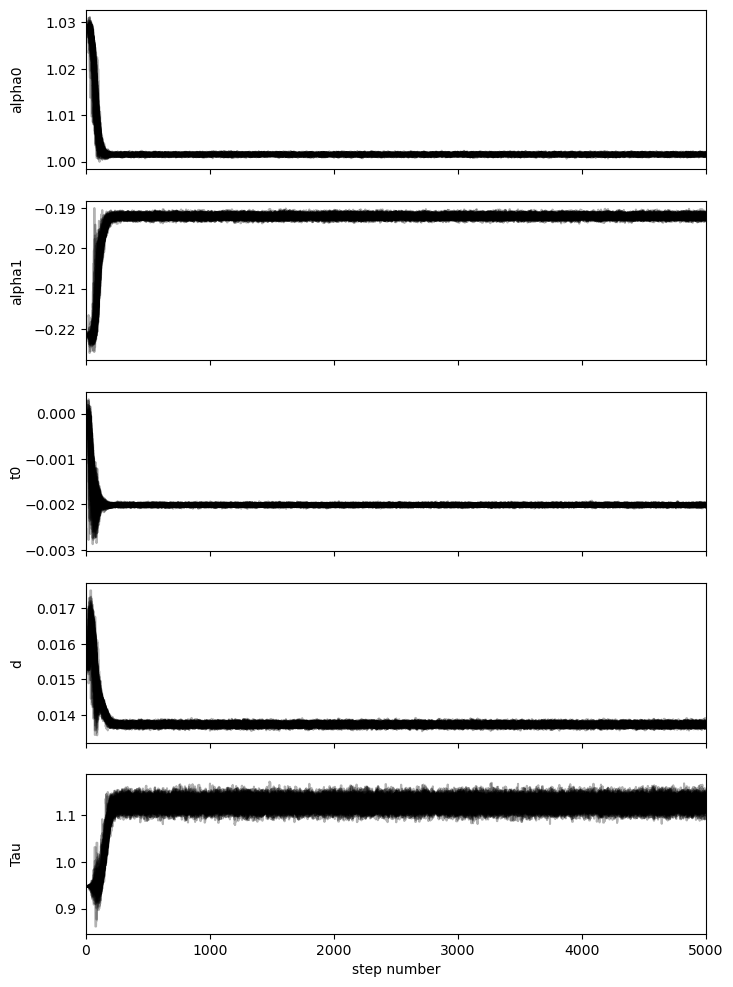

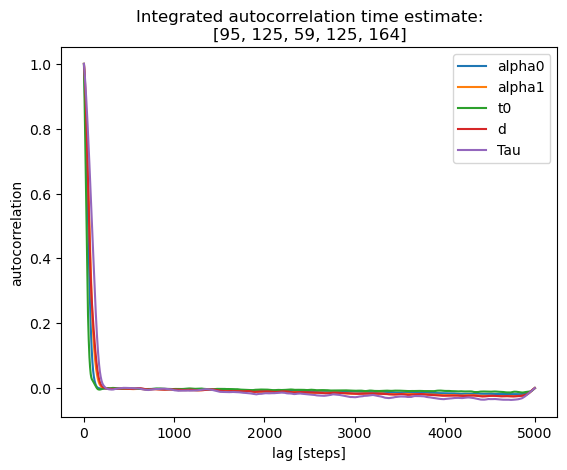

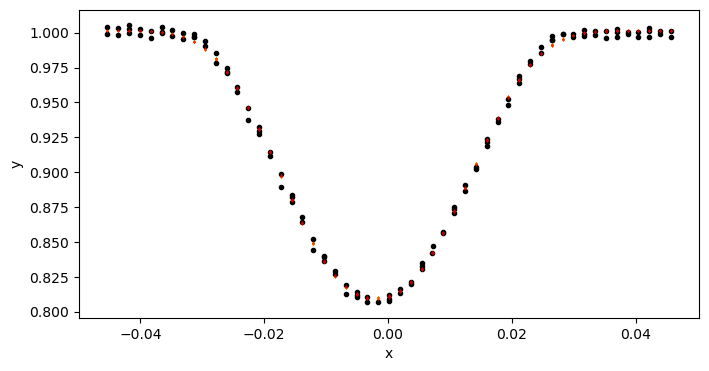

15 1723.658199467935


100%|██████████████████████████████████████████████████████████| 5000/5000 [00:57<00:00, 86.89it/s]


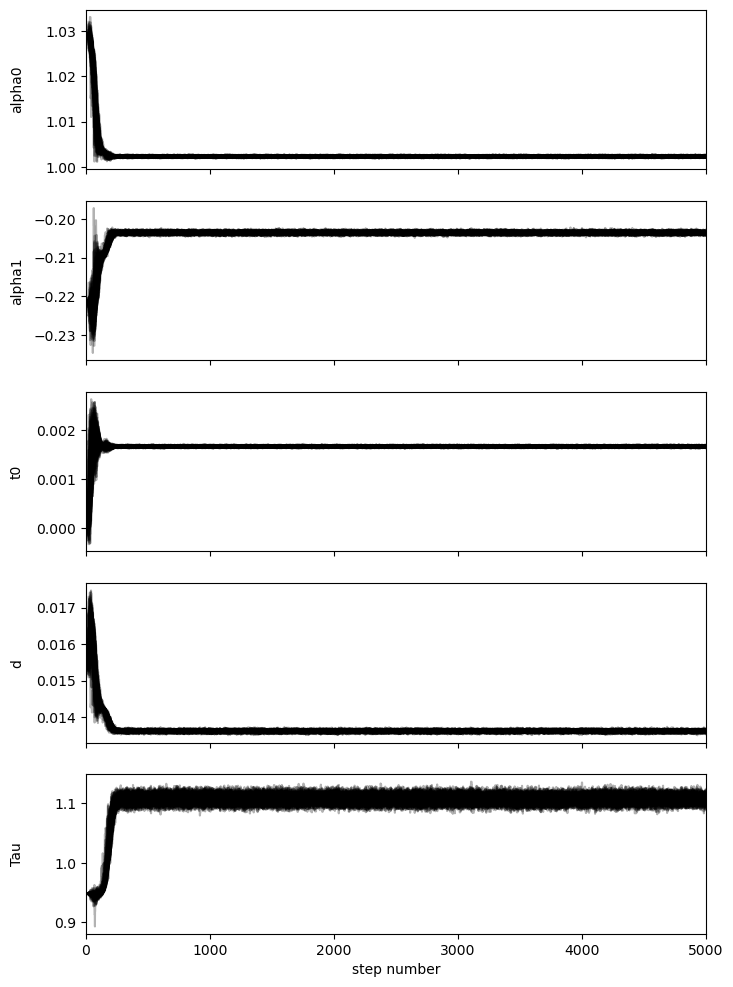

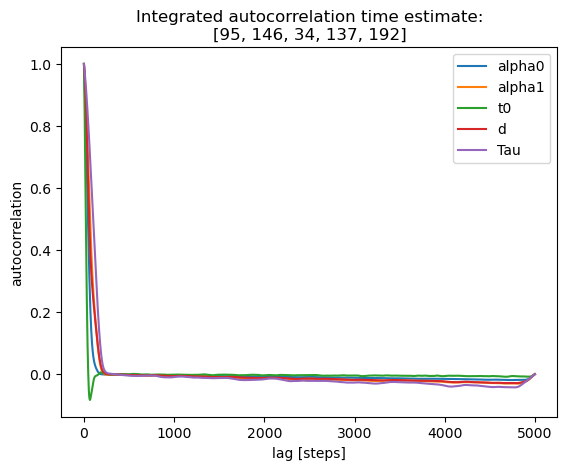

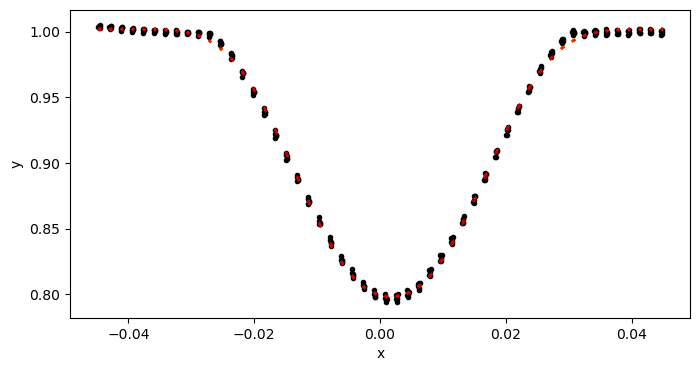

41 2433.4062900678855


100%|██████████████████████████████████████████████████████████| 5000/5000 [25:06<00:00,  3.32it/s]


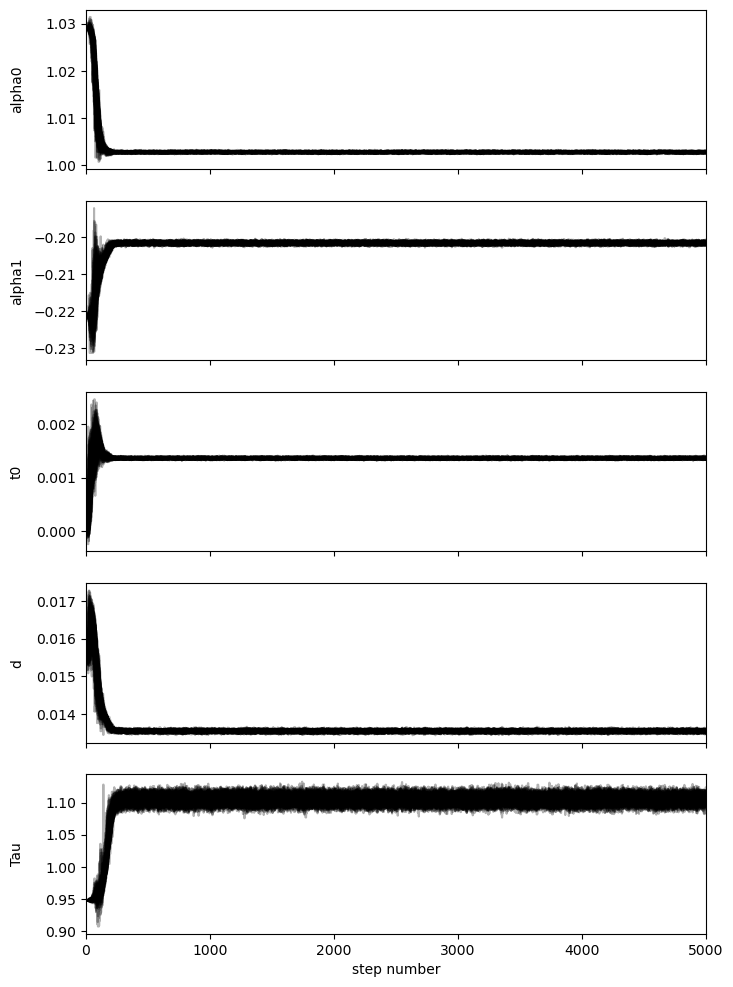

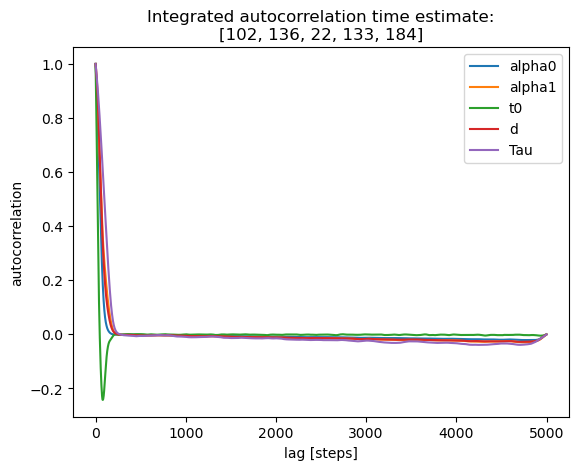

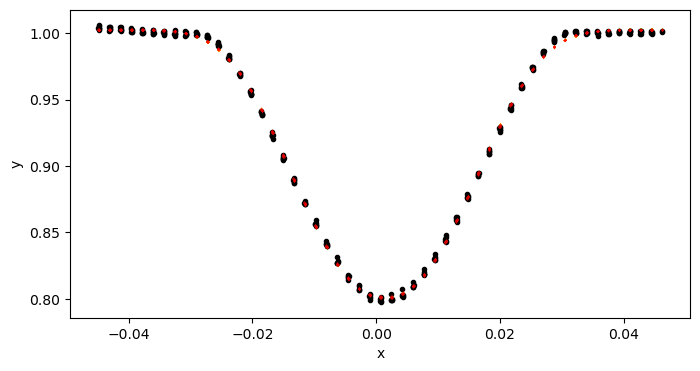

54 2782.3710799563682


100%|██████████████████████████████████████████████████████████| 5000/5000 [01:29<00:00, 56.13it/s]


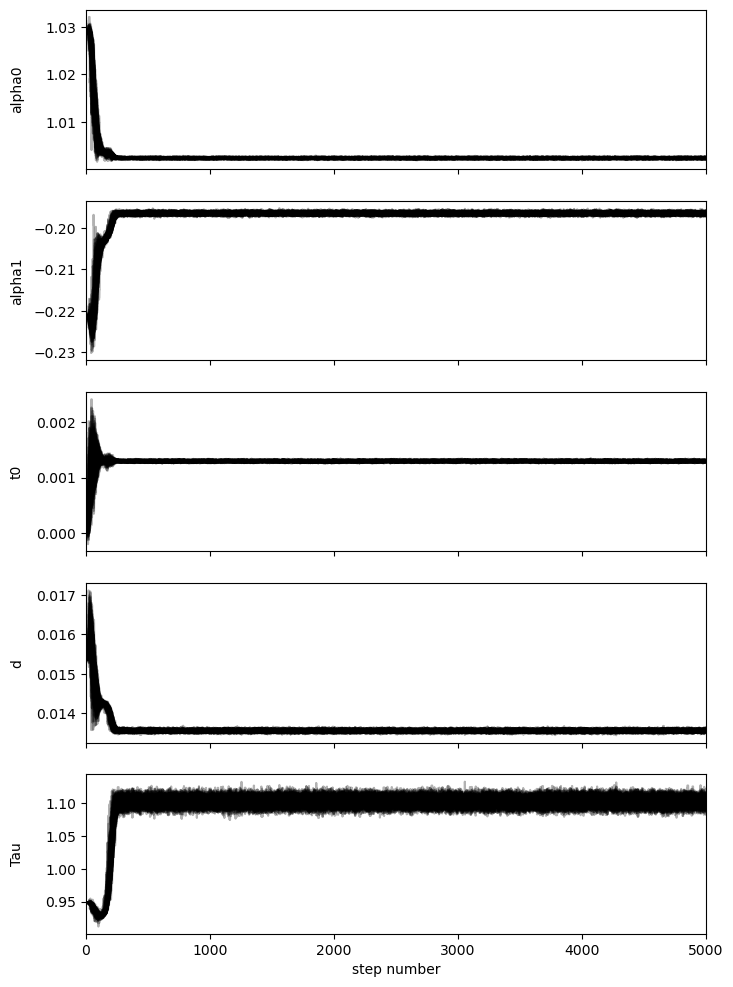

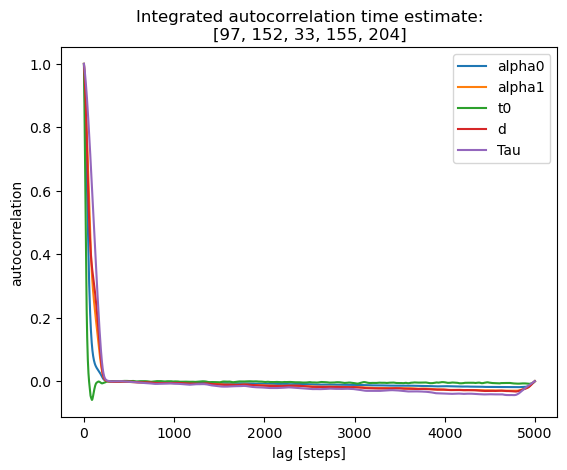

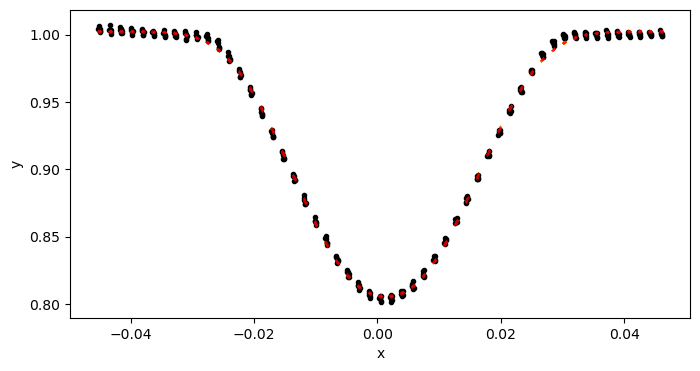

55 2810.1232361042253


100%|██████████████████████████████████████████████████████████| 5000/5000 [01:51<00:00, 44.74it/s]


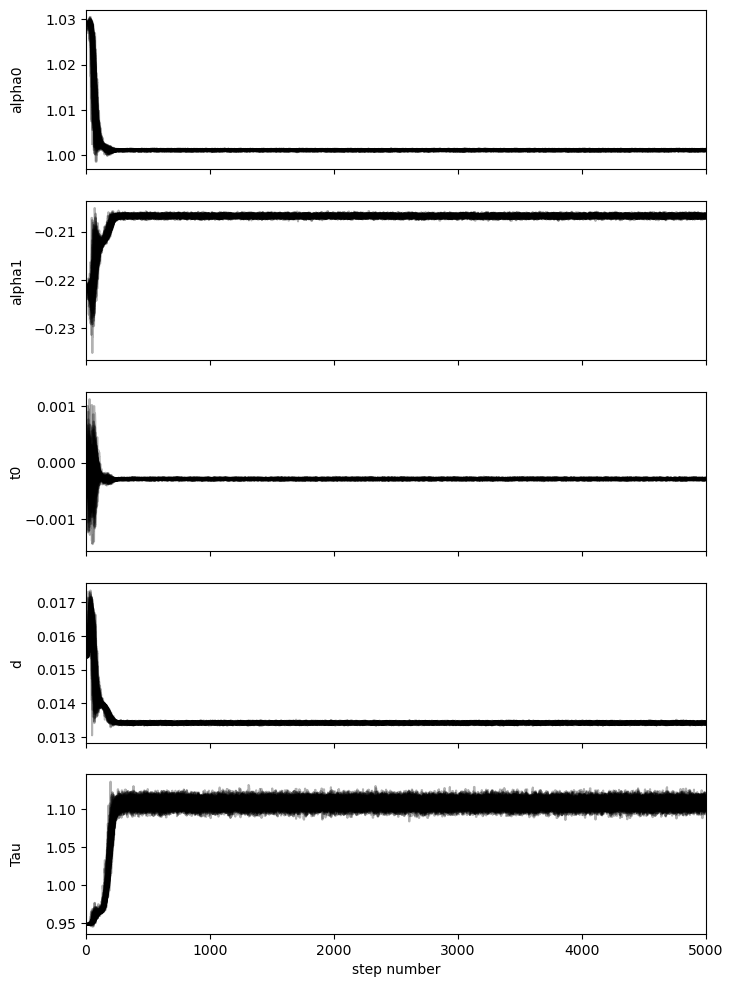

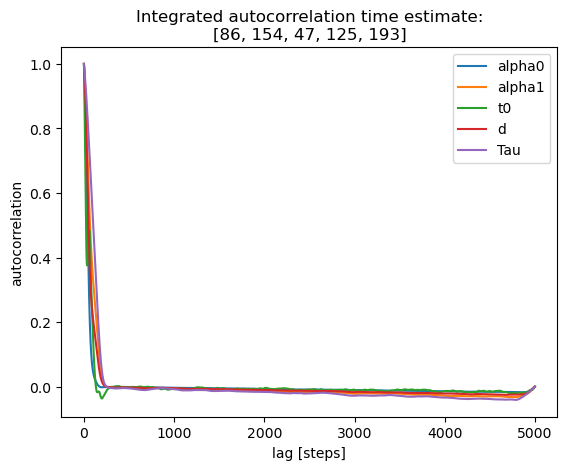

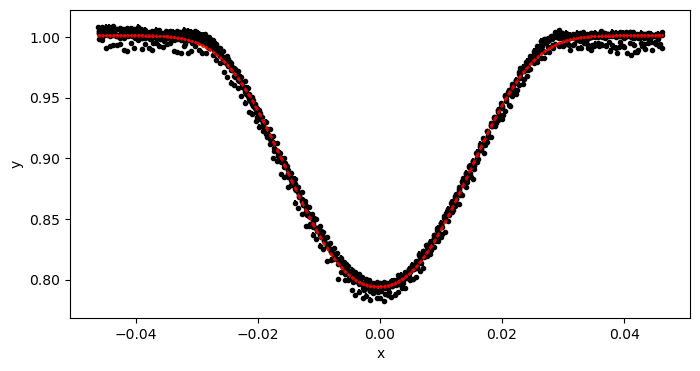

75 3353.408428122994


100%|██████████████████████████████████████████████████████████| 5000/5000 [01:52<00:00, 44.46it/s]


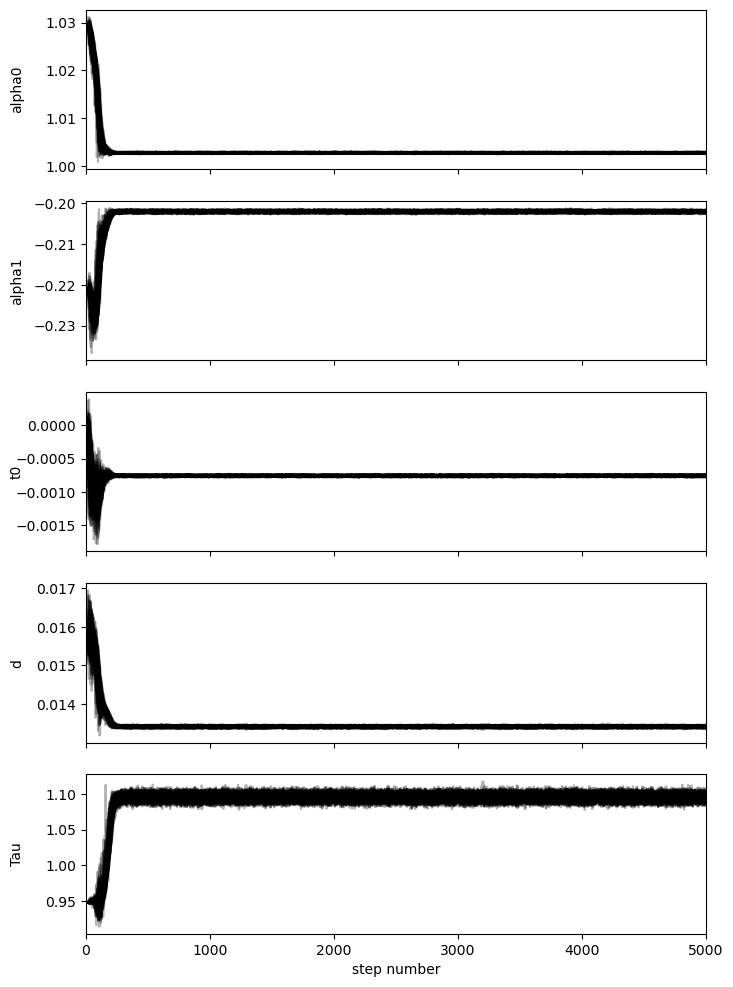

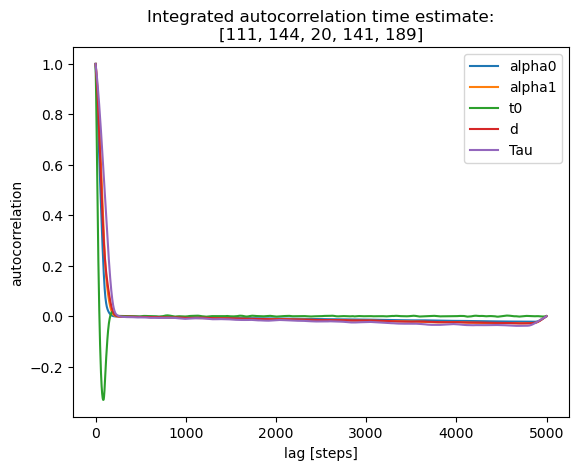

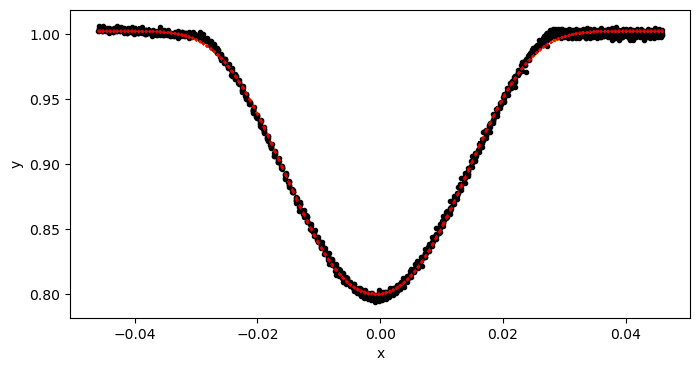

81 3519.9393542579446


100%|██████████████████████████████████████████████████████████| 5000/5000 [01:53<00:00, 44.01it/s]


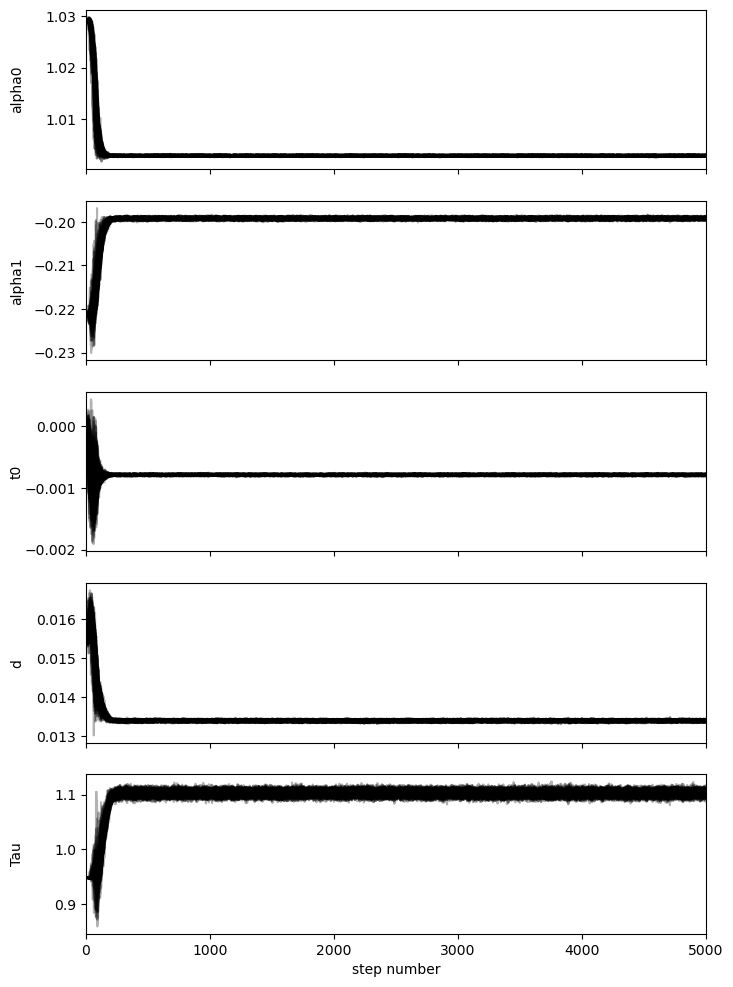

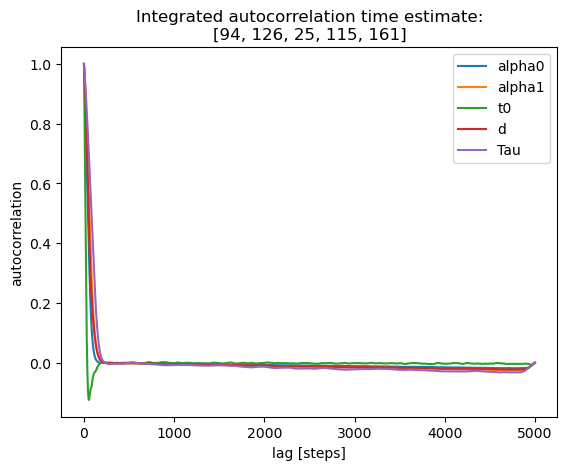

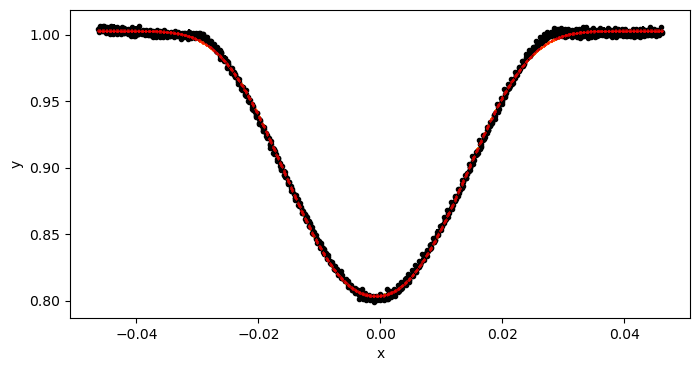

82 3545.7285149604522
number,epoch,mean_alpha0,mean_alpha1,t0,stdv_t0,mean_d,mean_Tau
14,1695.9315012660013,1.0066927208400884,-0.19527320245417712,-0.0024084747249216235,2.1375465836782263e-05,0.013784103568594518,1.1106948080398062
15,1723.658199467935,1.0015170980990435,-0.19204828009247168,-0.0020137798119000826,1.9176969233845507e-05,0.013731336741963591,1.1247796662711322
41,2433.4062900678855,1.0022956254234265,-0.20358801541971,0.0016672408607406636,1.178539469240903e-05,0.013618416876736969,1.1073912631486325
54,2782.3710799563682,1.0027762420770063,-0.20158795827436782,0.0013609292818985096,1.1756651738611195e-05,0.013545391418521624,1.104813737741508
55,2810.1232361042253,1.0023747953047912,-0.19647183841396995,0.0012982294331478459,1.1806961835950924e-05,0.013559837109337999,1.1027283501990364
75,3353.408428122994,1.0011521908833965,-0.20678402169415633,-0.0002912834787168352,9.392960604539041e-06,0.013417520583959432,1.107503010415923
81,3519.9393542579446,1.00281745463472

In [55]:
# Experiment to see if including ingress / egress would signficiantly change the result
# - note: alpha0 / alpha1 don't converge well at all, but it does not seem to significantly affect the result.

from types import SimpleNamespace

etv_out_str_wide_win = "number,epoch,mean_alpha0,mean_alpha1,t0,stdv_t0,mean_d,mean_Tau\n"

for lc in lcc_tess[:]: 
    lc_f = lc.fold(epoch_time=t0_primary, period=period, normalize_phase=True)
    lc_f = lc_f.truncate(-window_width_p / 2 * 2, window_width_p / 2 * 2)
    lc_f = lc_f.truncate(0.75, 1.07, column="flux")  # crude remove outliers
    # ax = lc_f.scatter(label=f"S. {lc.sector}");  # for diagnostics
    
    # convert lc to the form needed by fit etv_functions
    lc_f_data = SimpleNamespace(time=lc_f.time_original.value, phase=lc_f.time.value, flux=np.array(lc_f.flux.value), err=np.array(lc_f.flux_err.value))
    
    start_vals = [mean_alpha0, mean_alpha1, 0, mean_d, mean_Tau]  # mean_t0 is not helpful at all
    _alpha0, _alpha1, _t0, _d, _Tau, _fit_params_stats = etv_functions.run_mcmc_initial_fit(
        lc_f_data, start_vals, 
        # nruns=40, discard=6, 
        nruns=5000, discard=1000,  # 3000  is probably sufficient
        autocorr_time_kwargs=dict(tol=20), pool=-2, plot_chains=True,  plot_autocorrelation=True, plot=True, also_return_stats=True)
    
    _stdv_t0 = _fit_params_stats["std_t0"]
    _t = np.mean(lc_f.time_original.value)  # approximate transit time 
    print(lc.sector, _t)
    
    etv_out_str_wide_win += ",".join([str(s) for s in [lc.sector, _t, _alpha0, _alpha1, _t0, _stdv_t0, _d, _Tau]])
    etv_out_str_wide_win += "\n"

print(etv_out_str_wide_win)

In [ ]:
# # save the result in a cell for safekeeping
# etv_out_str_wide_win = """\
# number,epoch,mean_alpha0,mean_alpha1,t0,stdv_t0,mean_d,mean_Tau
# 14,1695.9315012660013,1.0066927208400884,-0.19527320245417712,-0.0024084747249216235,2.1375465836782263e-05,0.013784103568594518,1.1106948080398062
# 15,1723.658199467935,1.0015170980990435,-0.19204828009247168,-0.0020137798119000826,1.9176969233845507e-05,0.013731336741963591,1.1247796662711322
# 41,2433.4062900678855,1.0022956254234265,-0.20358801541971,0.0016672408607406636,1.178539469240903e-05,0.013618416876736969,1.1073912631486325
# 54,2782.3710799563682,1.0027762420770063,-0.20158795827436782,0.0013609292818985096,1.1756651738611195e-05,0.013545391418521624,1.104813737741508
# 55,2810.1232361042253,1.0023747953047912,-0.19647183841396995,0.0012982294331478459,1.1806961835950924e-05,0.013559837109337999,1.1027283501990364
# 75,3353.408428122994,1.0011521908833965,-0.20678402169415633,-0.0002912834787168352,9.392960604539041e-06,0.013417520583959432,1.107503010415923
# 81,3519.9393542579446,1.0028174546347262,-0.20214997675154256,-0.0007589386744599292,7.957789316644965e-06,0.013413070053184852,1.095434952043832
# 82,3545.7285149604522,1.0028812010369124,-0.1992482266901794,-0.0007895575604011098,8.575197991774063e-06,0.01338562252679059,1.1023402314862523
# """

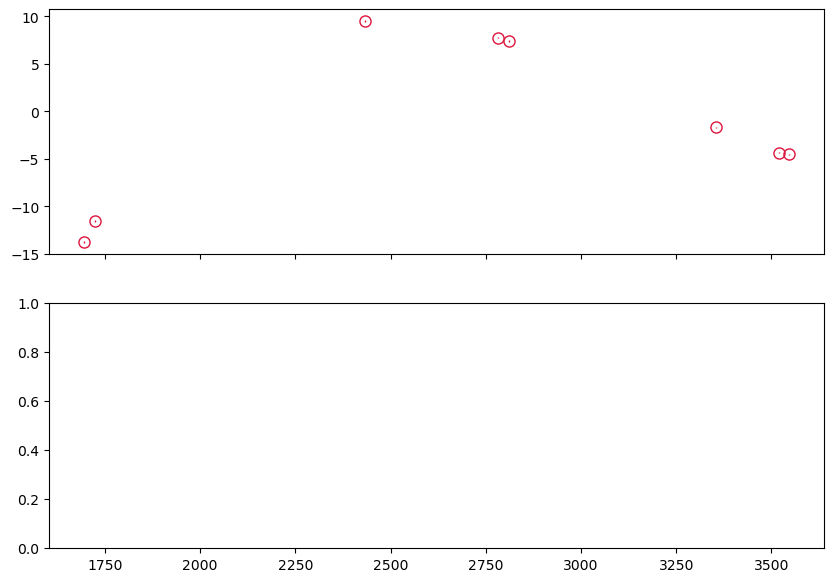

In [56]:
%matplotlib inline
# %matplotlib widget


title_suffix = "eclipse timing variation"

#plot the extracted transit times to check for ETVs

num_rows = 2 if t0_secondary is not None else 1
figsize_y = 3.3 if num_rows == 1 else num_rows * 3.5
# num_rows = 1  # force to plot primary only
# figsize_y = 3.3

fig, axs = plt.subplots(num_rows, 1, figsize=(10, figsize_y), sharex=True)
if isinstance(axs, plt.Axes):  # handle edge case that num_rows == 1, returned axs is not a list
    axs = [axs]

from io import StringIO
in_df_primary = pd.read_csv(StringIO(etv_out_str_wide_win))
in_df_primary['midpoint'] = in_df_primary['epoch'] + (in_df_primary['t0']*period)
in_df_primary['shift_mins'] = in_df_primary['t0']*period*24*60
in_df_primary['std_mins'] = in_df_primary['stdv_t0']*period*24*60
in_df_primary_all = in_df_primary  # in case filtering is helpful

axs[0].errorbar(in_df_primary['epoch'], in_df_primary['shift_mins'], yerr = in_df_primary['std_mins'],
             lw = 0, marker = 'o', elinewidth = 1, markersize = 8, color = 'None', ecolor='crimson', markeredgecolor = 'crimson', label="primary");